In [22]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [23]:
from utils import Logger

In [24]:
#Normalize the data between -1 to 1 
def mnist_data():
    compose = transforms.Compose([transforms.ToTensor(),
transforms.Normalize((0.5,), (0.5,))
])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)# Load data
data = mnist_data()# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

In [25]:
#Discriminator
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [26]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [27]:
#Generator
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh() #normalization or activation layers
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [28]:
#noise
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

In [29]:
#Adam optimizer 
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

In [30]:
#Loss Function: Binary Cross Entopy Loss (BCE Loss)
loss = nn.BCELoss()

In [31]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [32]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [33]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)    # Reset gradients
    optimizer.zero_grad()    # Sample noise and generate fake data
    prediction = discriminator(fake_data)    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()    # Update weights with gradients
    optimizer.step()    # Return error
    return error

In [34]:
num_test_samples = 16
test_noise = noise(num_test_samples)

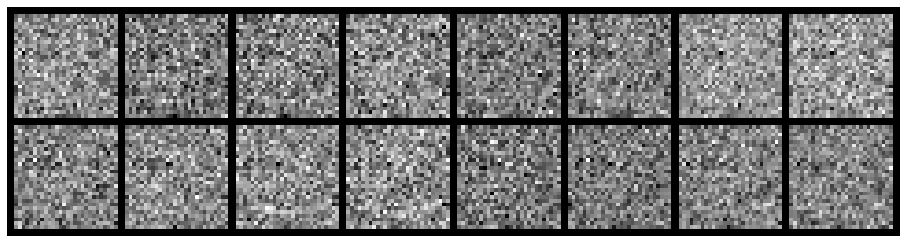

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3812, Generator Loss: 0.7095
D(x): 0.4947, D(G(z)): 0.4918


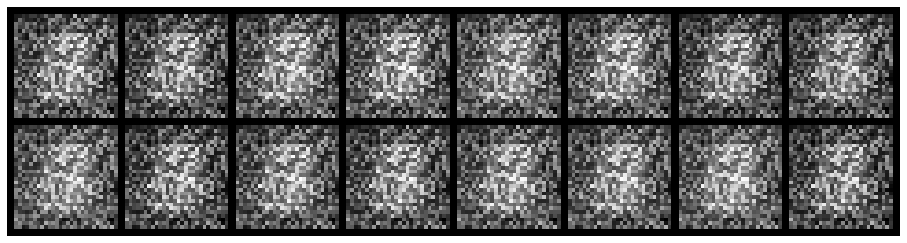

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 1.2279, Generator Loss: 1.3971
D(x): 0.7164, D(G(z)): 0.4669


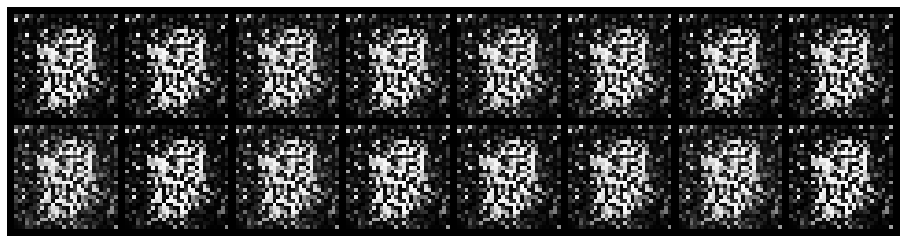

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.5288, Generator Loss: 2.7325
D(x): 0.8495, D(G(z)): 0.2664


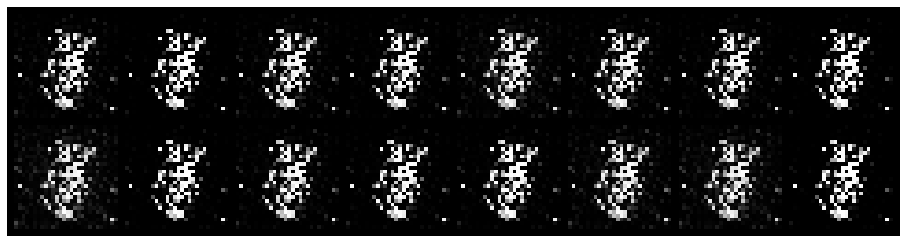

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0224, Generator Loss: 9.8209
D(x): 0.9815, D(G(z)): 0.0028


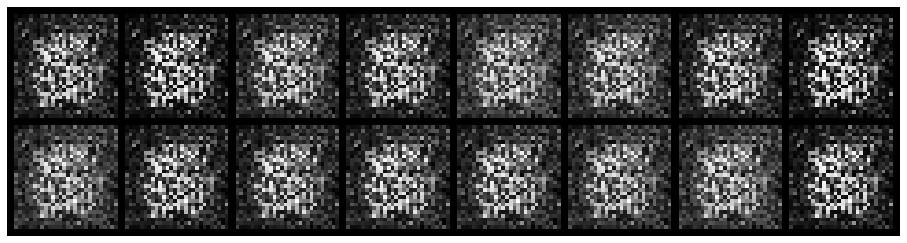

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.3335, Generator Loss: 3.3112
D(x): 0.8649, D(G(z)): 0.1627


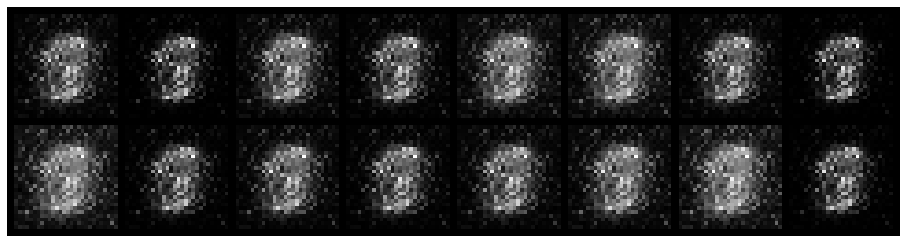

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 1.5639, Generator Loss: 0.6011
D(x): 0.5276, D(G(z)): 0.5748


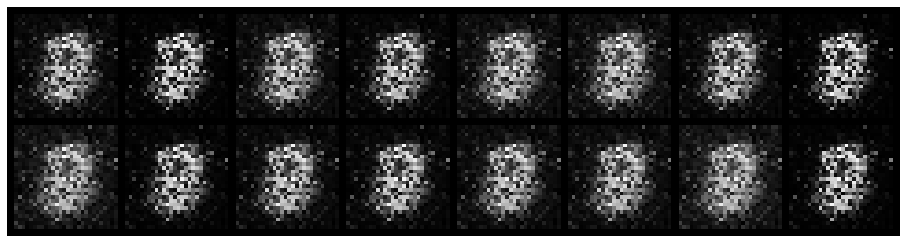

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.2582, Generator Loss: 0.8693
D(x): 0.5093, D(G(z)): 0.4332


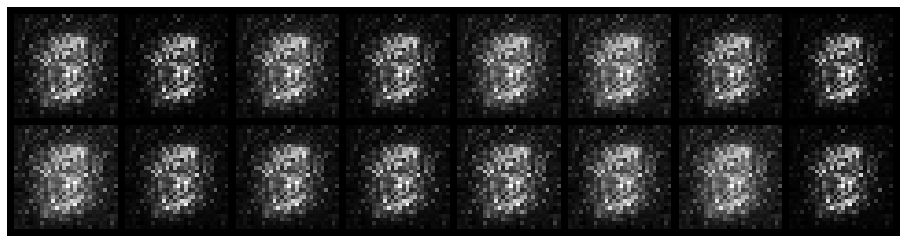

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 1.2574, Generator Loss: 1.3584
D(x): 0.6117, D(G(z)): 0.4215


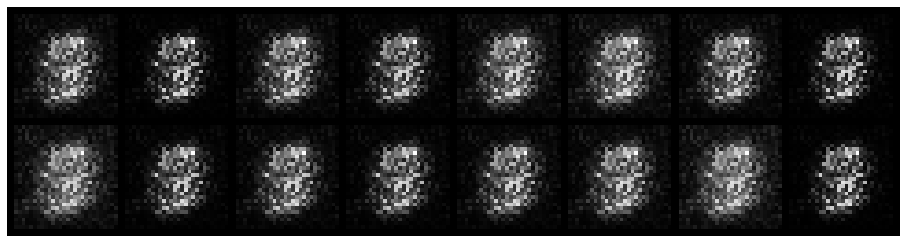

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 1.3160, Generator Loss: 1.0636
D(x): 0.5150, D(G(z)): 0.4189


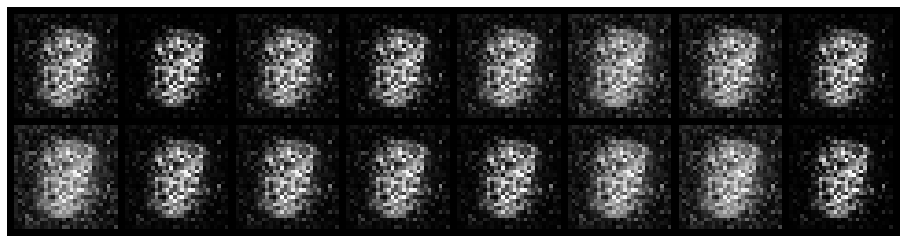

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.9308, Generator Loss: 1.1774
D(x): 0.6311, D(G(z)): 0.6983


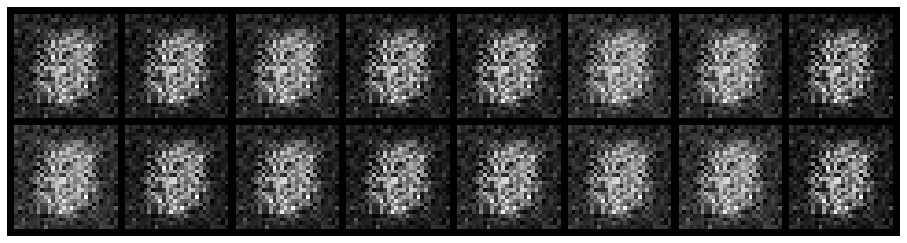

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 2.3450, Generator Loss: 0.3692
D(x): 0.5857, D(G(z)): 0.7839


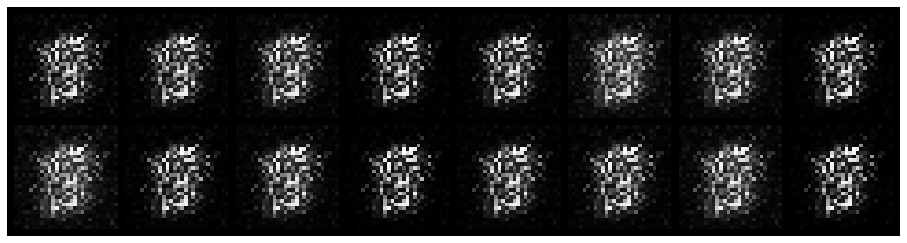

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.2274, Generator Loss: 1.2088
D(x): 0.5993, D(G(z)): 0.4249


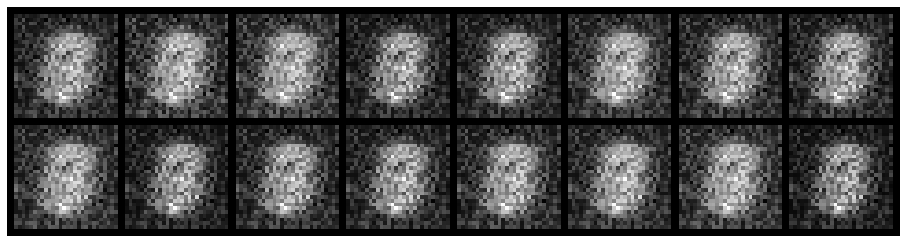

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.5716, Generator Loss: 2.8352
D(x): 0.8176, D(G(z)): 0.2301


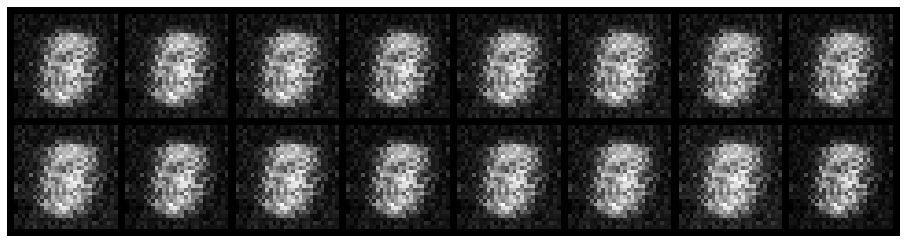

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.0190, Generator Loss: 1.0975
D(x): 0.6575, D(G(z)): 0.4070


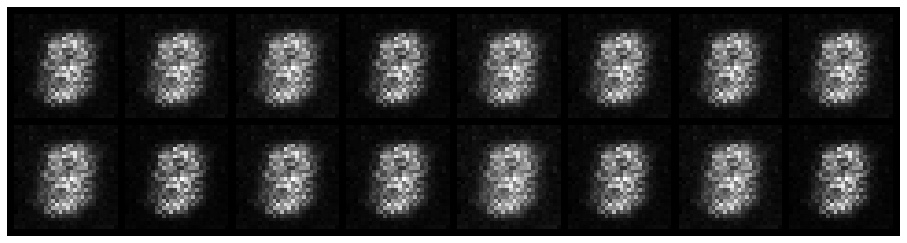

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 2.3628, Generator Loss: 1.4380
D(x): 0.4712, D(G(z)): 0.5735


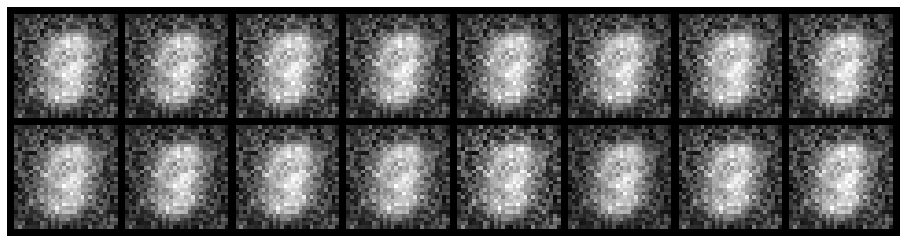

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.4464, Generator Loss: 2.5401
D(x): 0.8095, D(G(z)): 0.1622


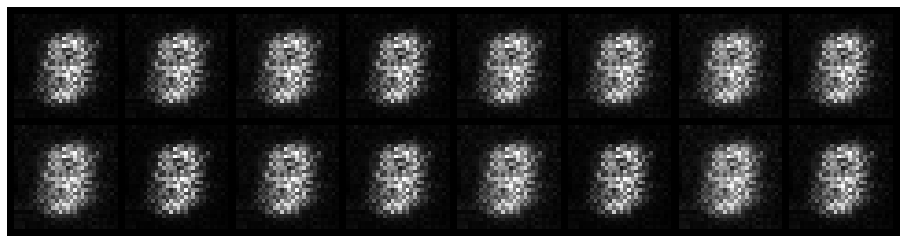

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 1.1431, Generator Loss: 1.1431
D(x): 0.6212, D(G(z)): 0.4069


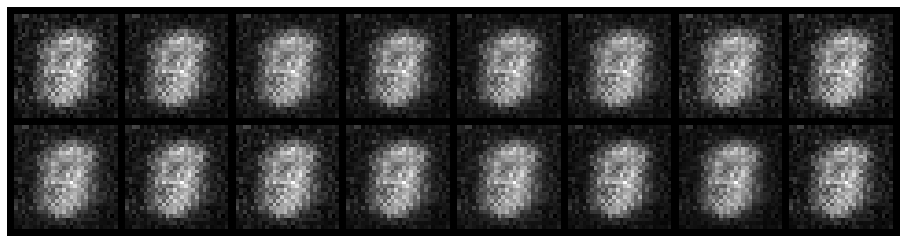

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.8913, Generator Loss: 1.1025
D(x): 0.6848, D(G(z)): 0.3659


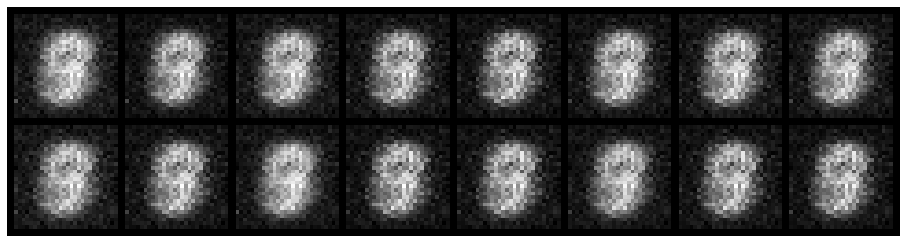

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.0395, Generator Loss: 1.3139
D(x): 0.7044, D(G(z)): 0.3668


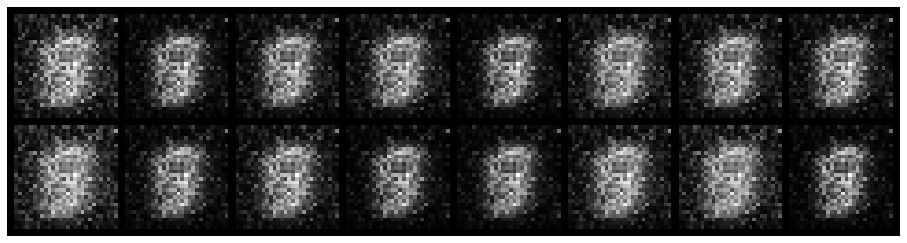

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.5083, Generator Loss: 1.7852
D(x): 0.8585, D(G(z)): 0.2245


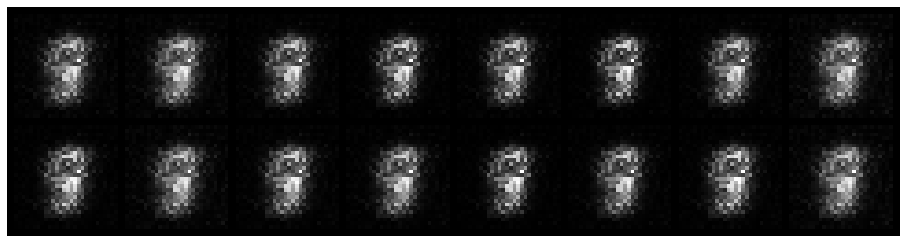

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.4086, Generator Loss: 3.3957
D(x): 0.8616, D(G(z)): 0.1163


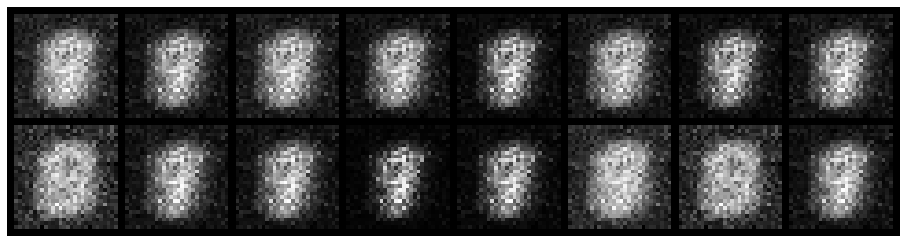

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.5245, Generator Loss: 3.4574
D(x): 0.9054, D(G(z)): 0.1860


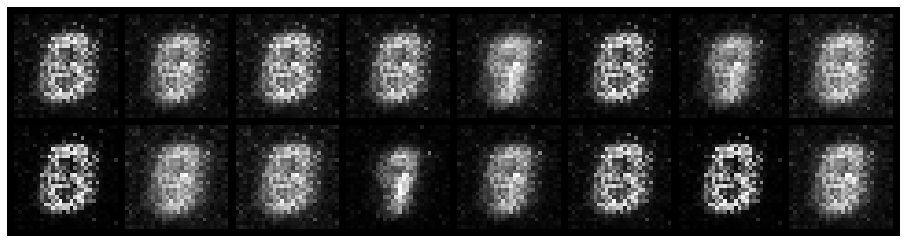

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.6198, Generator Loss: 1.4075
D(x): 0.8159, D(G(z)): 0.2477


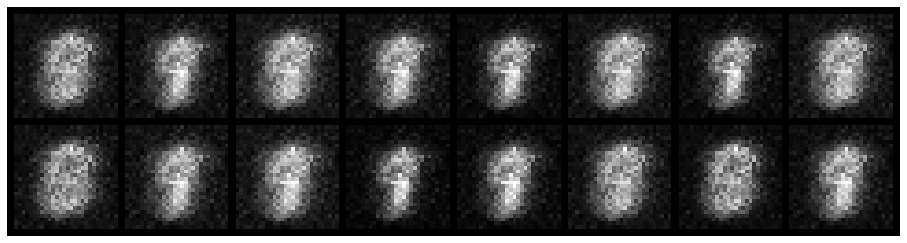

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.3233, Generator Loss: 2.9344
D(x): 0.8768, D(G(z)): 0.0970


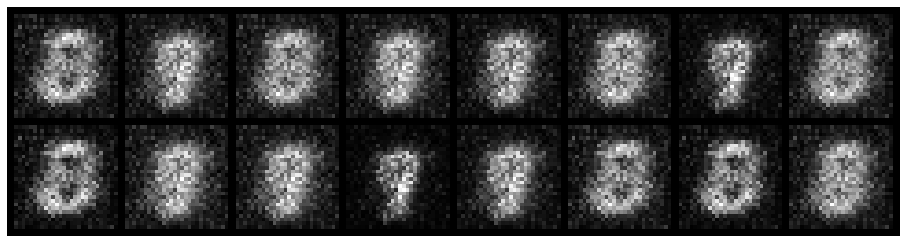

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.1471, Generator Loss: 3.8901
D(x): 0.9477, D(G(z)): 0.0579


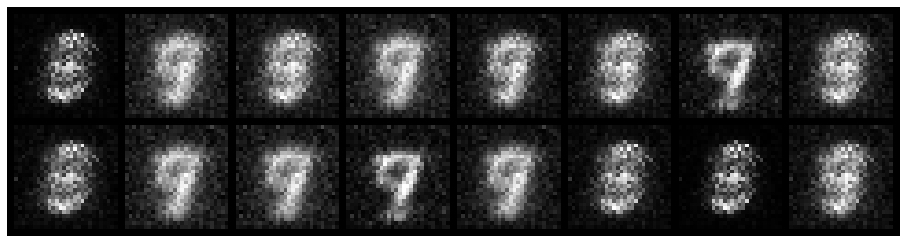

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.7576, Generator Loss: 2.2364
D(x): 0.7710, D(G(z)): 0.1732


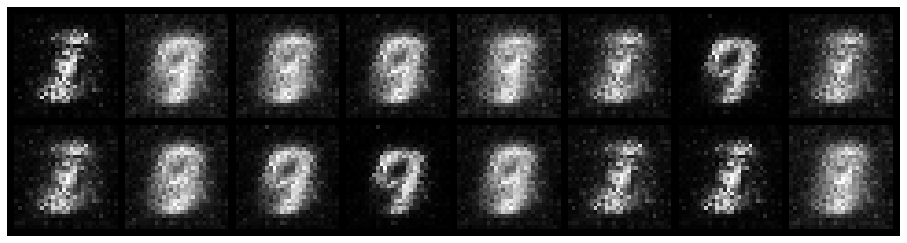

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.7101, Generator Loss: 2.1450
D(x): 0.8508, D(G(z)): 0.2909


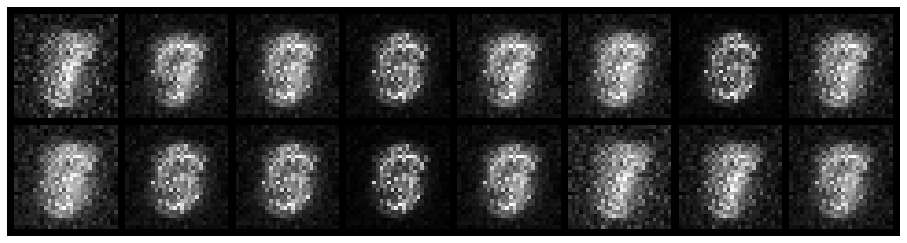

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3321, Generator Loss: 3.5020
D(x): 0.9031, D(G(z)): 0.1149


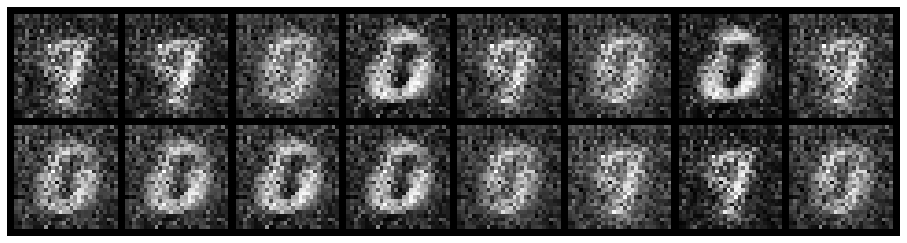

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.4189, Generator Loss: 2.5325
D(x): 0.8859, D(G(z)): 0.1448


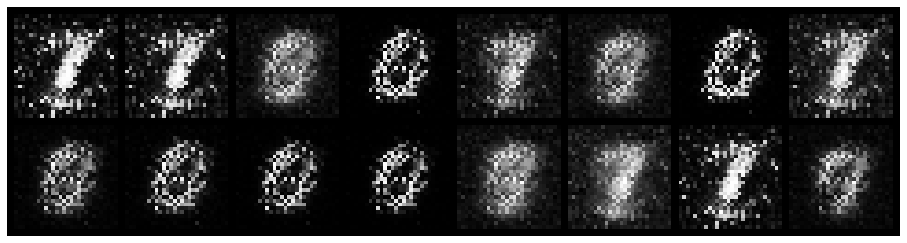

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.1412, Generator Loss: 3.9735
D(x): 0.9683, D(G(z)): 0.0853


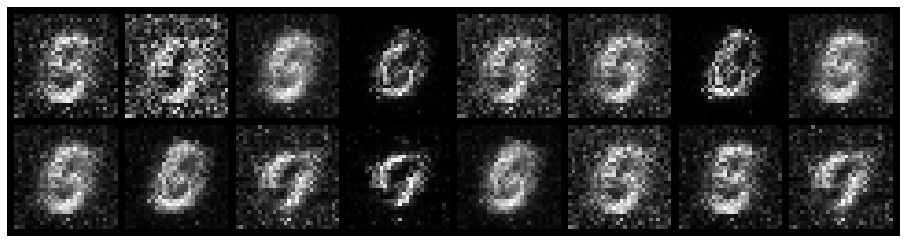

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.5070, Generator Loss: 4.2157
D(x): 0.8712, D(G(z)): 0.0974


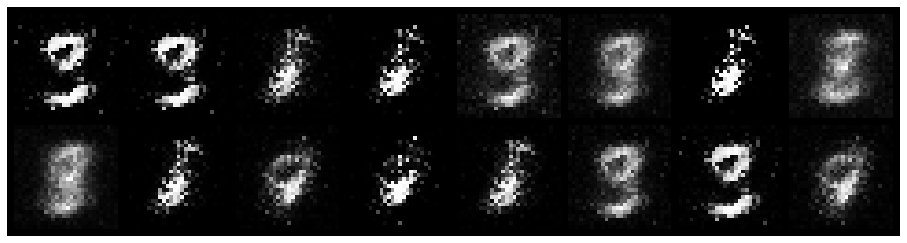

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 1.6475, Generator Loss: 2.4360
D(x): 0.5974, D(G(z)): 0.2919


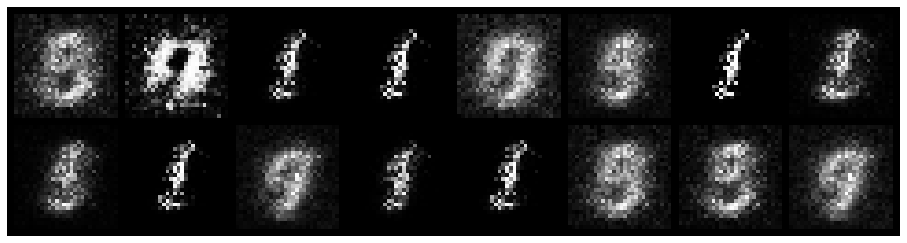

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.4352, Generator Loss: 2.9833
D(x): 0.9025, D(G(z)): 0.1727


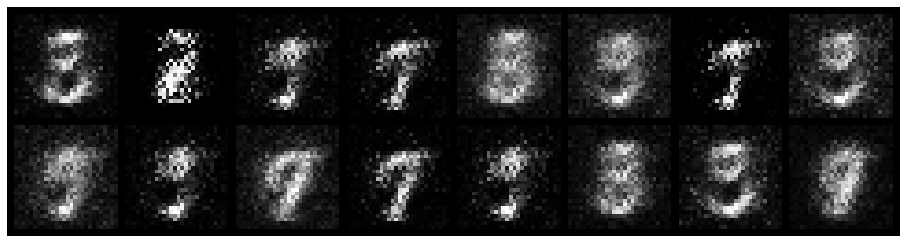

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.5123, Generator Loss: 3.8979
D(x): 0.8179, D(G(z)): 0.0844


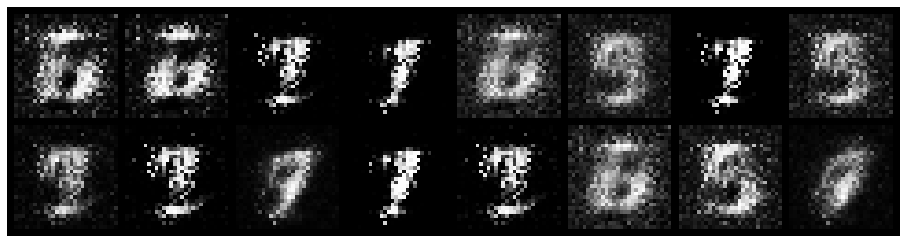

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.5787, Generator Loss: 3.7821
D(x): 0.8469, D(G(z)): 0.2156


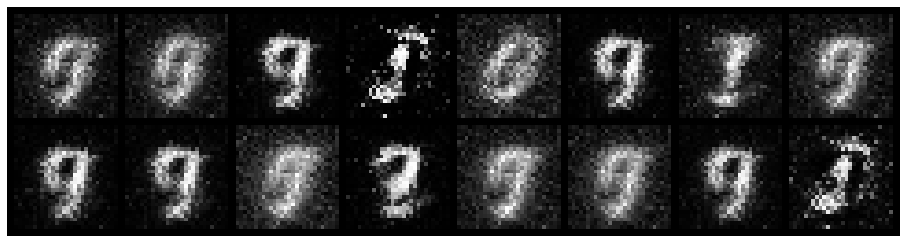

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.4700, Generator Loss: 3.2537
D(x): 0.8115, D(G(z)): 0.0812


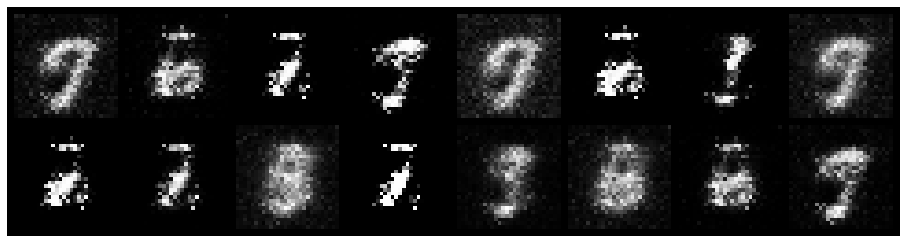

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.3501, Generator Loss: 4.2893
D(x): 0.8644, D(G(z)): 0.0725


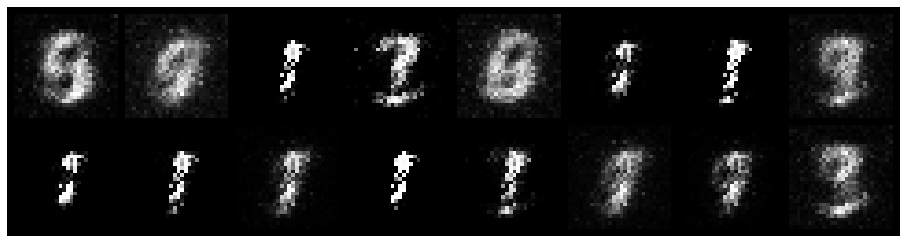

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.5333, Generator Loss: 2.0846
D(x): 0.8142, D(G(z)): 0.1514


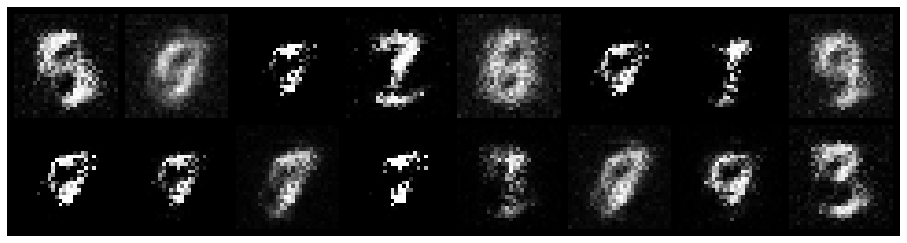

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.3653, Generator Loss: 2.7769
D(x): 0.9078, D(G(z)): 0.1675


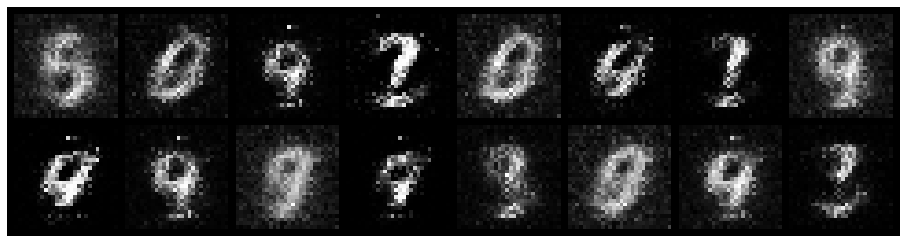

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.2858, Generator Loss: 3.0207
D(x): 0.9475, D(G(z)): 0.1686


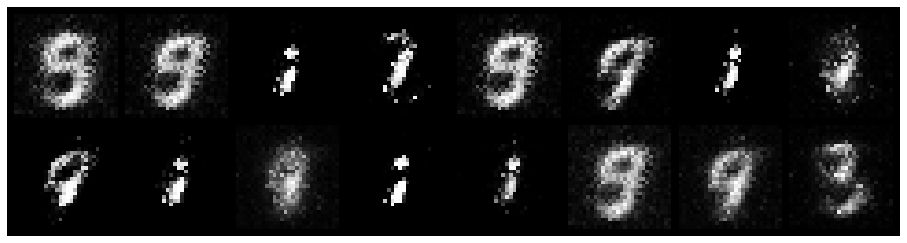

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3000, Generator Loss: 3.4422
D(x): 0.9021, D(G(z)): 0.0712


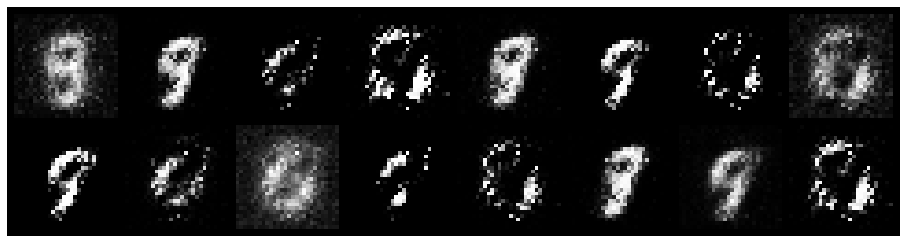

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.5425, Generator Loss: 2.9300
D(x): 0.8638, D(G(z)): 0.1909


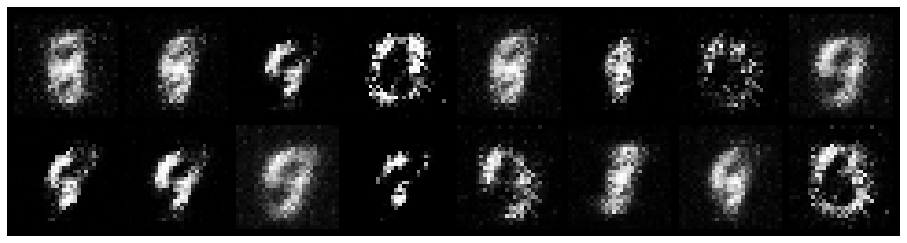

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.7805, Generator Loss: 2.0116
D(x): 0.8151, D(G(z)): 0.3162


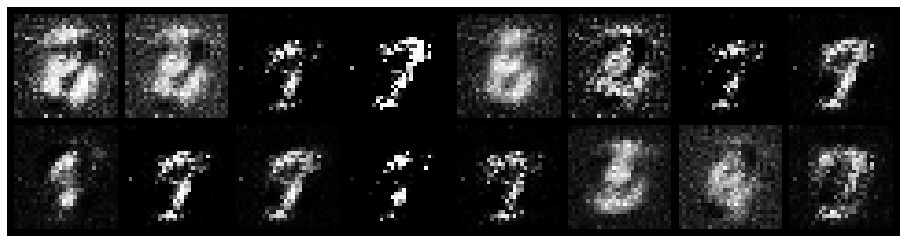

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.8901, Generator Loss: 1.9104
D(x): 0.7067, D(G(z)): 0.2395


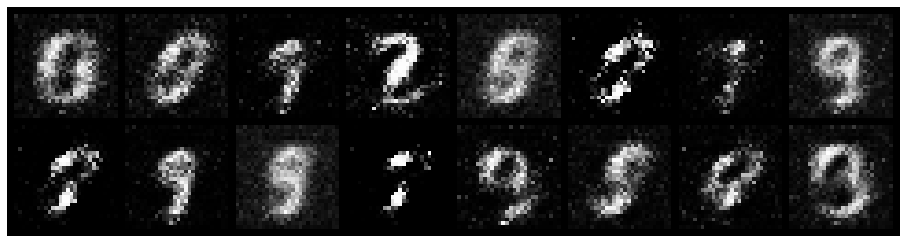

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.3064, Generator Loss: 2.4092
D(x): 0.9143, D(G(z)): 0.1385


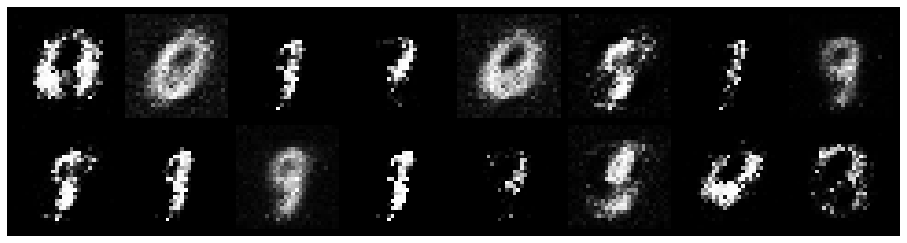

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.2523, Generator Loss: 2.9788
D(x): 0.9111, D(G(z)): 0.1070


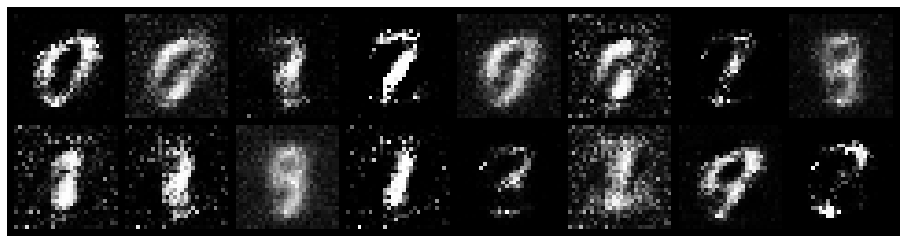

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.3684, Generator Loss: 3.6947
D(x): 0.8513, D(G(z)): 0.0495


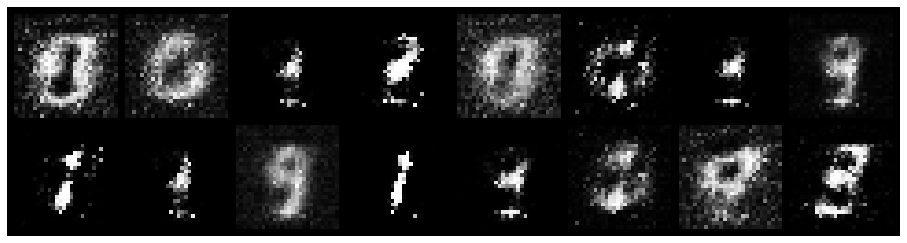

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.9712, Generator Loss: 2.8882
D(x): 0.6685, D(G(z)): 0.1341


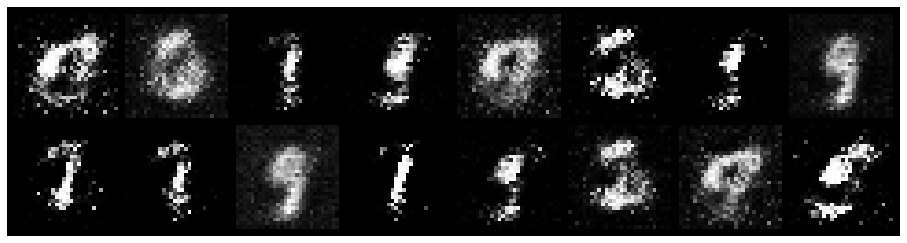

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.4170, Generator Loss: 3.2140
D(x): 0.8518, D(G(z)): 0.1110


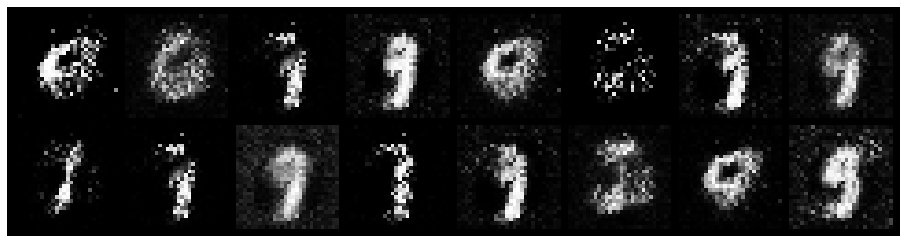

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.5844, Generator Loss: 2.2299
D(x): 0.8243, D(G(z)): 0.1838


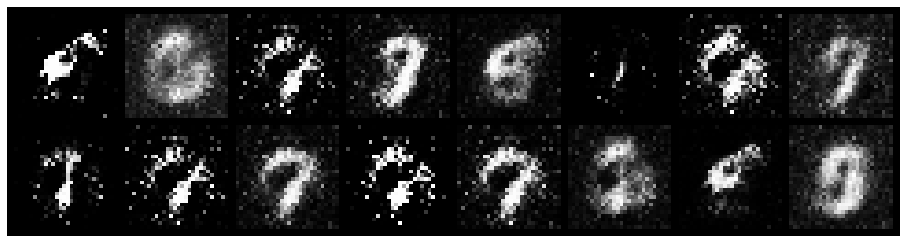

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.5250, Generator Loss: 2.7585
D(x): 0.7972, D(G(z)): 0.1457


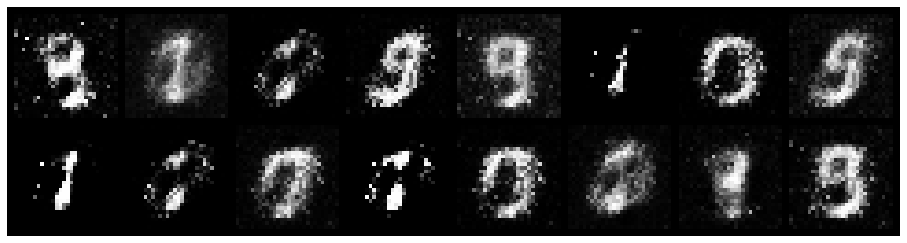

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.7001, Generator Loss: 2.2135
D(x): 0.8117, D(G(z)): 0.2403


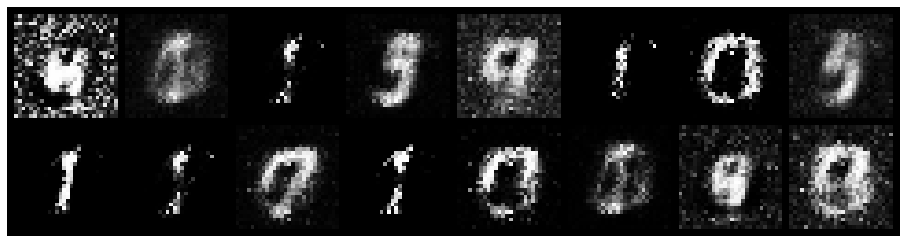

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.5496, Generator Loss: 2.1193
D(x): 0.8486, D(G(z)): 0.1952


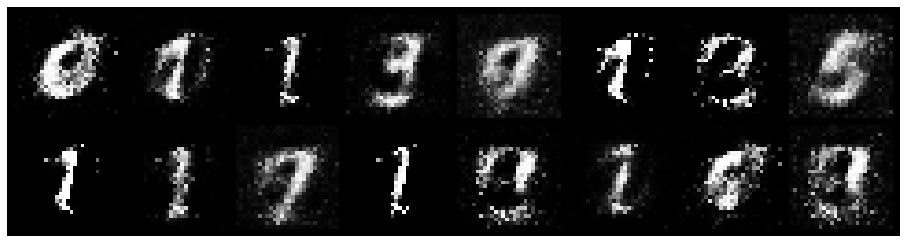

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.4082, Generator Loss: 3.1816
D(x): 0.8562, D(G(z)): 0.1155


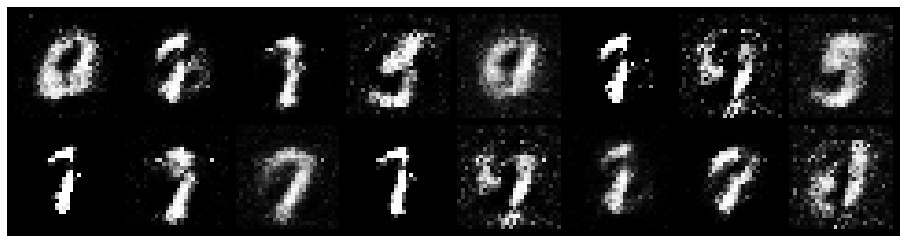

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.7665, Generator Loss: 2.5836
D(x): 0.8351, D(G(z)): 0.2385


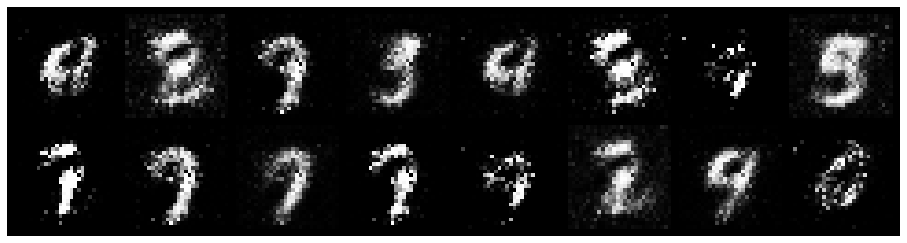

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.7276, Generator Loss: 2.3621
D(x): 0.7825, D(G(z)): 0.2076


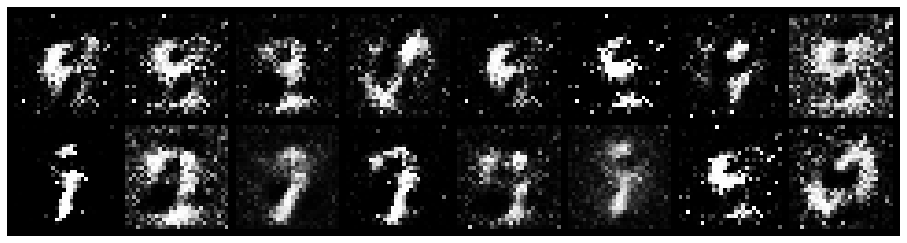

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.5906, Generator Loss: 2.9330
D(x): 0.8346, D(G(z)): 0.2066


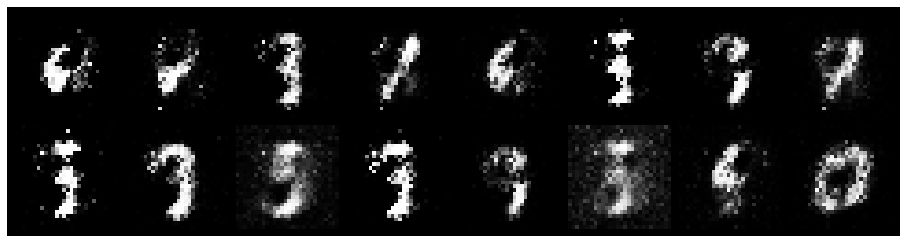

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.6549, Generator Loss: 2.7969
D(x): 0.7657, D(G(z)): 0.1600


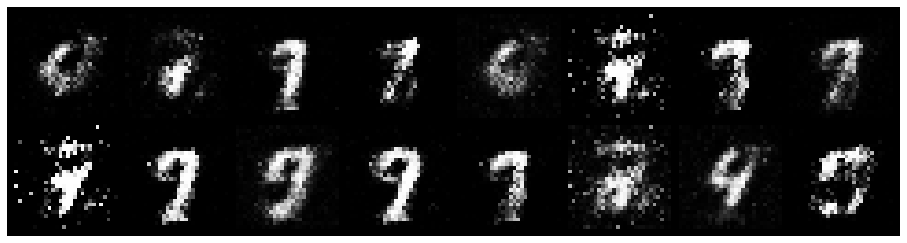

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.4832, Generator Loss: 2.0858
D(x): 0.8536, D(G(z)): 0.1945


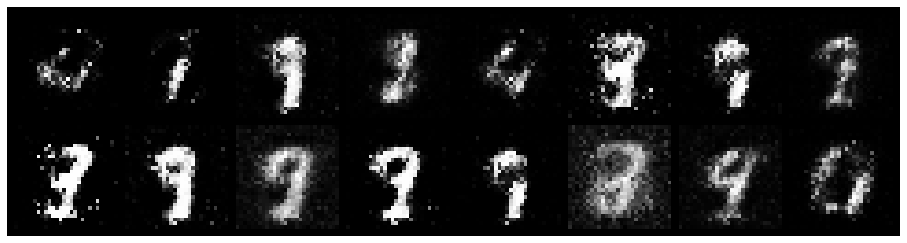

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.7527, Generator Loss: 2.0517
D(x): 0.7349, D(G(z)): 0.1998


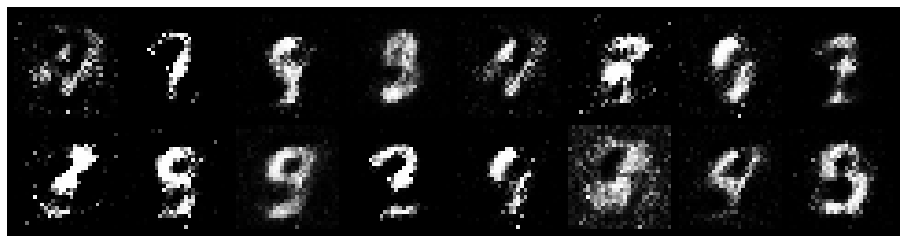

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.6046, Generator Loss: 1.9166
D(x): 0.8072, D(G(z)): 0.2291


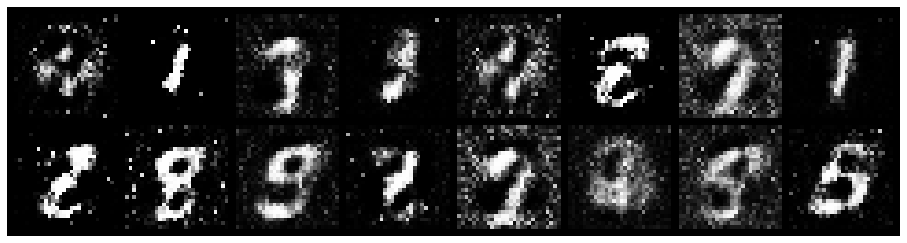

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.9144, Generator Loss: 2.1514
D(x): 0.6679, D(G(z)): 0.2035


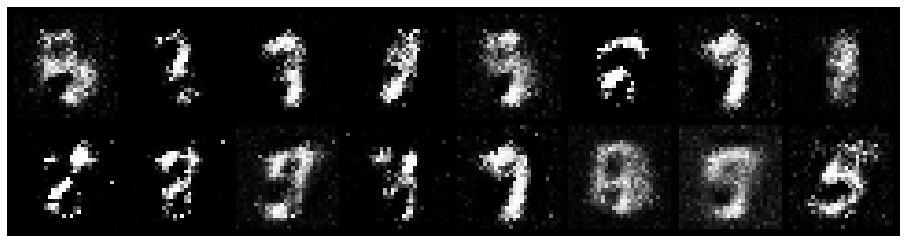

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.7330, Generator Loss: 1.9056
D(x): 0.8635, D(G(z)): 0.3544


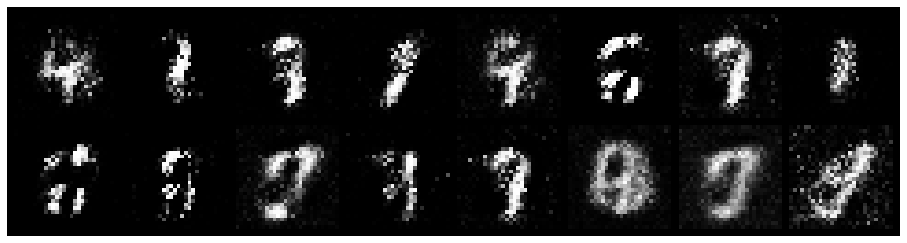

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.6454, Generator Loss: 2.0237
D(x): 0.8011, D(G(z)): 0.2278


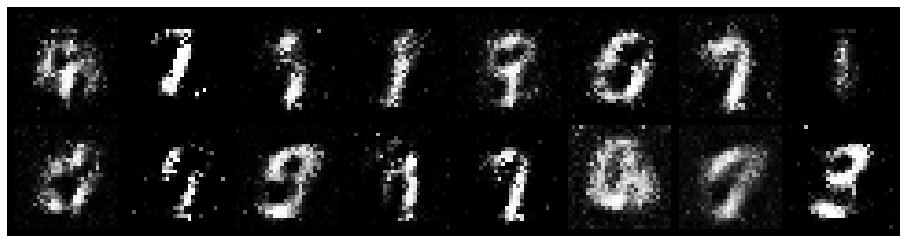

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.5760, Generator Loss: 2.4946
D(x): 0.7646, D(G(z)): 0.1537


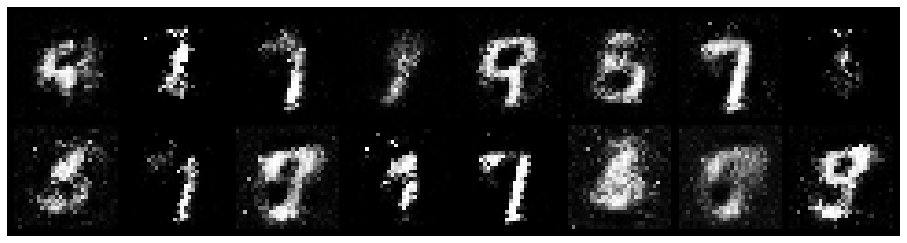

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.6502, Generator Loss: 1.8619
D(x): 0.8435, D(G(z)): 0.2828


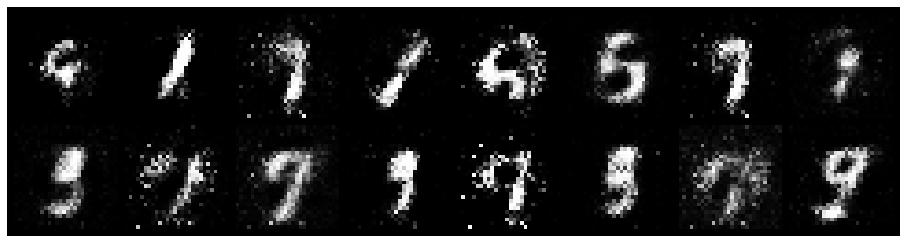

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.8484, Generator Loss: 1.8497
D(x): 0.7739, D(G(z)): 0.2964


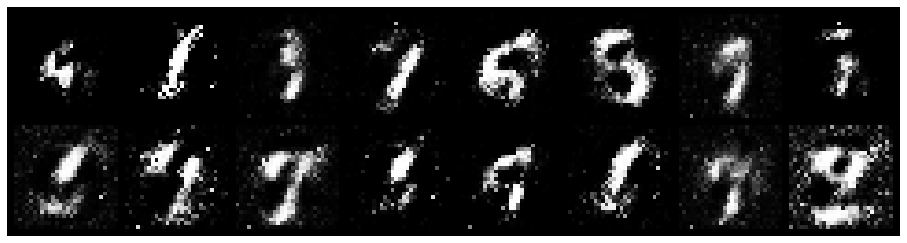

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.4890, Generator Loss: 2.5400
D(x): 0.8959, D(G(z)): 0.2145


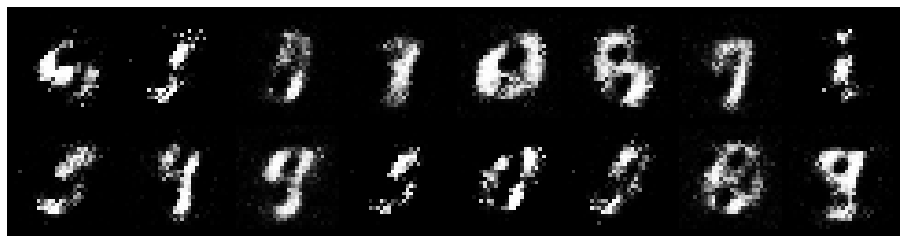

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.9462, Generator Loss: 1.6755
D(x): 0.7126, D(G(z)): 0.2800


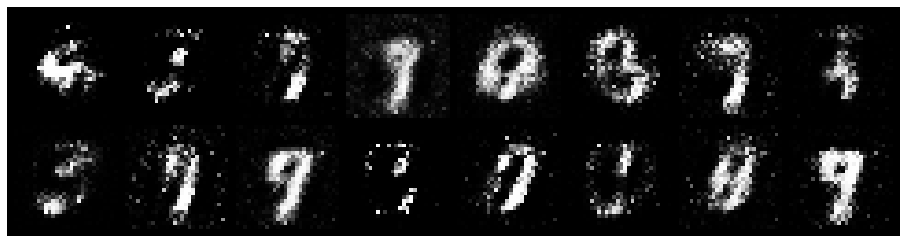

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.7763, Generator Loss: 1.9235
D(x): 0.7720, D(G(z)): 0.2777


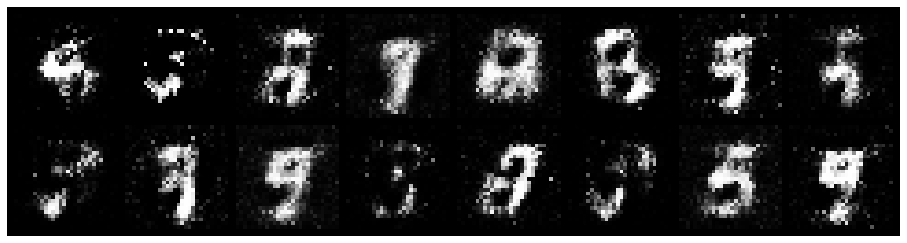

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.4817, Generator Loss: 2.5314
D(x): 0.8382, D(G(z)): 0.1661


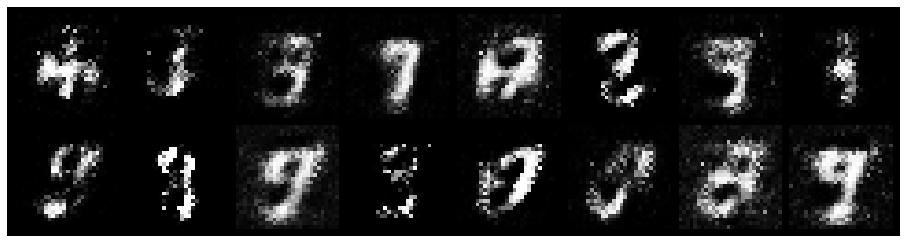

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.5219, Generator Loss: 2.6445
D(x): 0.8272, D(G(z)): 0.1589


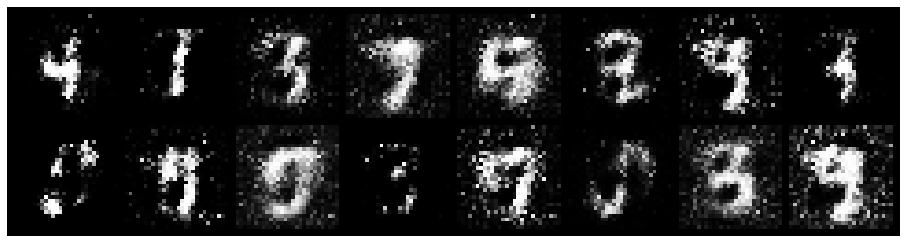

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.3240, Generator Loss: 3.0112
D(x): 0.8883, D(G(z)): 0.1040


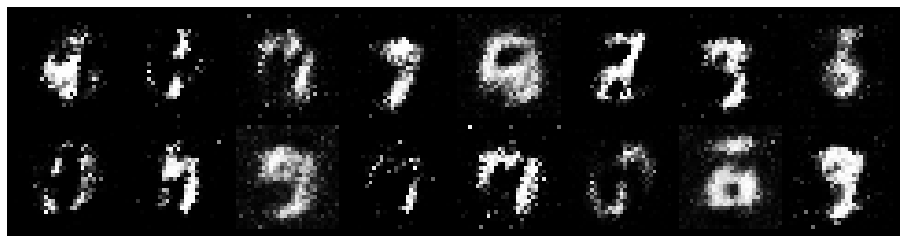

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.5049, Generator Loss: 2.2675
D(x): 0.8554, D(G(z)): 0.1991


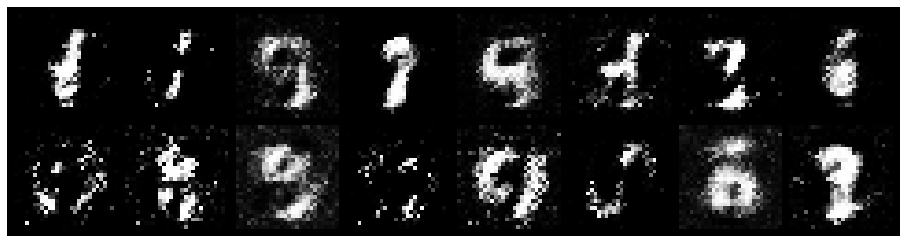

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.6287, Generator Loss: 2.6653
D(x): 0.7917, D(G(z)): 0.1717


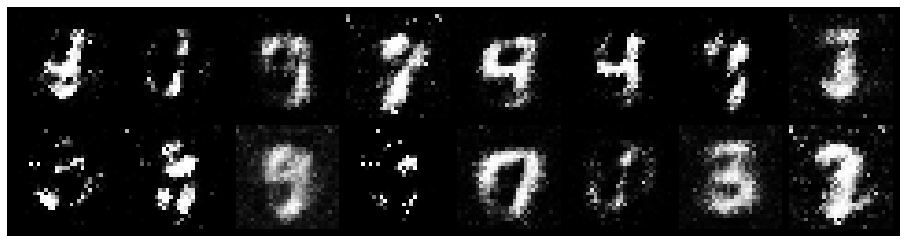

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.5322, Generator Loss: 2.5846
D(x): 0.7844, D(G(z)): 0.1321


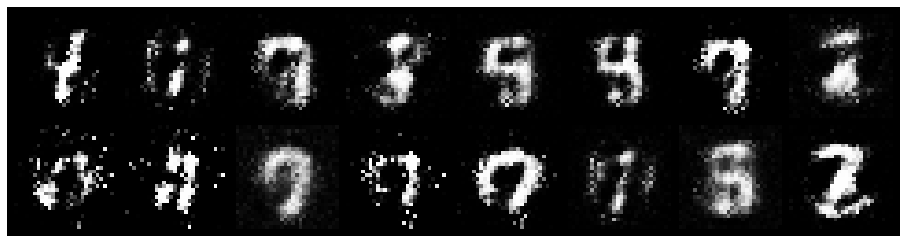

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.5083, Generator Loss: 2.1028
D(x): 0.8218, D(G(z)): 0.1800


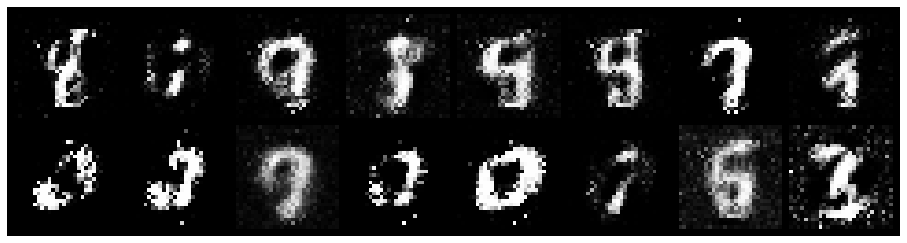

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.5468, Generator Loss: 2.3243
D(x): 0.8319, D(G(z)): 0.2265


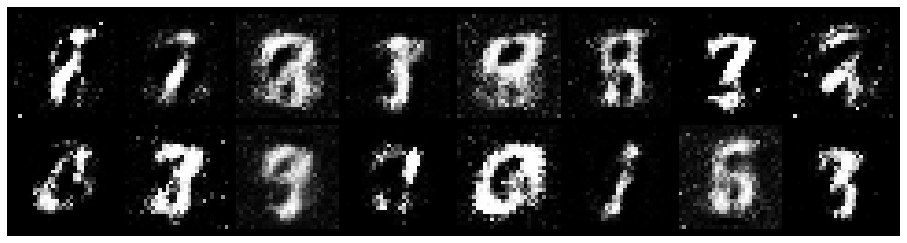

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.5539, Generator Loss: 2.1913
D(x): 0.8036, D(G(z)): 0.1720


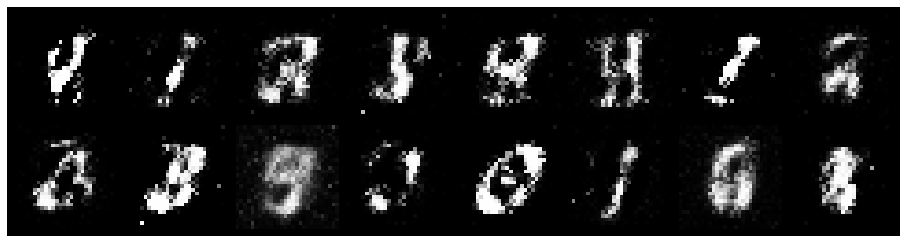

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.9434, Generator Loss: 2.2806
D(x): 0.6979, D(G(z)): 0.2627


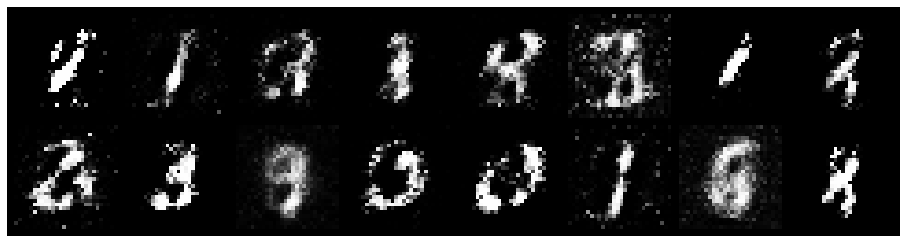

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.7040, Generator Loss: 2.1705
D(x): 0.8515, D(G(z)): 0.3048


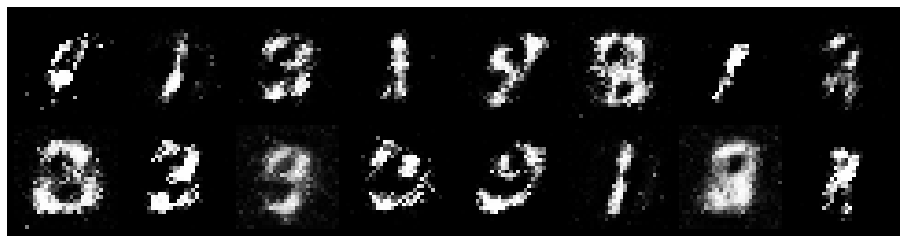

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.9757, Generator Loss: 1.6981
D(x): 0.7254, D(G(z)): 0.3111


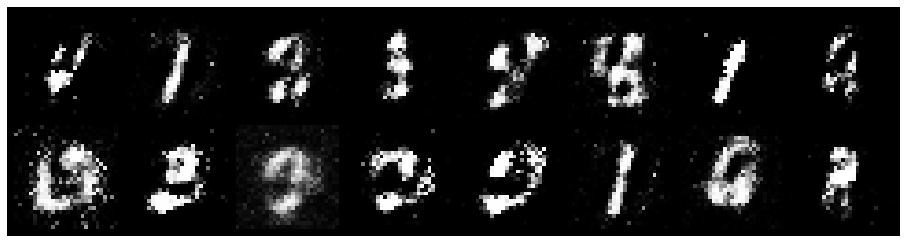

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.8544, Generator Loss: 1.7422
D(x): 0.6984, D(G(z)): 0.2299


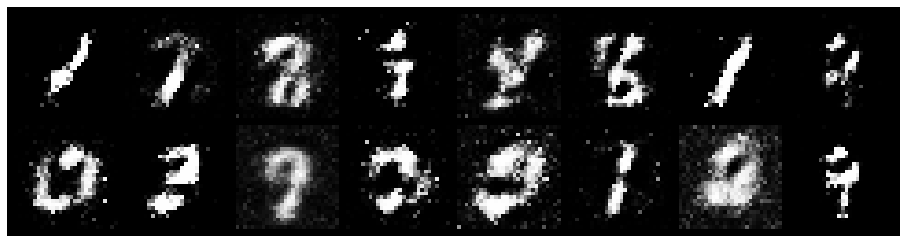

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.6937, Generator Loss: 2.2489
D(x): 0.7736, D(G(z)): 0.2425


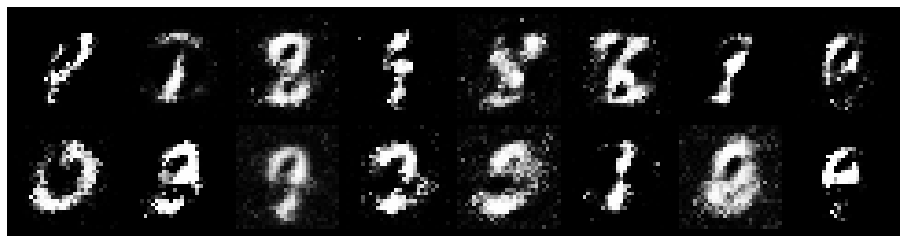

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.6091, Generator Loss: 2.0793
D(x): 0.8026, D(G(z)): 0.2272


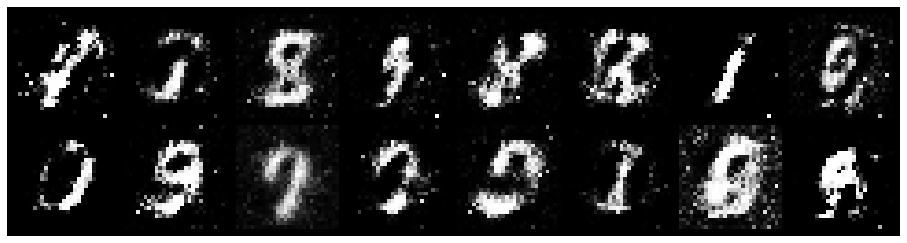

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.7146, Generator Loss: 2.5340
D(x): 0.7549, D(G(z)): 0.1953


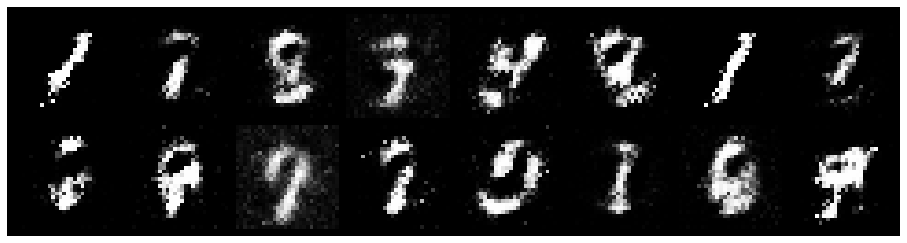

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.9057, Generator Loss: 2.0506
D(x): 0.7340, D(G(z)): 0.2741


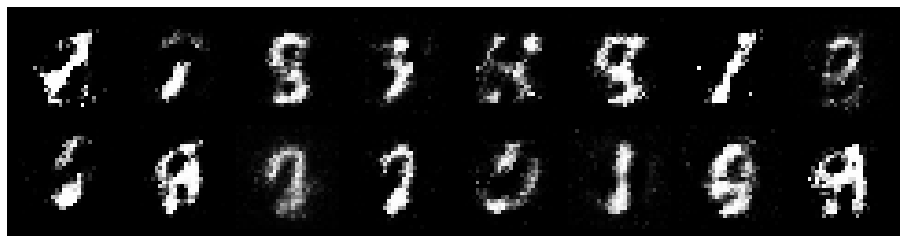

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.7366, Generator Loss: 2.1006
D(x): 0.7656, D(G(z)): 0.2478


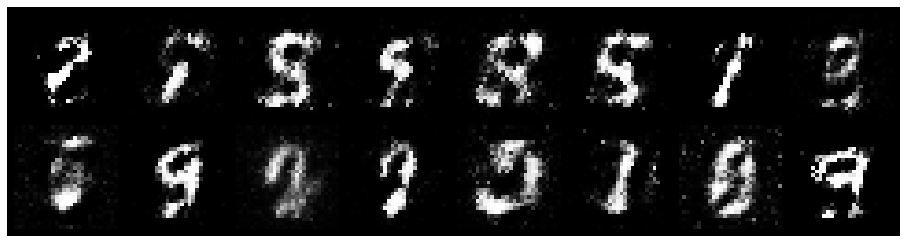

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.7591, Generator Loss: 1.5260
D(x): 0.7486, D(G(z)): 0.2600


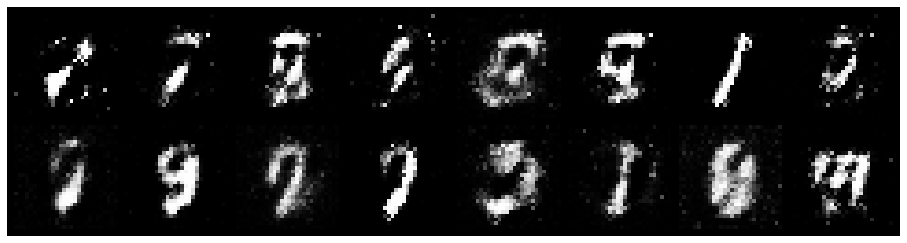

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.7536, Generator Loss: 2.2894
D(x): 0.7986, D(G(z)): 0.2786


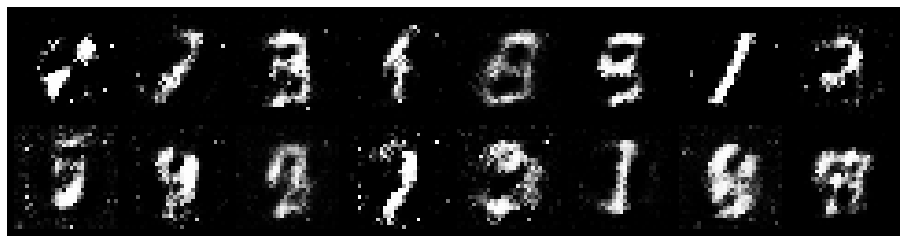

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.8835, Generator Loss: 1.2221
D(x): 0.7101, D(G(z)): 0.2906


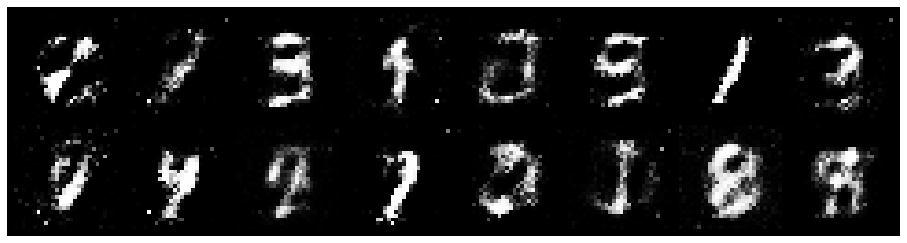

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 1.0445, Generator Loss: 1.7075
D(x): 0.6417, D(G(z)): 0.2893


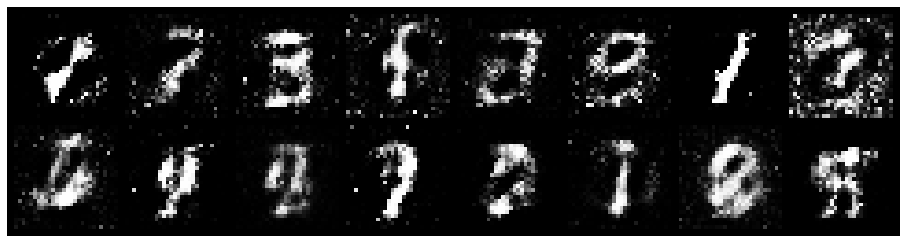

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.7924, Generator Loss: 2.1216
D(x): 0.6736, D(G(z)): 0.1954


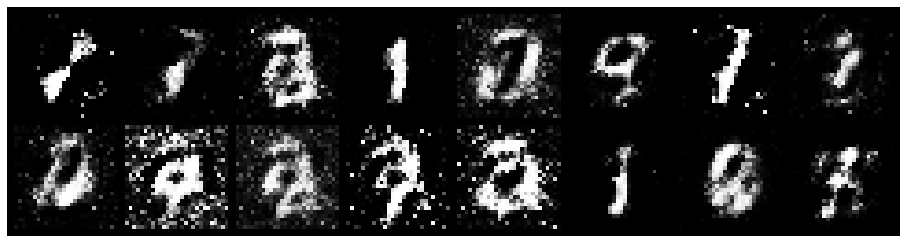

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.8951, Generator Loss: 1.5956
D(x): 0.6826, D(G(z)): 0.2141


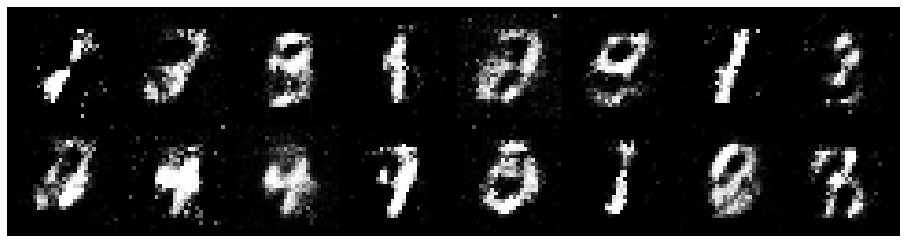

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 1.0156, Generator Loss: 1.6932
D(x): 0.7499, D(G(z)): 0.3660


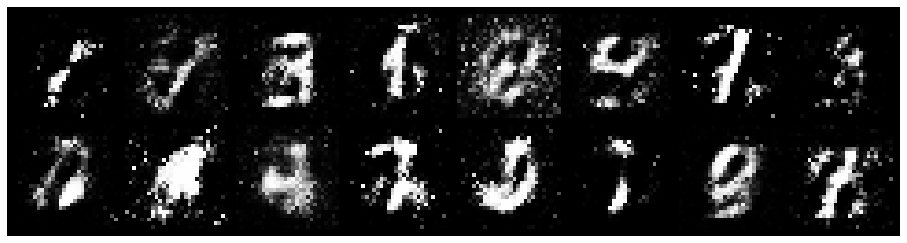

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.7728, Generator Loss: 2.1889
D(x): 0.7688, D(G(z)): 0.2831


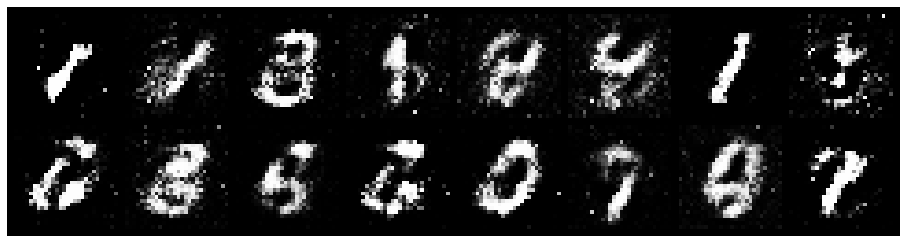

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.8517, Generator Loss: 1.9459
D(x): 0.7886, D(G(z)): 0.3301


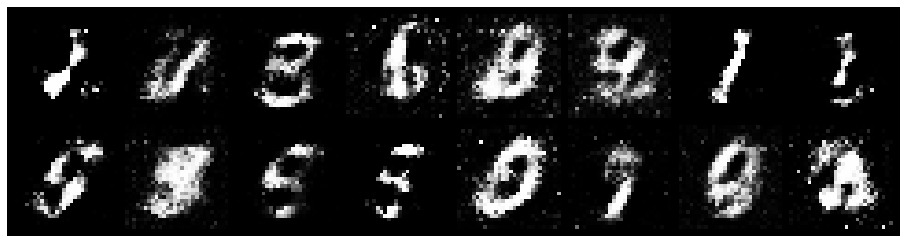

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.6234, Generator Loss: 2.2000
D(x): 0.8582, D(G(z)): 0.2534


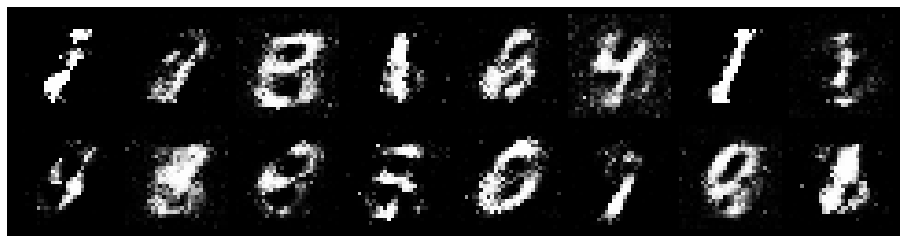

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.8809, Generator Loss: 1.8408
D(x): 0.7466, D(G(z)): 0.2761


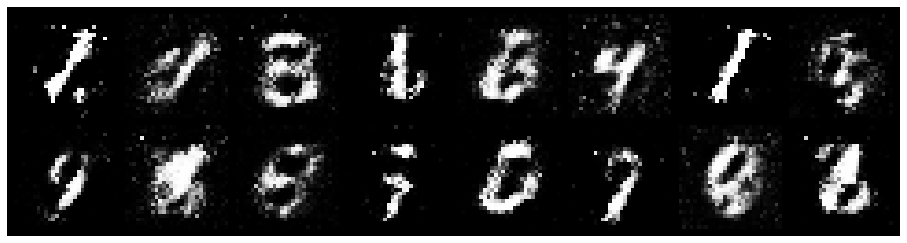

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.8576, Generator Loss: 1.9042
D(x): 0.7284, D(G(z)): 0.2911


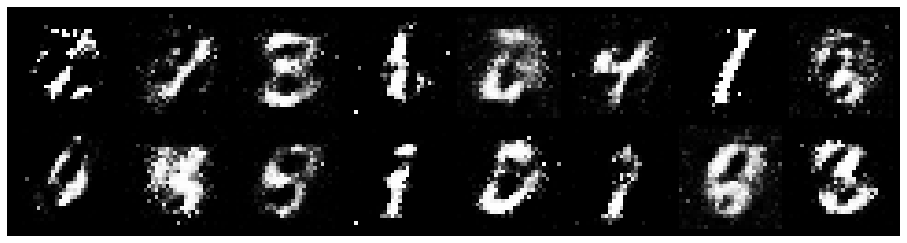

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.8778, Generator Loss: 1.4703
D(x): 0.7496, D(G(z)): 0.3129


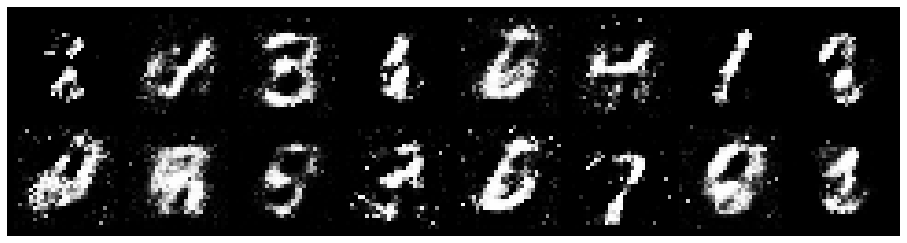

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.8940, Generator Loss: 2.6913
D(x): 0.7425, D(G(z)): 0.2401


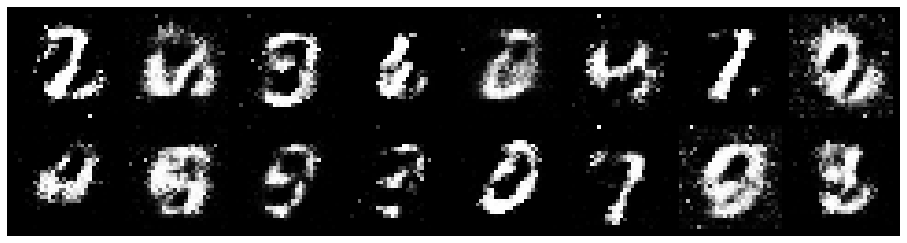

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 1.0203, Generator Loss: 1.4776
D(x): 0.6590, D(G(z)): 0.2852


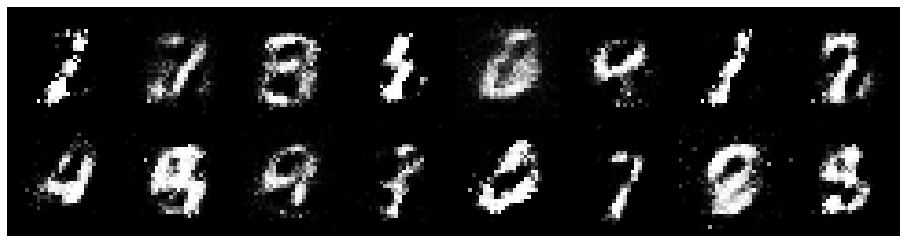

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 1.1137, Generator Loss: 1.4159
D(x): 0.6767, D(G(z)): 0.3485


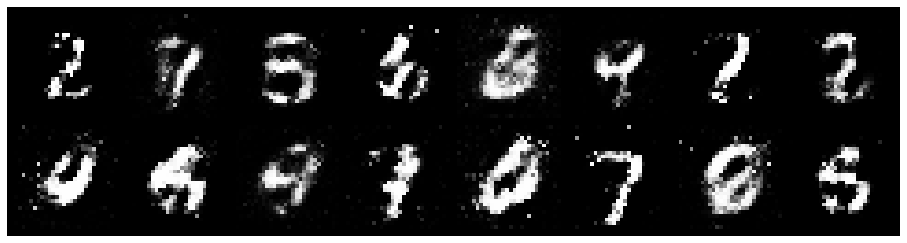

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.8979, Generator Loss: 1.3562
D(x): 0.7896, D(G(z)): 0.3733


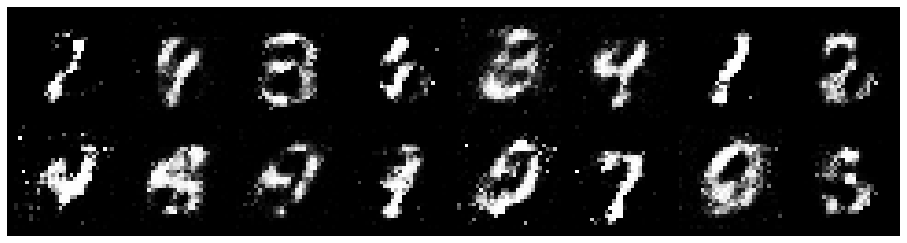

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.8138, Generator Loss: 1.8367
D(x): 0.7593, D(G(z)): 0.2825


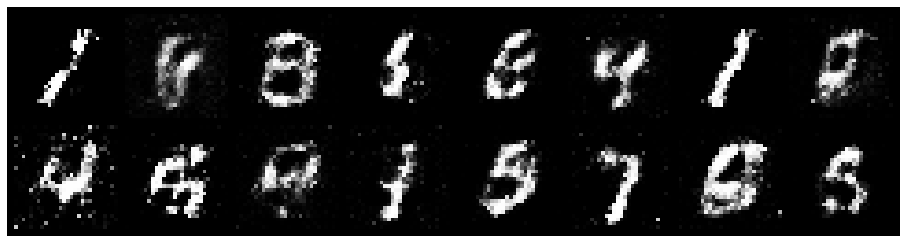

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 1.1095, Generator Loss: 1.2943
D(x): 0.6927, D(G(z)): 0.3599


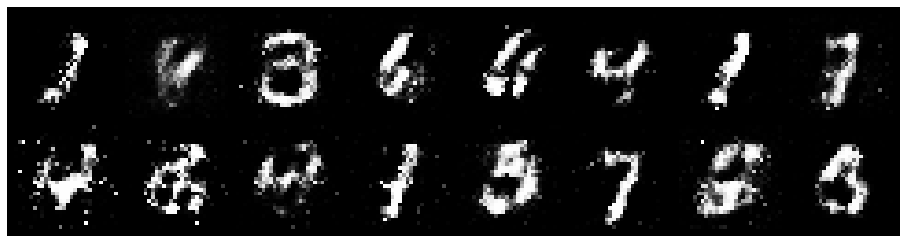

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 1.0726, Generator Loss: 1.6457
D(x): 0.6751, D(G(z)): 0.3193


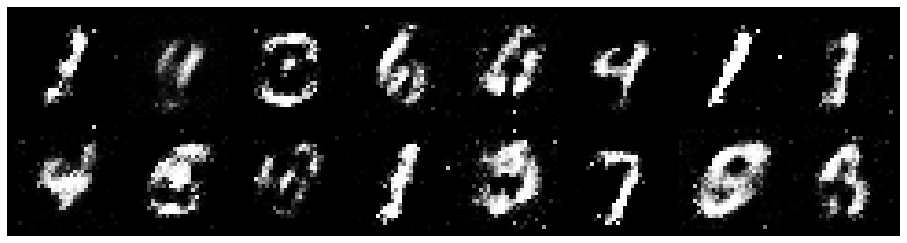

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.7521, Generator Loss: 1.7778
D(x): 0.8300, D(G(z)): 0.3171


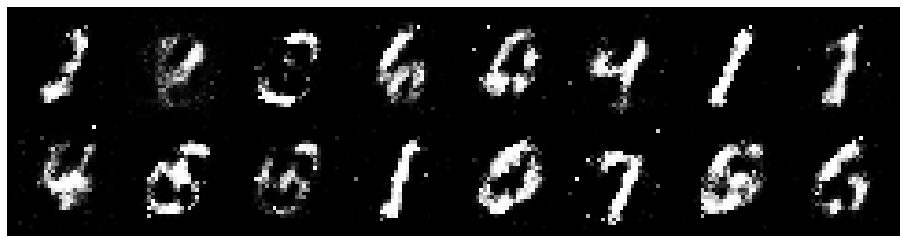

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 1.2393, Generator Loss: 1.3843
D(x): 0.6265, D(G(z)): 0.4052


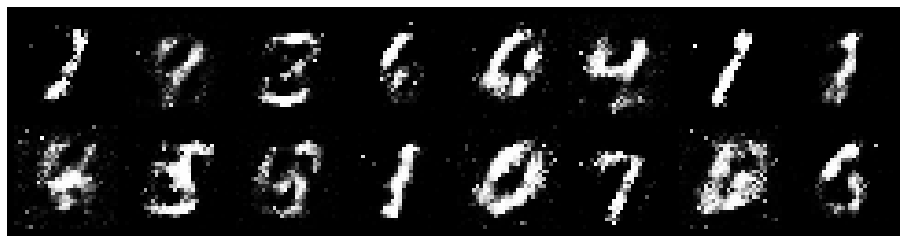

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 1.1880, Generator Loss: 1.8943
D(x): 0.6067, D(G(z)): 0.2576


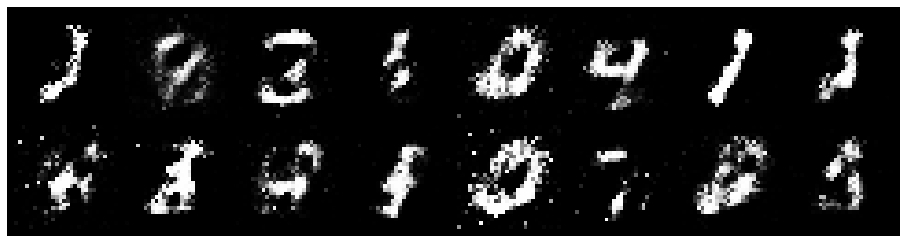

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.7737, Generator Loss: 1.6450
D(x): 0.7848, D(G(z)): 0.3174


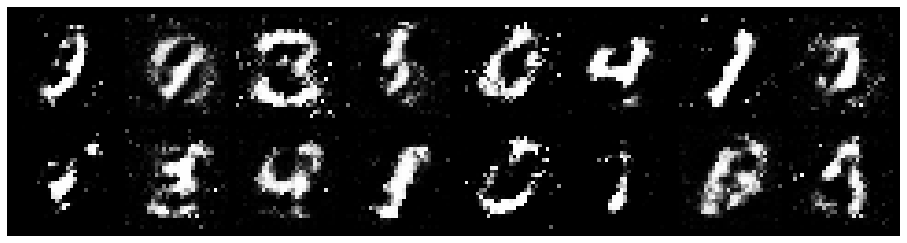

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.8702, Generator Loss: 1.9145
D(x): 0.6667, D(G(z)): 0.2103


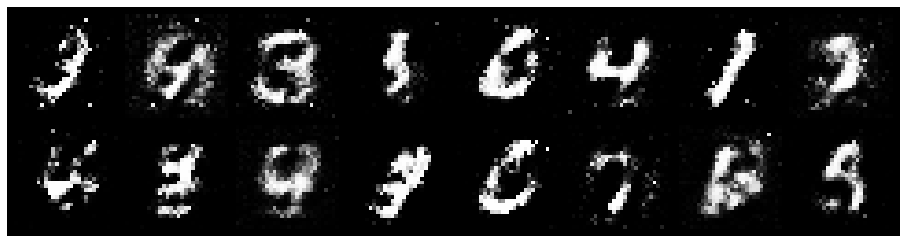

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.8093, Generator Loss: 1.8585
D(x): 0.7476, D(G(z)): 0.2756


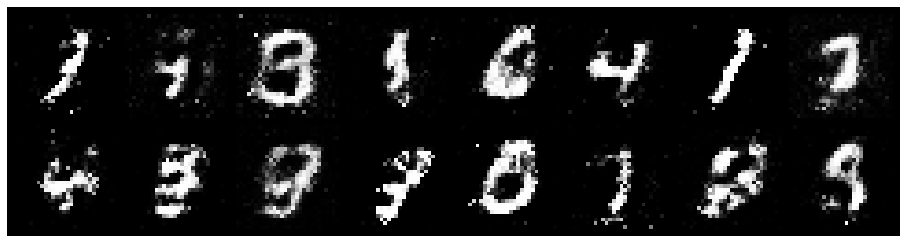

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.8156, Generator Loss: 1.5876
D(x): 0.7369, D(G(z)): 0.2746


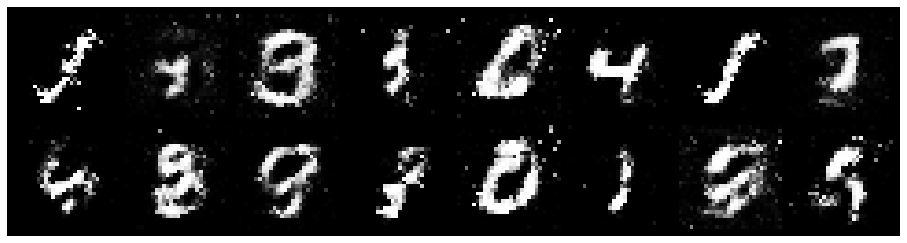

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.9121, Generator Loss: 1.8060
D(x): 0.6752, D(G(z)): 0.2452


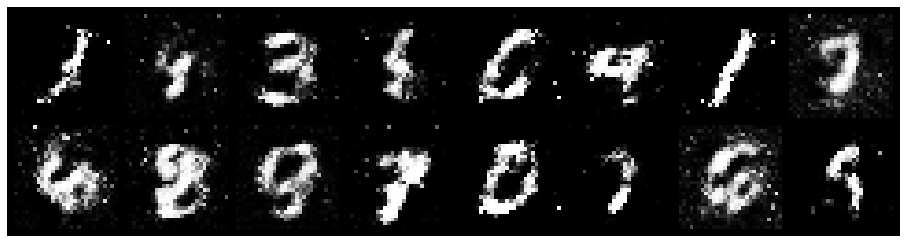

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.6536, Generator Loss: 1.7522
D(x): 0.7978, D(G(z)): 0.2535


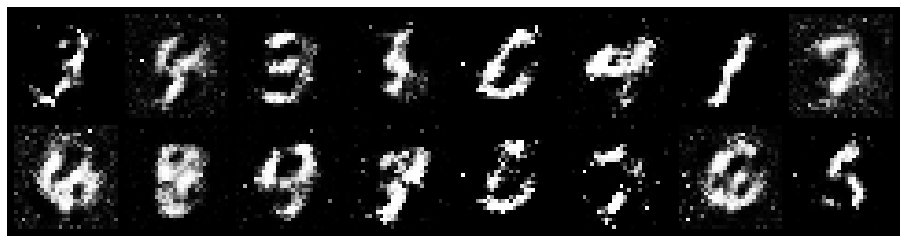

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.8269, Generator Loss: 1.5745
D(x): 0.6574, D(G(z)): 0.2545


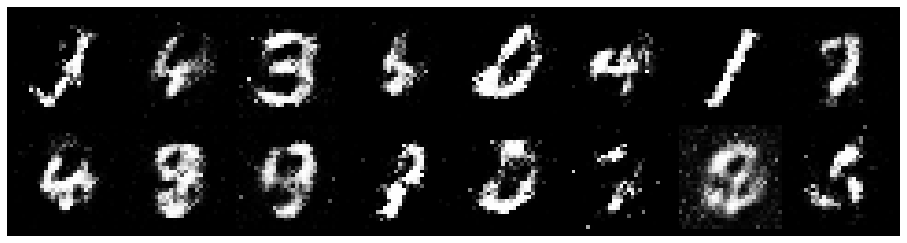

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.9331, Generator Loss: 1.6882
D(x): 0.7303, D(G(z)): 0.3072


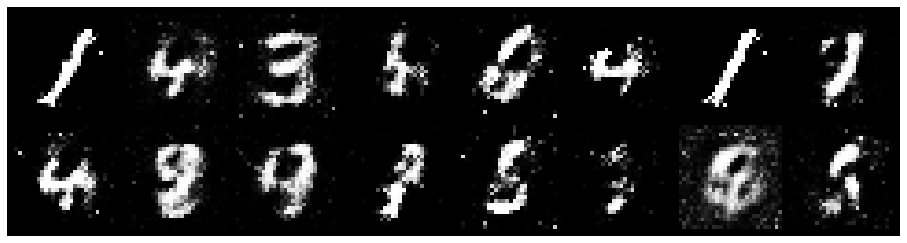

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.0037, Generator Loss: 1.6484
D(x): 0.6865, D(G(z)): 0.3250


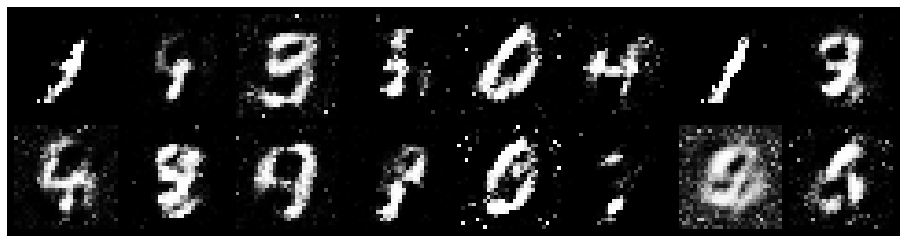

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.8837, Generator Loss: 2.0336
D(x): 0.7182, D(G(z)): 0.2549


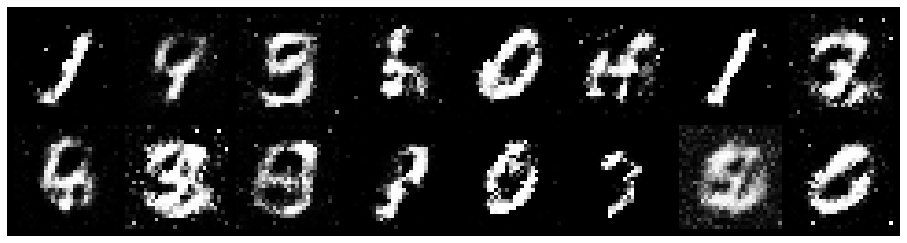

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.9215, Generator Loss: 1.2490
D(x): 0.6906, D(G(z)): 0.3172


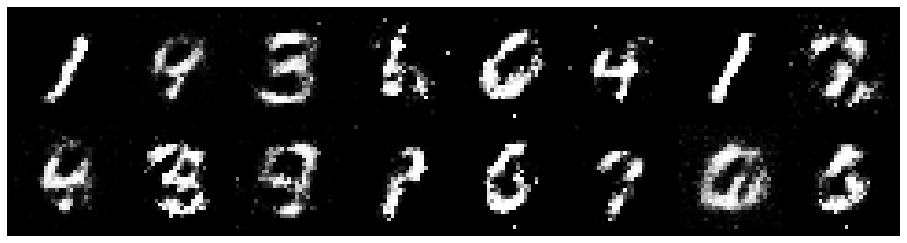

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.8978, Generator Loss: 1.4807
D(x): 0.6740, D(G(z)): 0.3066


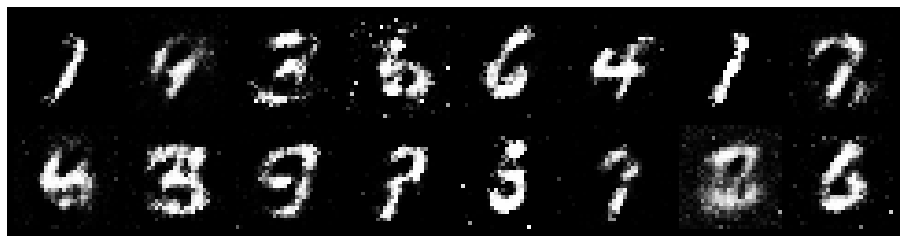

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 1.0734, Generator Loss: 1.4278
D(x): 0.6967, D(G(z)): 0.3651


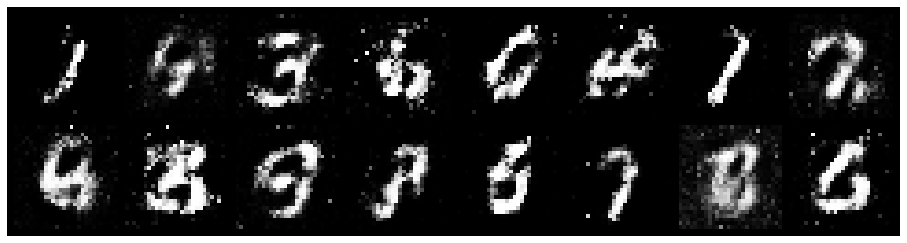

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 1.1281, Generator Loss: 1.2509
D(x): 0.7452, D(G(z)): 0.4163


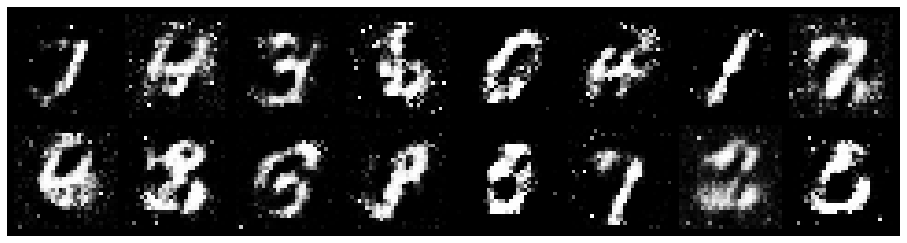

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.9438, Generator Loss: 1.8472
D(x): 0.6810, D(G(z)): 0.2774


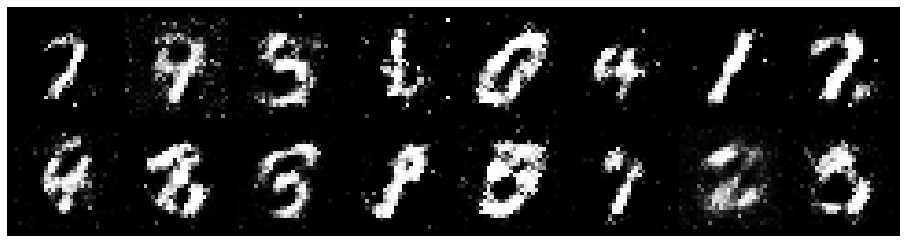

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.6176, Generator Loss: 1.7123
D(x): 0.7718, D(G(z)): 0.2290


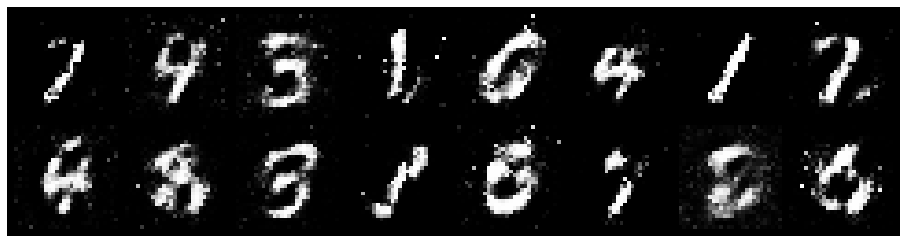

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.9509, Generator Loss: 1.5755
D(x): 0.7529, D(G(z)): 0.3333


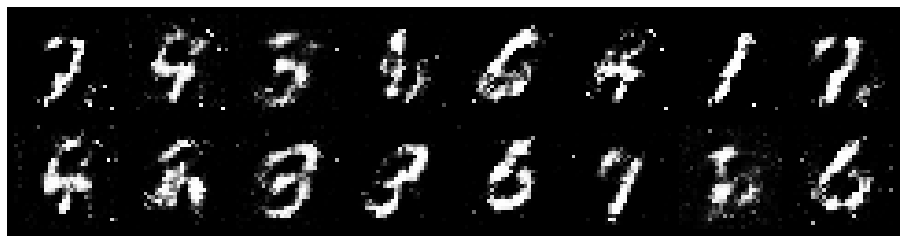

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 1.0538, Generator Loss: 1.7186
D(x): 0.7125, D(G(z)): 0.3555


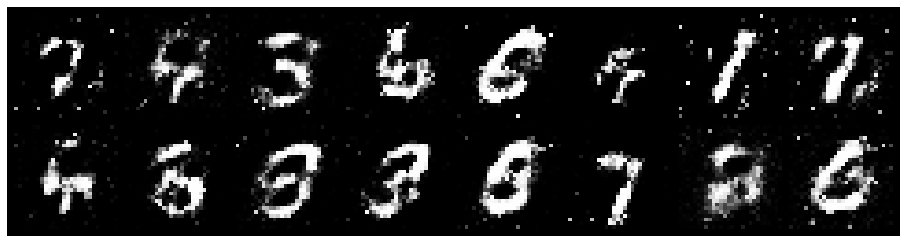

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 1.3101, Generator Loss: 1.4699
D(x): 0.7745, D(G(z)): 0.4726


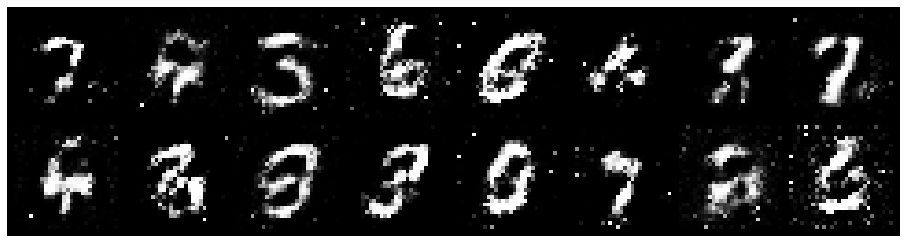

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 1.1964, Generator Loss: 1.3337
D(x): 0.5825, D(G(z)): 0.3467


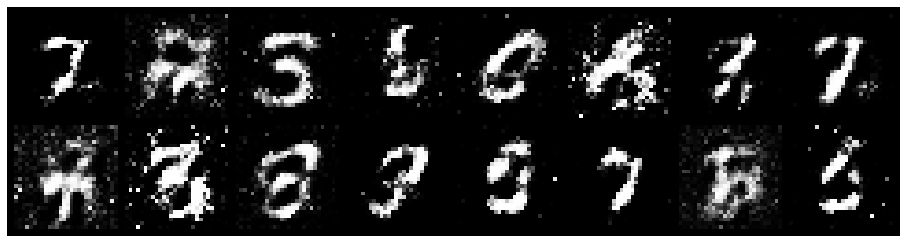

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.9410, Generator Loss: 1.2035
D(x): 0.6663, D(G(z)): 0.3050


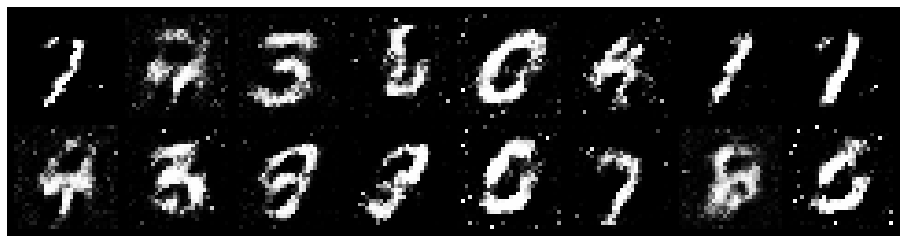

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.9097, Generator Loss: 1.4078
D(x): 0.6759, D(G(z)): 0.2959


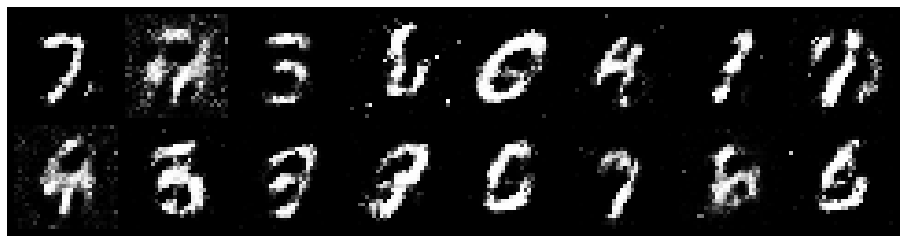

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.9817, Generator Loss: 1.1872
D(x): 0.7216, D(G(z)): 0.3662


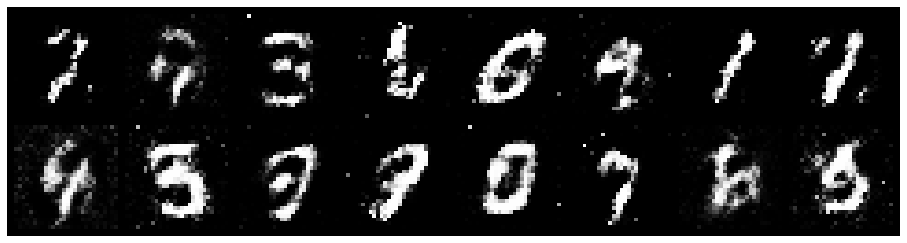

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.9935, Generator Loss: 1.2549
D(x): 0.6612, D(G(z)): 0.3444


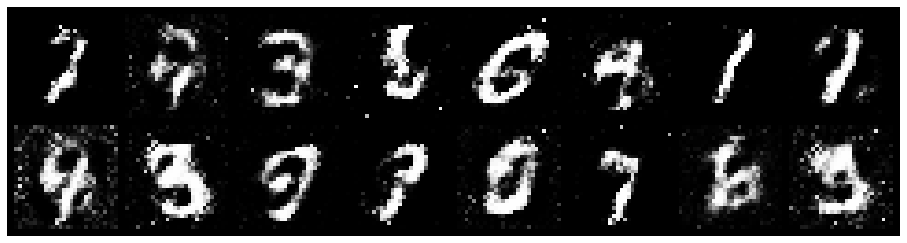

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.8743, Generator Loss: 1.0968
D(x): 0.6803, D(G(z)): 0.2951


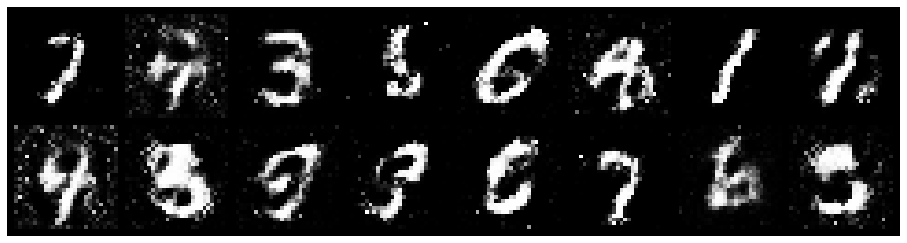

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.9450, Generator Loss: 1.3046
D(x): 0.6570, D(G(z)): 0.2908


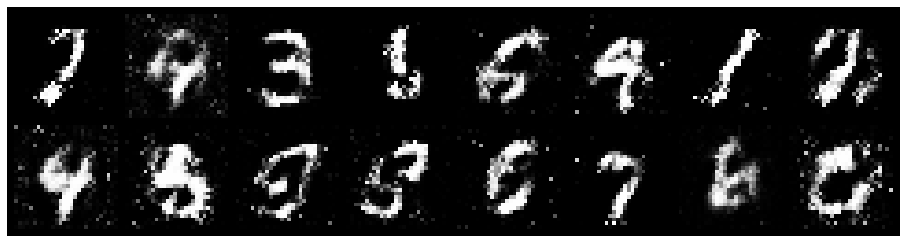

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.1529, Generator Loss: 1.1156
D(x): 0.6512, D(G(z)): 0.3468


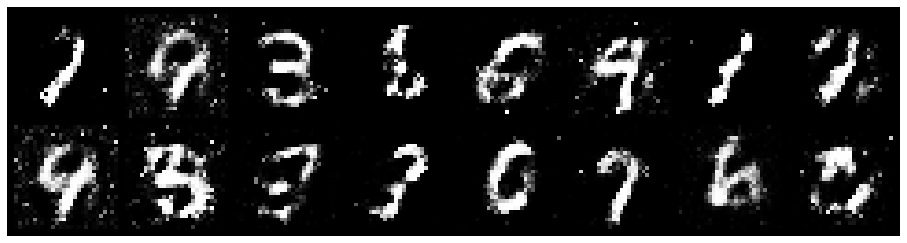

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 1.0947, Generator Loss: 1.4158
D(x): 0.7082, D(G(z)): 0.3762


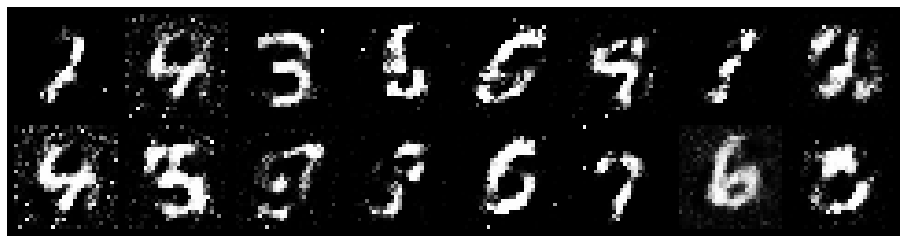

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.9238, Generator Loss: 1.5164
D(x): 0.6916, D(G(z)): 0.2944


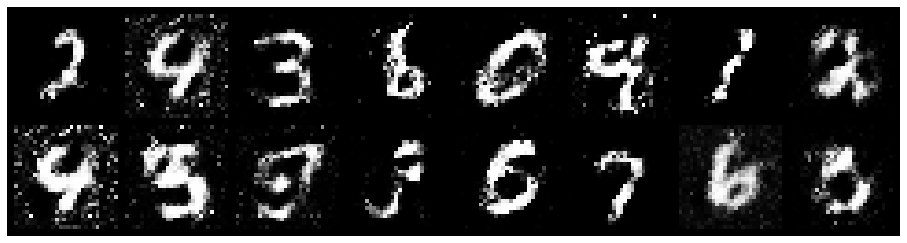

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.9277, Generator Loss: 1.6899
D(x): 0.6812, D(G(z)): 0.3040


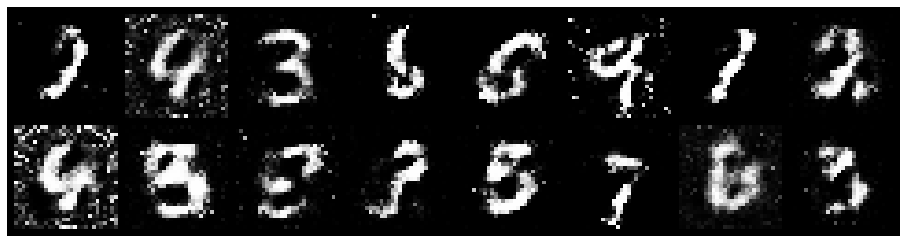

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.8715, Generator Loss: 1.5111
D(x): 0.7296, D(G(z)): 0.2957


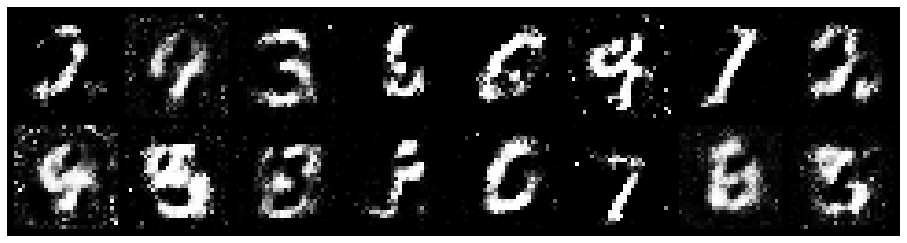

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 1.2042, Generator Loss: 1.0263
D(x): 0.6020, D(G(z)): 0.3301


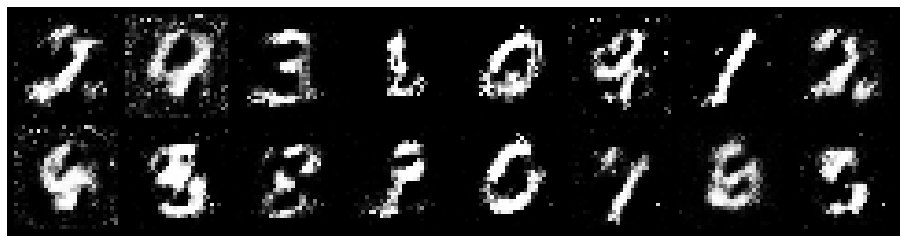

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.9843, Generator Loss: 1.3178
D(x): 0.6694, D(G(z)): 0.3312


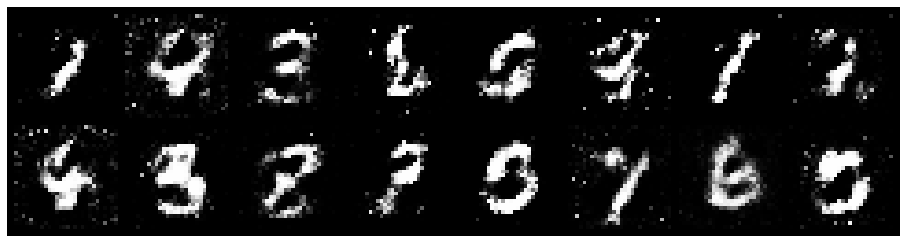

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.8542, Generator Loss: 1.6407
D(x): 0.6866, D(G(z)): 0.2796


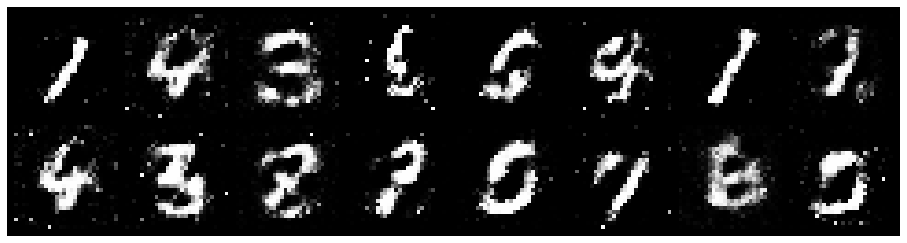

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.9838, Generator Loss: 1.9717
D(x): 0.6157, D(G(z)): 0.2352


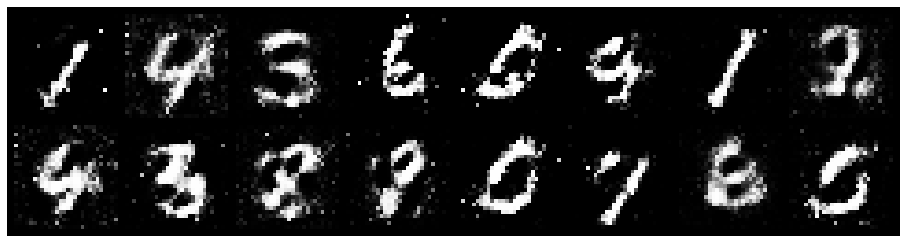

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.7460, Generator Loss: 1.8052
D(x): 0.7764, D(G(z)): 0.3092


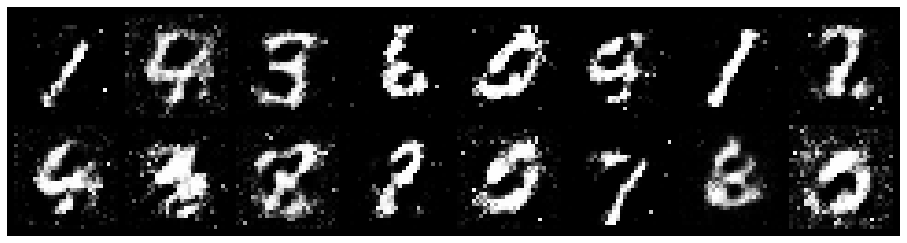

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.1481, Generator Loss: 1.2711
D(x): 0.6748, D(G(z)): 0.3815


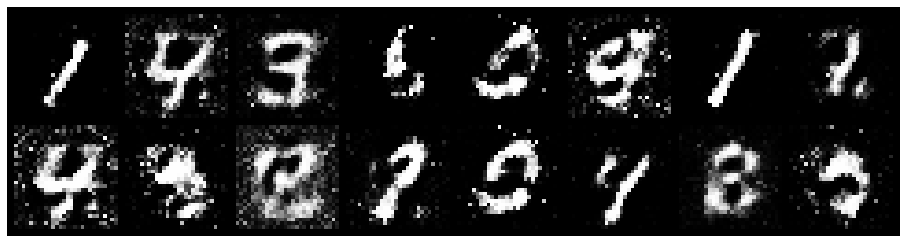

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 1.0712, Generator Loss: 1.3936
D(x): 0.7227, D(G(z)): 0.3977


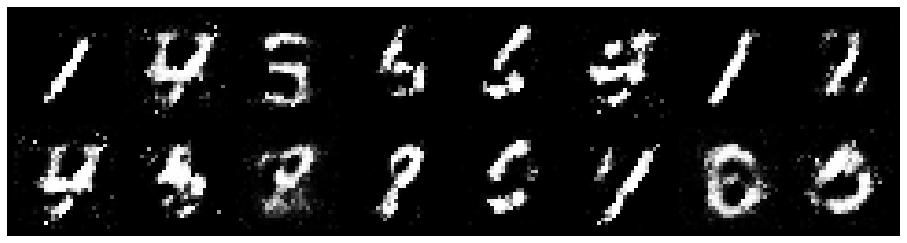

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.2203, Generator Loss: 1.6995
D(x): 0.6650, D(G(z)): 0.3637


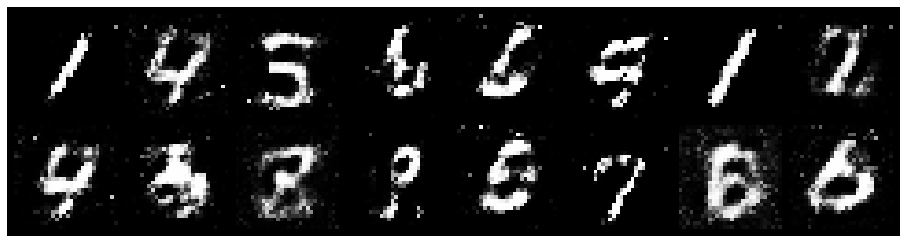

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9804, Generator Loss: 1.3491
D(x): 0.6136, D(G(z)): 0.2765


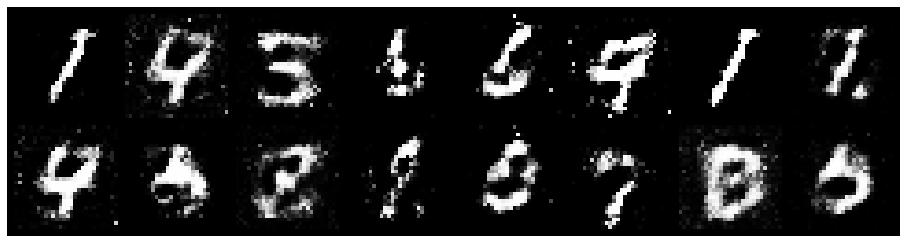

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.0603, Generator Loss: 1.6239
D(x): 0.6451, D(G(z)): 0.2936


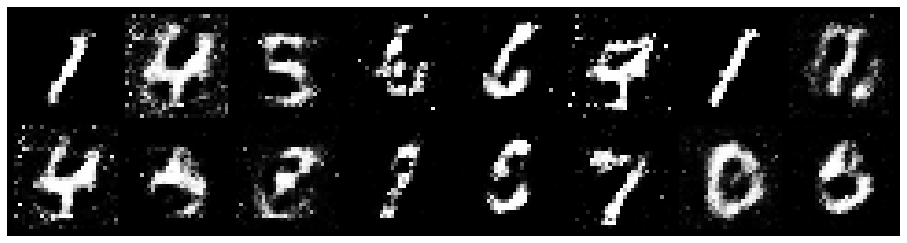

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9914, Generator Loss: 1.9679
D(x): 0.7137, D(G(z)): 0.3352


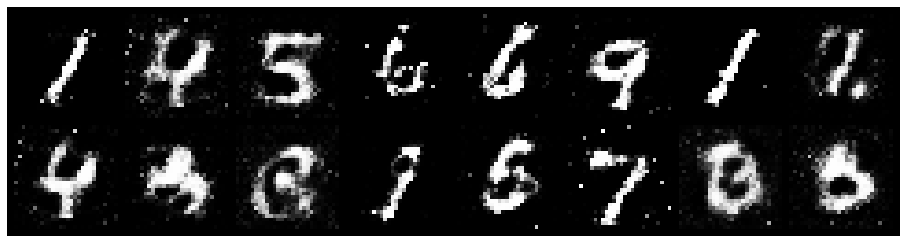

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.2322, Generator Loss: 0.9644
D(x): 0.7190, D(G(z)): 0.4715


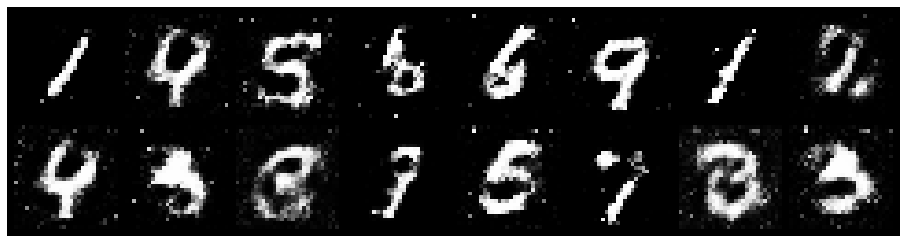

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 1.2033, Generator Loss: 1.1432
D(x): 0.6207, D(G(z)): 0.3870


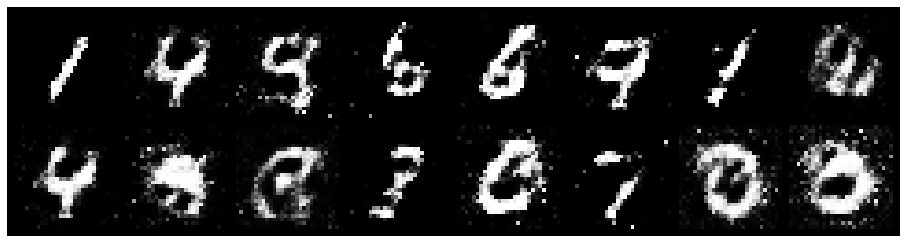

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 1.0155, Generator Loss: 1.6771
D(x): 0.6383, D(G(z)): 0.2978


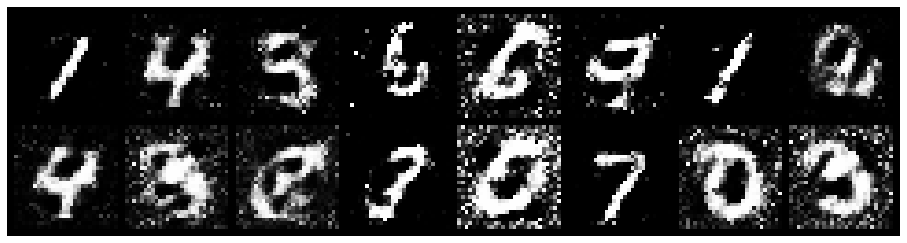

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.8740, Generator Loss: 1.8013
D(x): 0.7365, D(G(z)): 0.3009


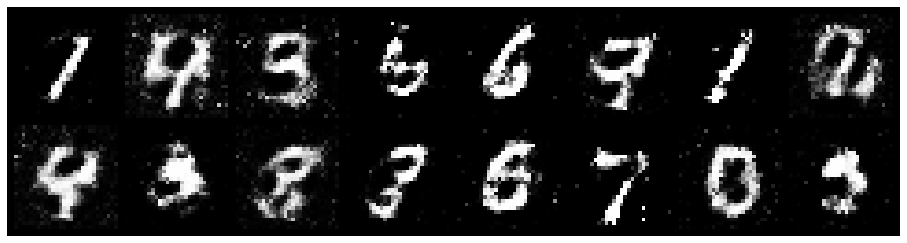

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.8249, Generator Loss: 1.6946
D(x): 0.7473, D(G(z)): 0.3006


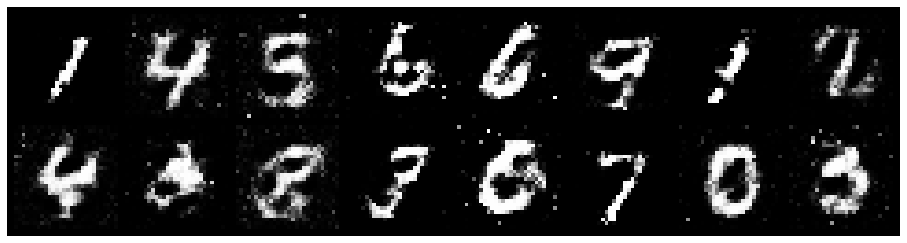

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 1.0112, Generator Loss: 1.2933
D(x): 0.7069, D(G(z)): 0.3469


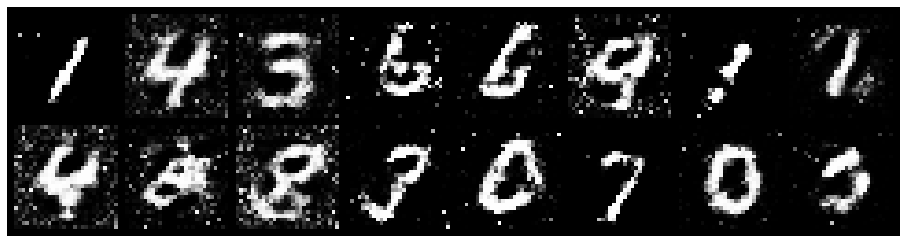

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.9238, Generator Loss: 1.3004
D(x): 0.6994, D(G(z)): 0.3543


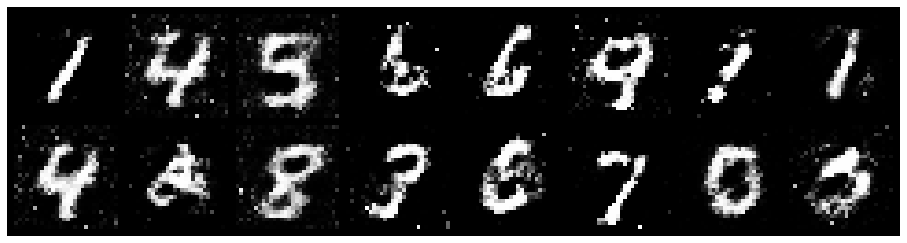

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9413, Generator Loss: 1.7009
D(x): 0.6605, D(G(z)): 0.2596


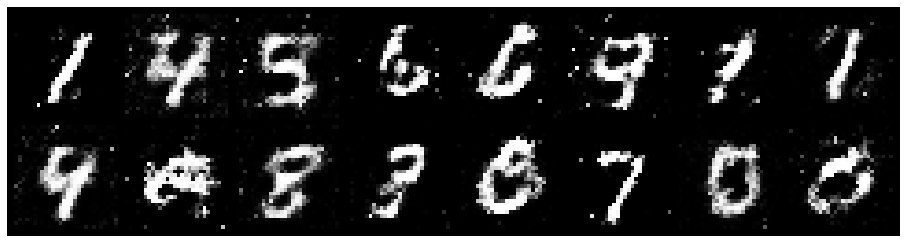

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.0184, Generator Loss: 1.6736
D(x): 0.6442, D(G(z)): 0.3036


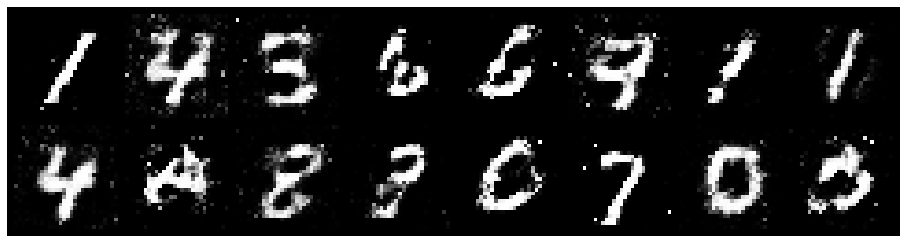

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 1.1279, Generator Loss: 1.4043
D(x): 0.6103, D(G(z)): 0.3239


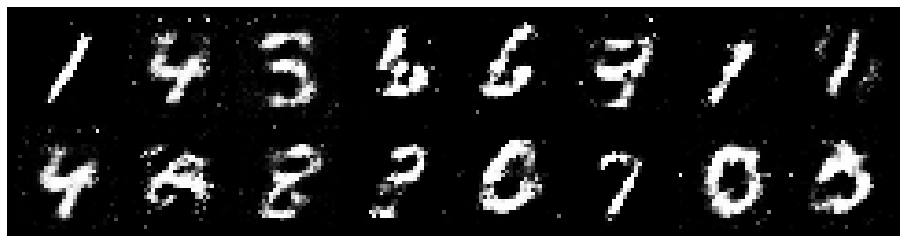

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.1065, Generator Loss: 1.2814
D(x): 0.5607, D(G(z)): 0.3302


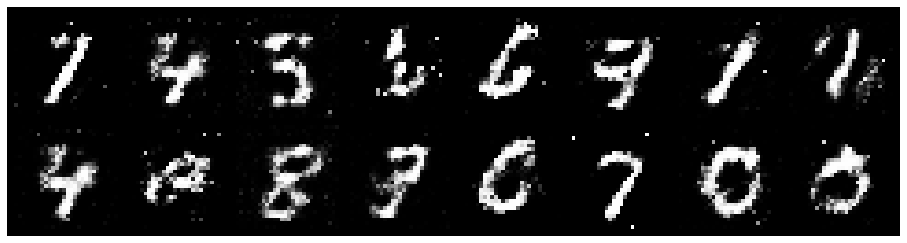

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.9868, Generator Loss: 1.4077
D(x): 0.6476, D(G(z)): 0.3314


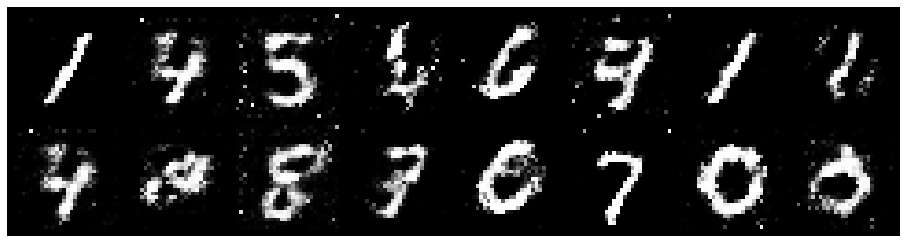

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 1.1092, Generator Loss: 1.6169
D(x): 0.5365, D(G(z)): 0.2552


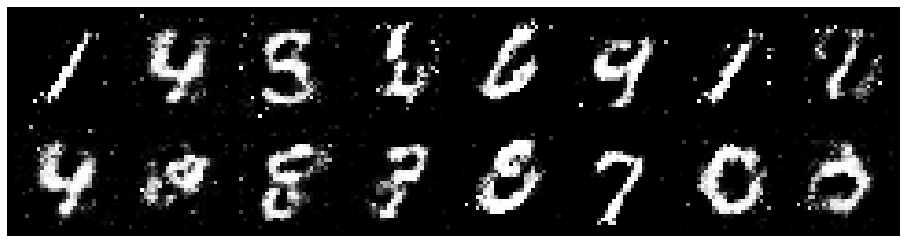

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.1377, Generator Loss: 1.4586
D(x): 0.6137, D(G(z)): 0.3449


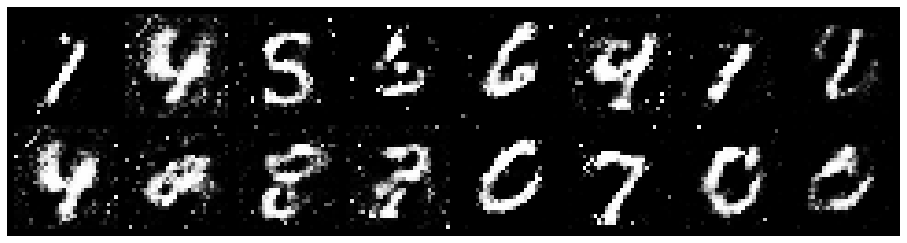

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.1910, Generator Loss: 1.4097
D(x): 0.5841, D(G(z)): 0.3393


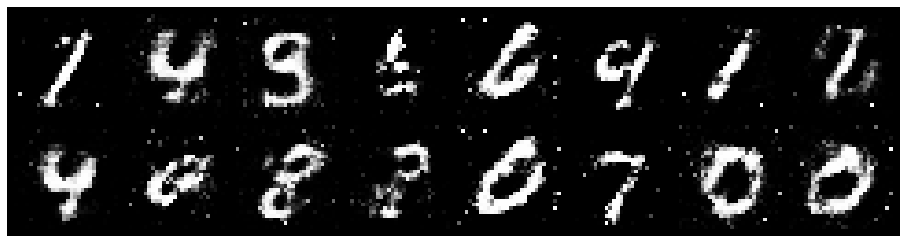

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.2192, Generator Loss: 1.2807
D(x): 0.6375, D(G(z)): 0.3919


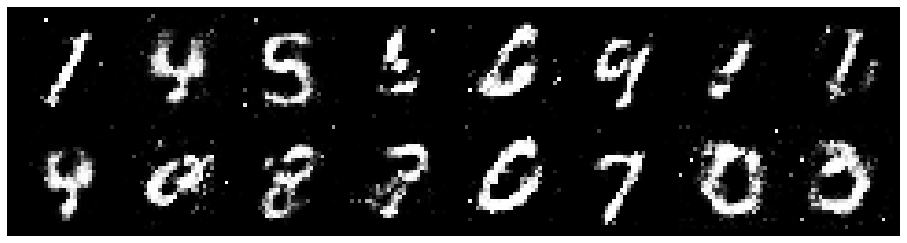

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 1.0243, Generator Loss: 1.2588
D(x): 0.6543, D(G(z)): 0.3712


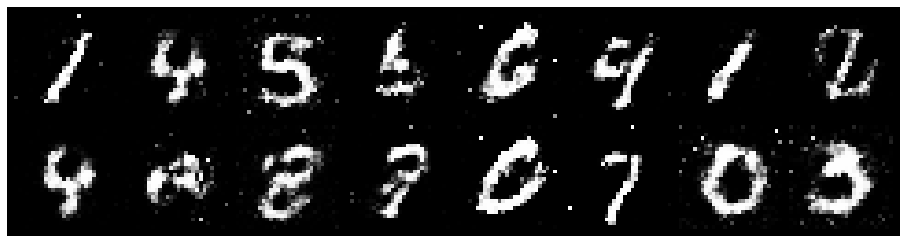

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.8539, Generator Loss: 1.4351
D(x): 0.6596, D(G(z)): 0.2644


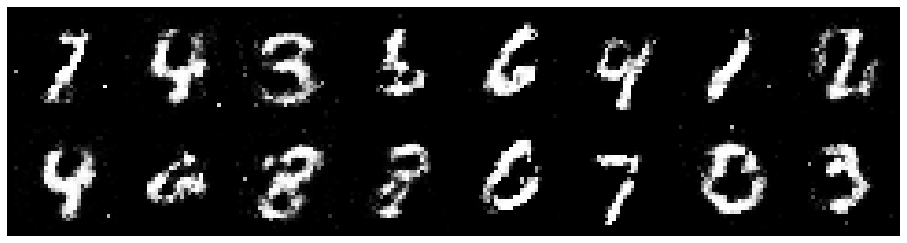

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.2448, Generator Loss: 1.4224
D(x): 0.5977, D(G(z)): 0.3699


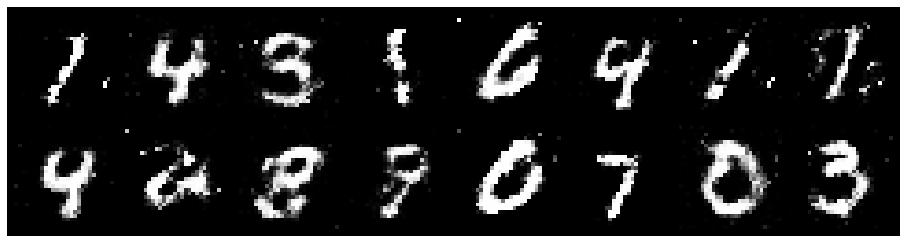

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.0316, Generator Loss: 1.2468
D(x): 0.6311, D(G(z)): 0.3665


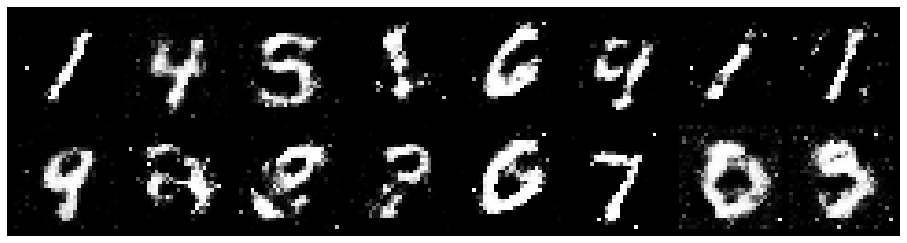

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.9722, Generator Loss: 1.2473
D(x): 0.6510, D(G(z)): 0.3248


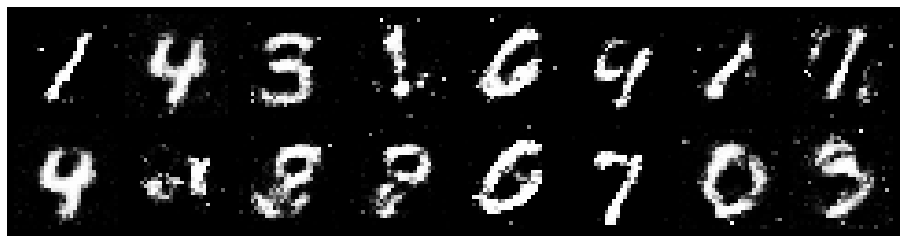

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.9072, Generator Loss: 1.6000
D(x): 0.6805, D(G(z)): 0.2980


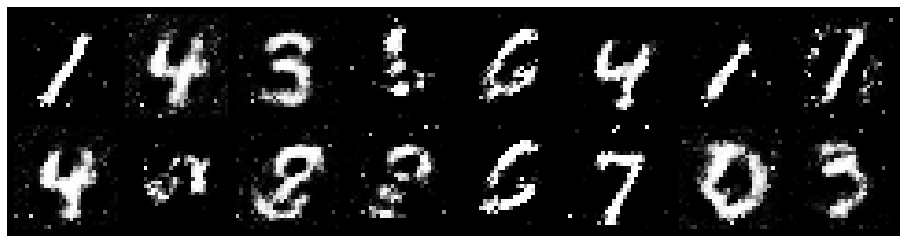

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0846, Generator Loss: 1.4177
D(x): 0.5904, D(G(z)): 0.2927


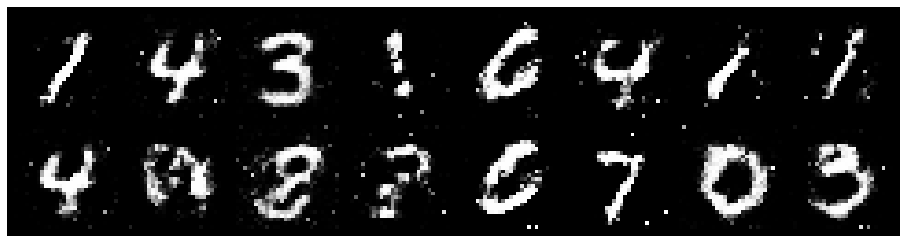

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 1.1268, Generator Loss: 1.3733
D(x): 0.7197, D(G(z)): 0.4068


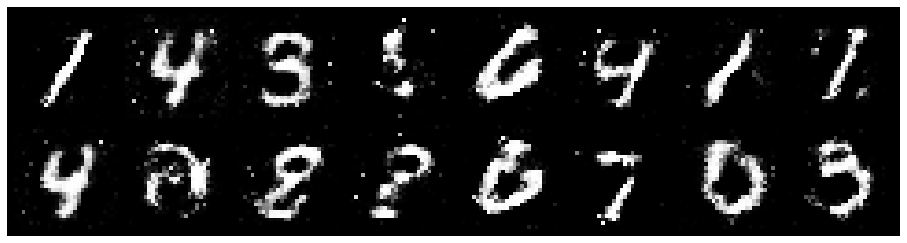

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 0.9379, Generator Loss: 1.1871
D(x): 0.7338, D(G(z)): 0.3713


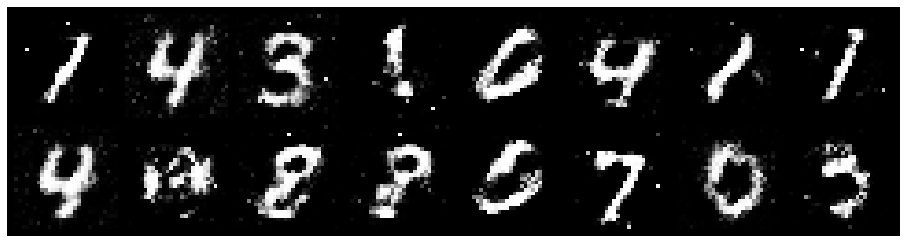

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 0.8539, Generator Loss: 1.3899
D(x): 0.7054, D(G(z)): 0.3050


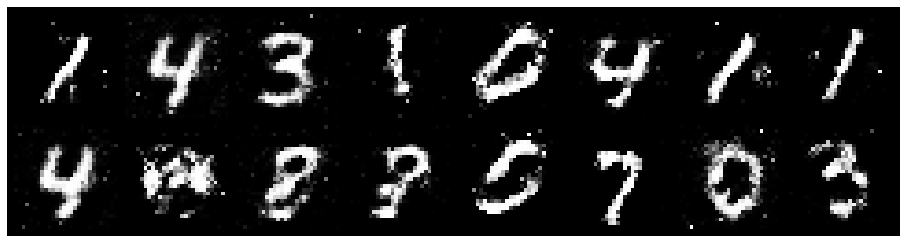

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 0.9067, Generator Loss: 1.8747
D(x): 0.6684, D(G(z)): 0.2497


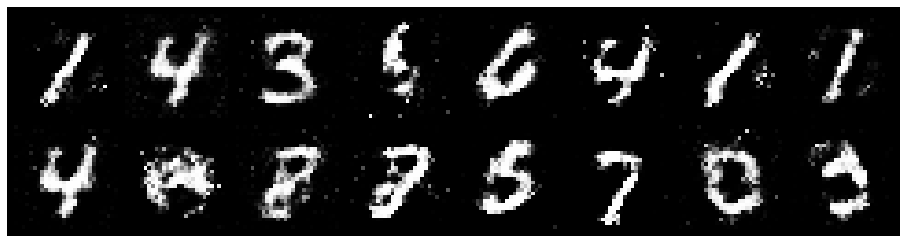

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0231, Generator Loss: 1.7023
D(x): 0.7365, D(G(z)): 0.3904


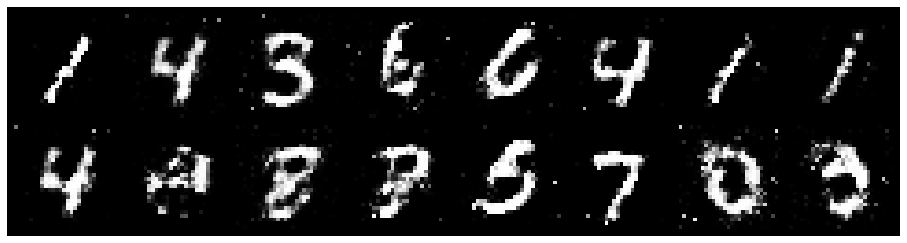

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.1932, Generator Loss: 1.0393
D(x): 0.6676, D(G(z)): 0.4289


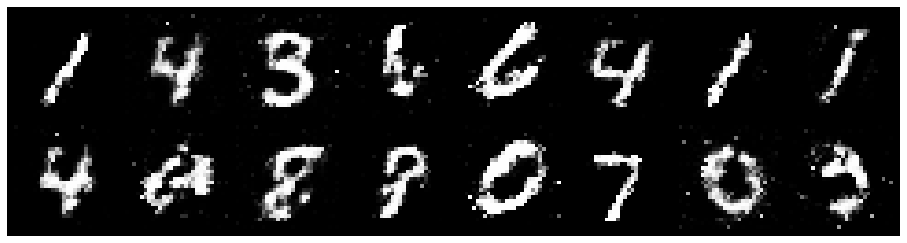

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.9864, Generator Loss: 1.3380
D(x): 0.6721, D(G(z)): 0.3632


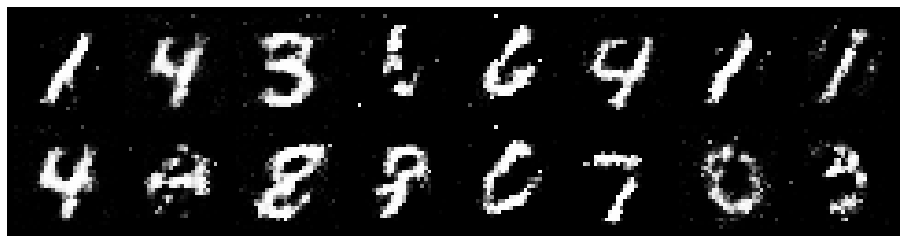

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.8607, Generator Loss: 1.3625
D(x): 0.7408, D(G(z)): 0.3214


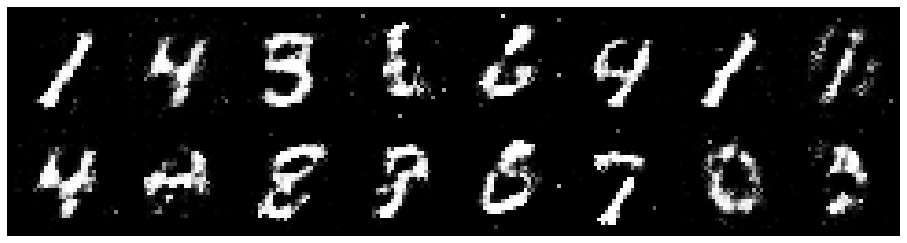

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 1.0873, Generator Loss: 1.7029
D(x): 0.7000, D(G(z)): 0.3641


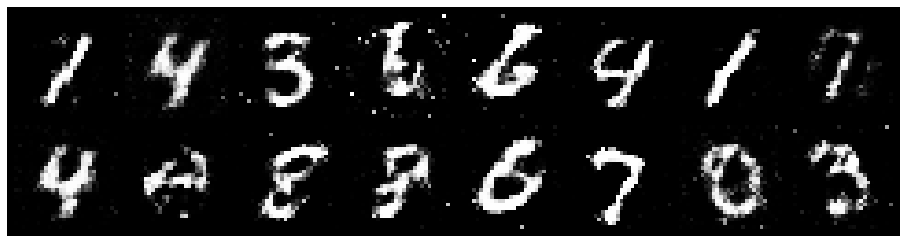

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.9567, Generator Loss: 1.4941
D(x): 0.6001, D(G(z)): 0.2207


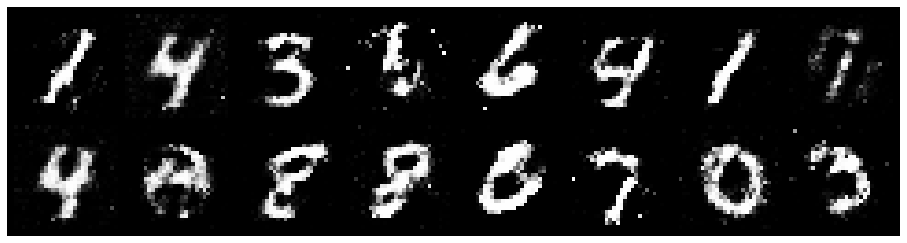

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.2273, Generator Loss: 1.3306
D(x): 0.6267, D(G(z)): 0.4008


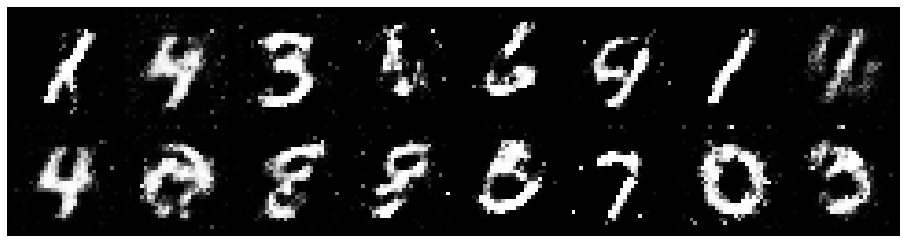

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.1263, Generator Loss: 1.1879
D(x): 0.6568, D(G(z)): 0.3826


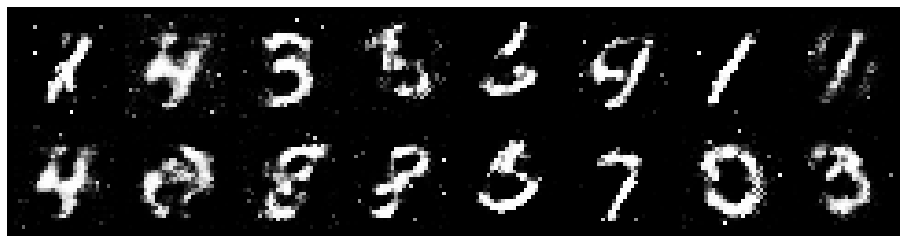

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0129, Generator Loss: 1.2979
D(x): 0.6366, D(G(z)): 0.3432


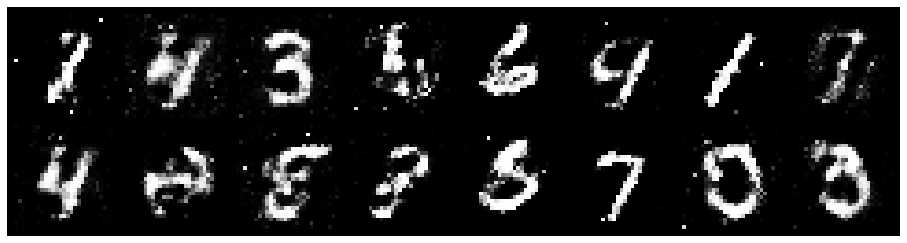

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.9394, Generator Loss: 1.3749
D(x): 0.7173, D(G(z)): 0.3509


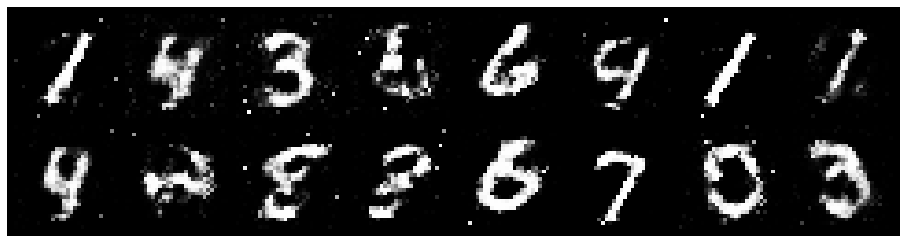

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 1.1448, Generator Loss: 1.2678
D(x): 0.5904, D(G(z)): 0.3536


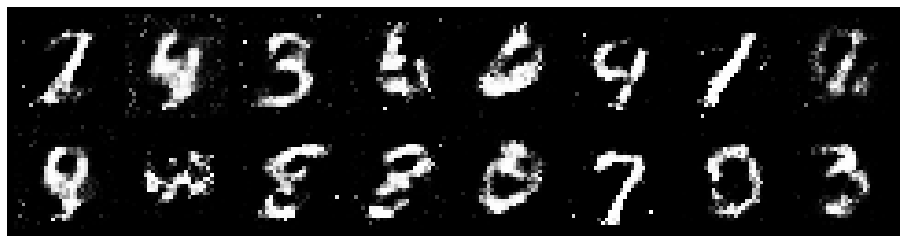

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.1146, Generator Loss: 1.0698
D(x): 0.6100, D(G(z)): 0.3843


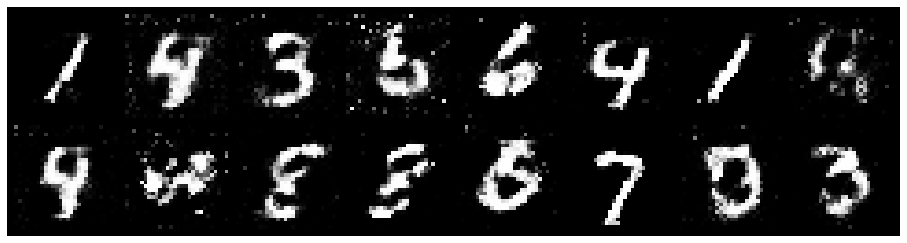

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.9753, Generator Loss: 1.6296
D(x): 0.6183, D(G(z)): 0.2858


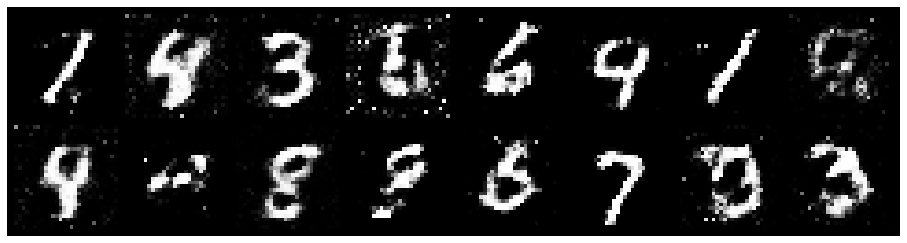

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.9469, Generator Loss: 1.3555
D(x): 0.6711, D(G(z)): 0.3249


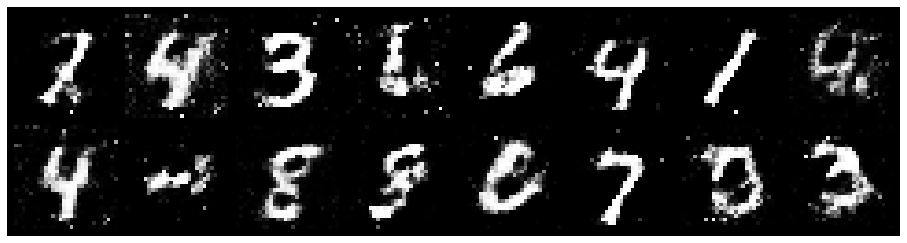

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9786, Generator Loss: 1.2184
D(x): 0.6538, D(G(z)): 0.3304


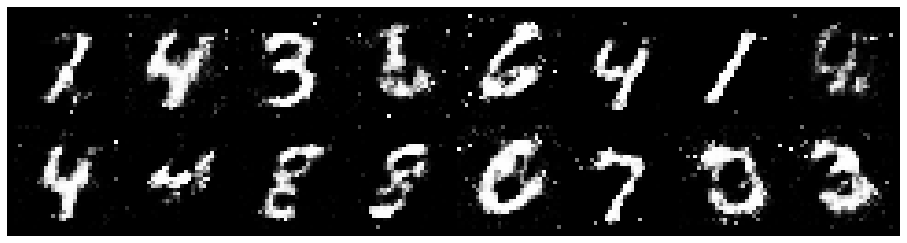

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.1613, Generator Loss: 1.3462
D(x): 0.6023, D(G(z)): 0.3930


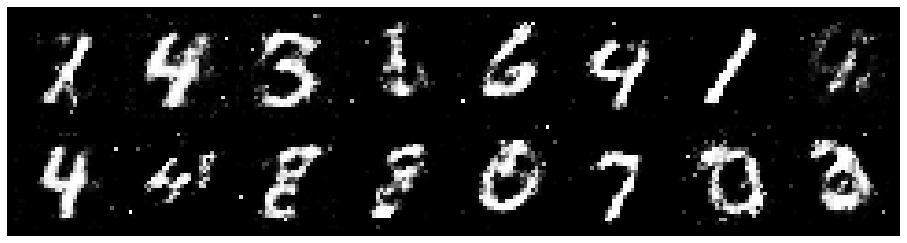

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.0753, Generator Loss: 1.3162
D(x): 0.6755, D(G(z)): 0.3899


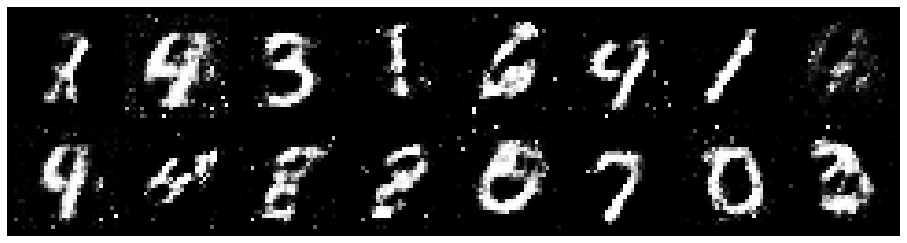

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 1.0850, Generator Loss: 1.2051
D(x): 0.5980, D(G(z)): 0.3375


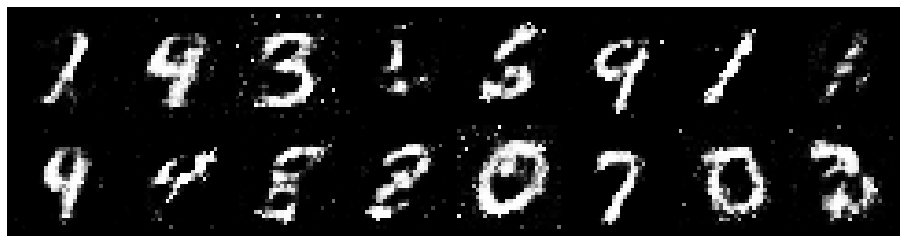

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0758, Generator Loss: 1.2148
D(x): 0.6745, D(G(z)): 0.3694


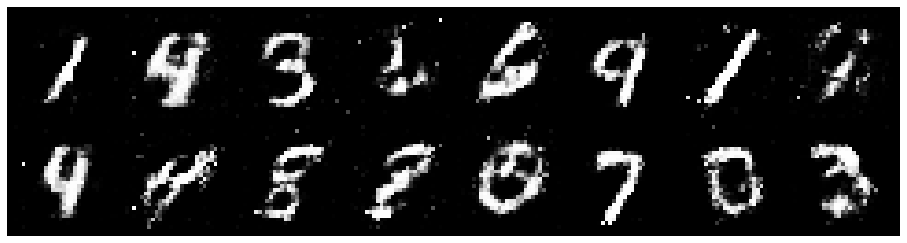

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0126, Generator Loss: 1.6943
D(x): 0.6844, D(G(z)): 0.3229


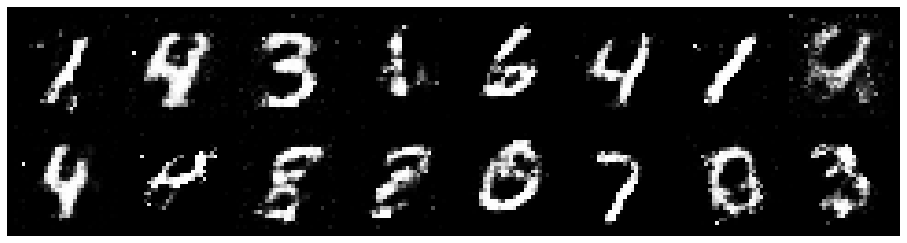

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 0.9785, Generator Loss: 1.2728
D(x): 0.7093, D(G(z)): 0.3251


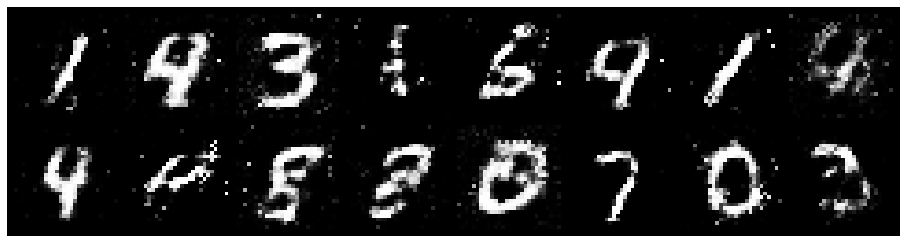

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.2357, Generator Loss: 1.2164
D(x): 0.6485, D(G(z)): 0.4135


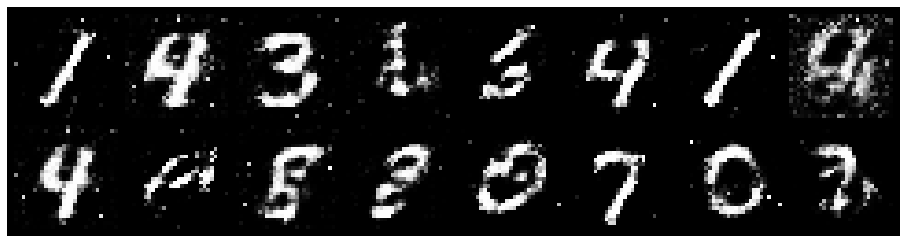

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.0547, Generator Loss: 1.2024
D(x): 0.6589, D(G(z)): 0.3632


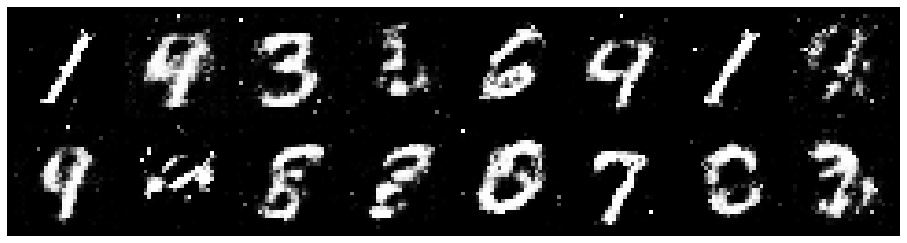

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 0.9138, Generator Loss: 1.2837
D(x): 0.7511, D(G(z)): 0.3879


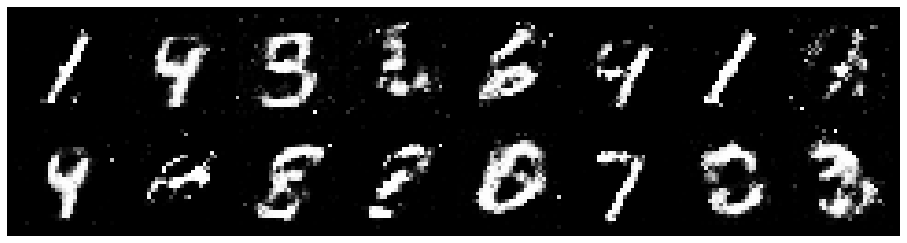

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.0003, Generator Loss: 1.0884
D(x): 0.6731, D(G(z)): 0.3963


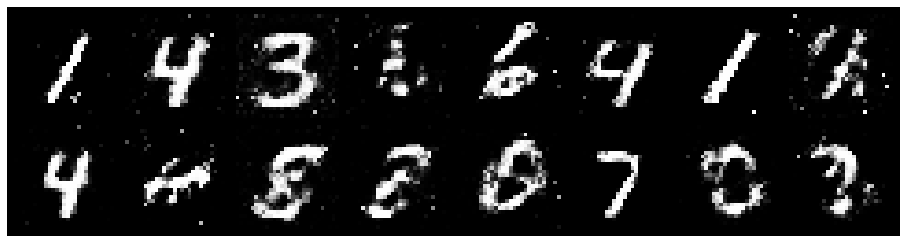

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 0.8993, Generator Loss: 1.6436
D(x): 0.7430, D(G(z)): 0.3575


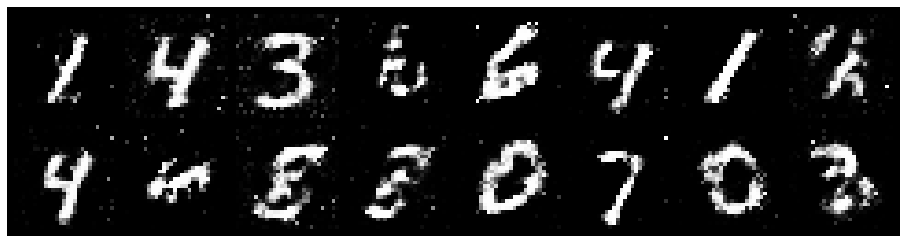

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.3026, Generator Loss: 1.2419
D(x): 0.6455, D(G(z)): 0.4382


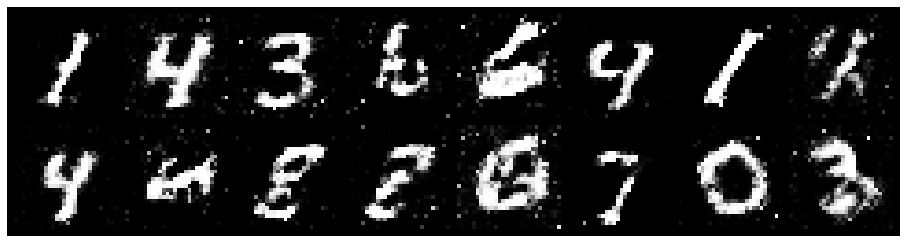

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.1815, Generator Loss: 1.1543
D(x): 0.6821, D(G(z)): 0.4321


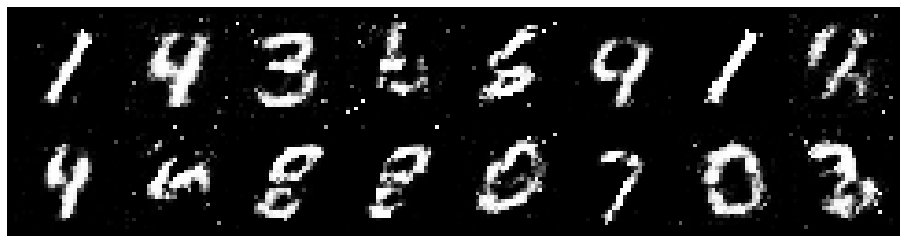

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.1556, Generator Loss: 1.1157
D(x): 0.6370, D(G(z)): 0.4040


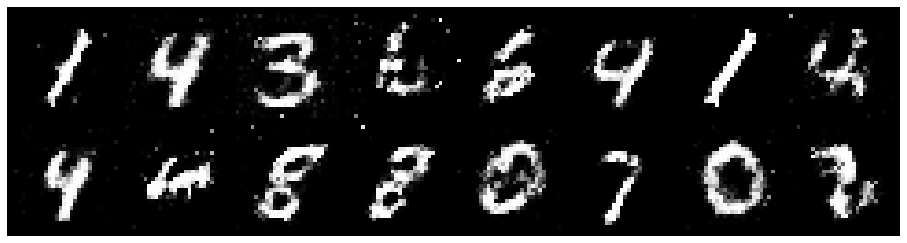

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 0.9281, Generator Loss: 1.5058
D(x): 0.6793, D(G(z)): 0.3294


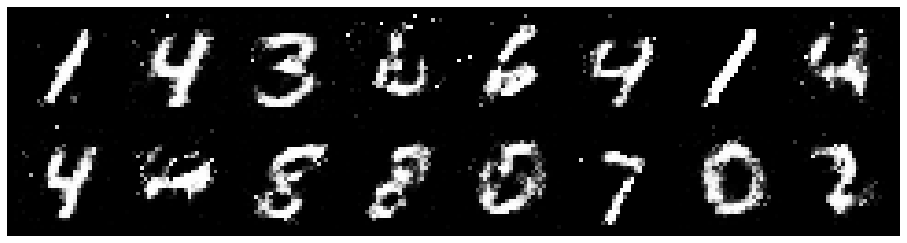

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9052, Generator Loss: 1.2413
D(x): 0.6801, D(G(z)): 0.3367


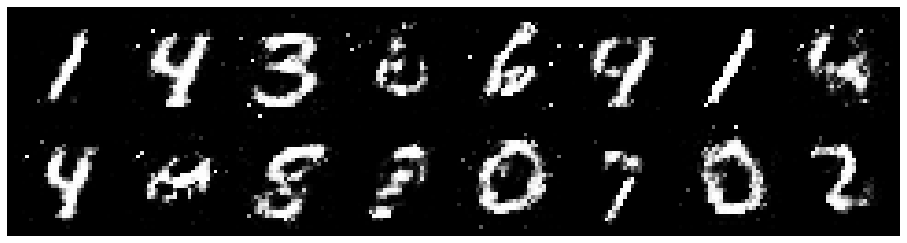

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.1293, Generator Loss: 1.3360
D(x): 0.6747, D(G(z)): 0.4349


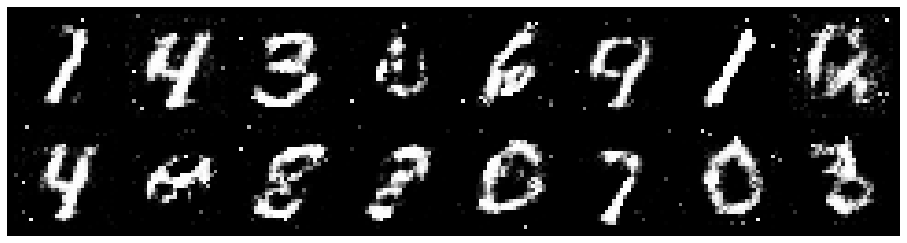

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0552, Generator Loss: 1.5152
D(x): 0.6107, D(G(z)): 0.3086


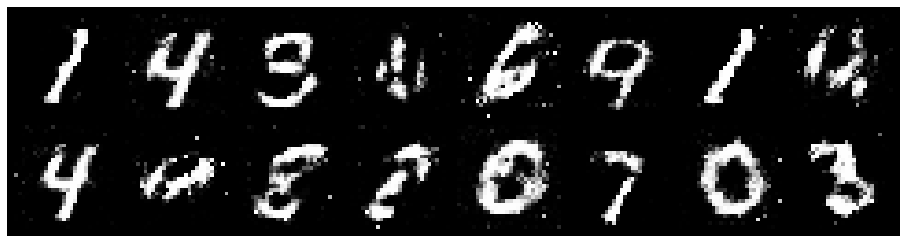

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.1430, Generator Loss: 1.0160
D(x): 0.6070, D(G(z)): 0.3651


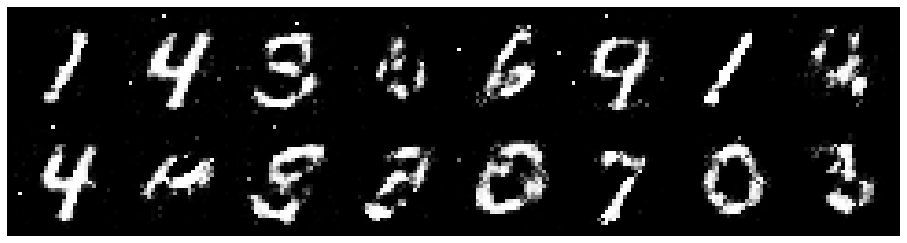

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.1082, Generator Loss: 1.0912
D(x): 0.6361, D(G(z)): 0.4094


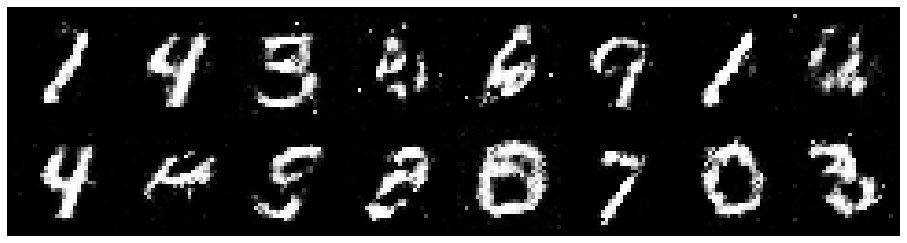

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.0520, Generator Loss: 1.2797
D(x): 0.6294, D(G(z)): 0.3569


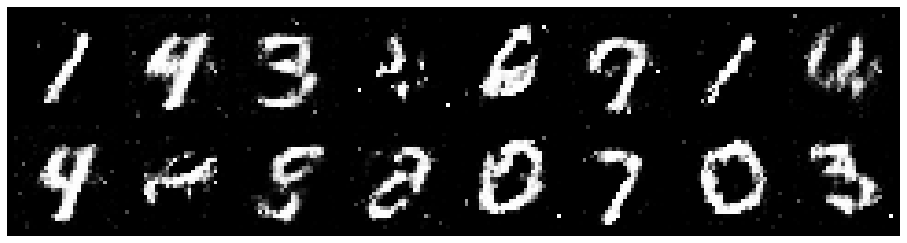

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.0139, Generator Loss: 1.1541
D(x): 0.6620, D(G(z)): 0.3727


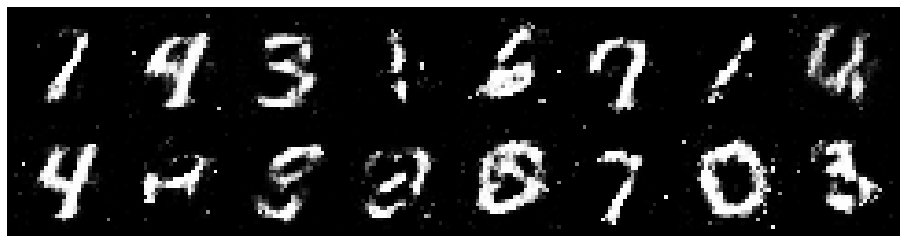

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 0.9977, Generator Loss: 1.1613
D(x): 0.6529, D(G(z)): 0.3489


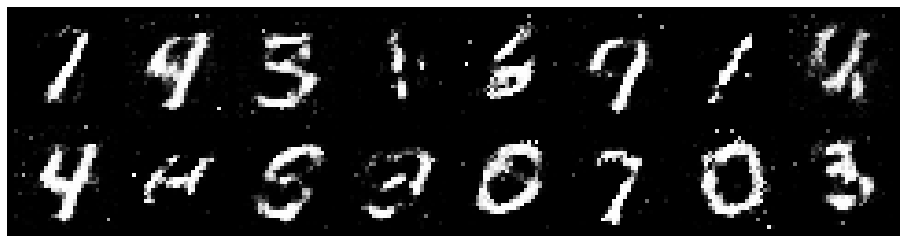

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0485, Generator Loss: 1.3573
D(x): 0.6895, D(G(z)): 0.4071


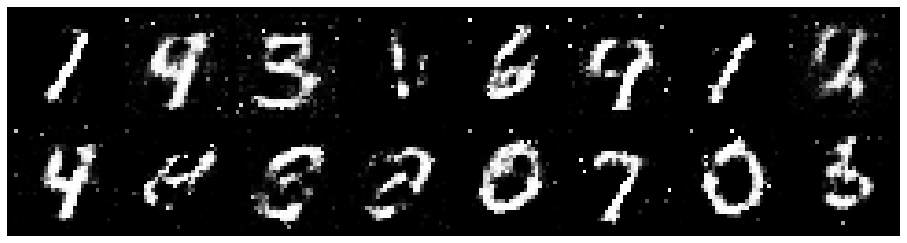

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 0.9896, Generator Loss: 1.5075
D(x): 0.6368, D(G(z)): 0.2931


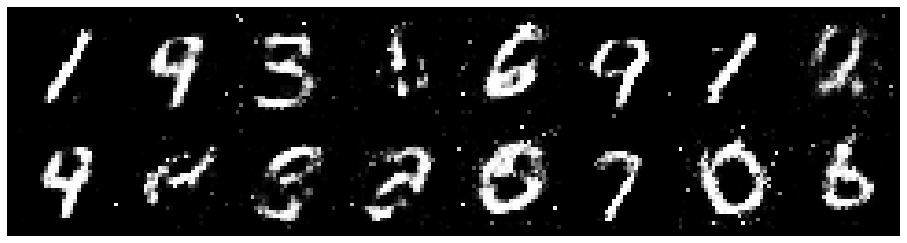

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0617, Generator Loss: 1.1379
D(x): 0.6034, D(G(z)): 0.3188


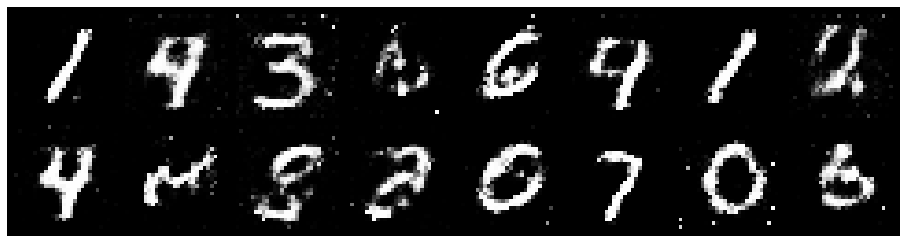

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.1093, Generator Loss: 1.2210
D(x): 0.5650, D(G(z)): 0.3127


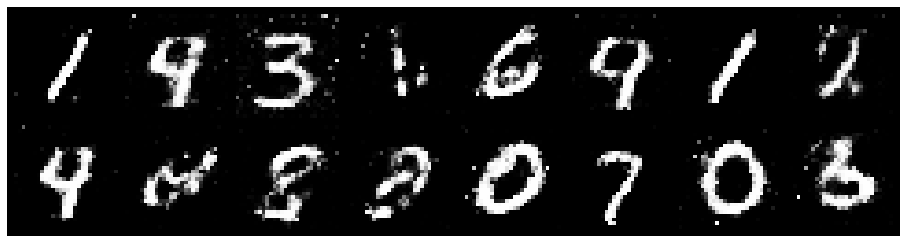

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.1756, Generator Loss: 1.0518
D(x): 0.5578, D(G(z)): 0.3781


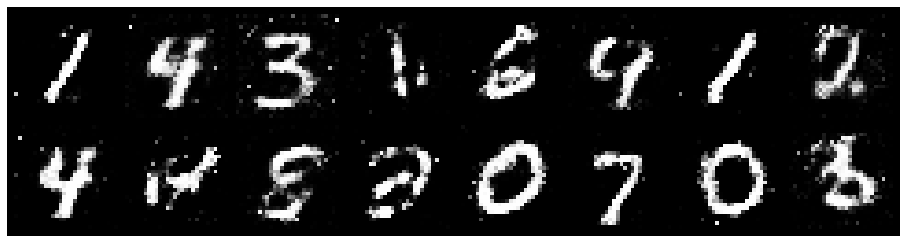

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.1406, Generator Loss: 0.9907
D(x): 0.6134, D(G(z)): 0.4063


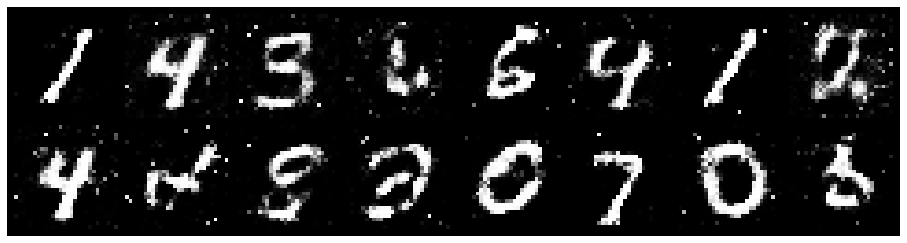

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.1775, Generator Loss: 1.0689
D(x): 0.5856, D(G(z)): 0.3963


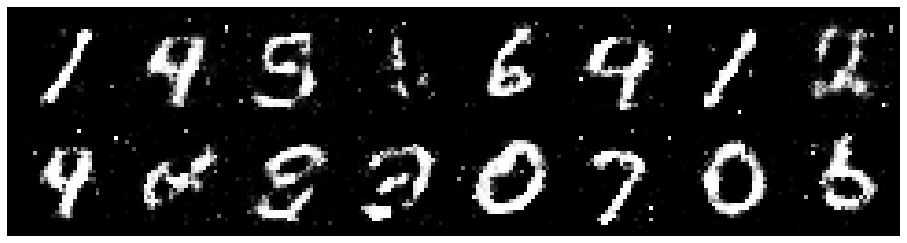

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.0695, Generator Loss: 1.1686
D(x): 0.6411, D(G(z)): 0.4075


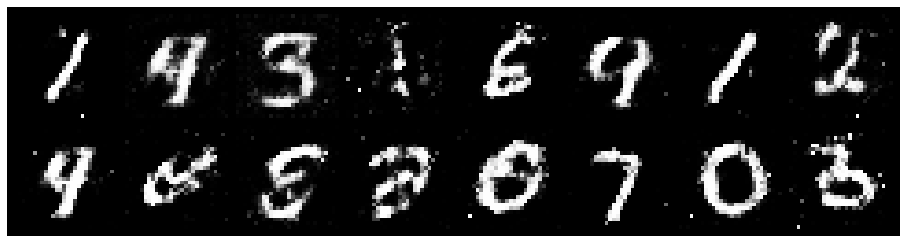

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.2025, Generator Loss: 1.2576
D(x): 0.6334, D(G(z)): 0.3911


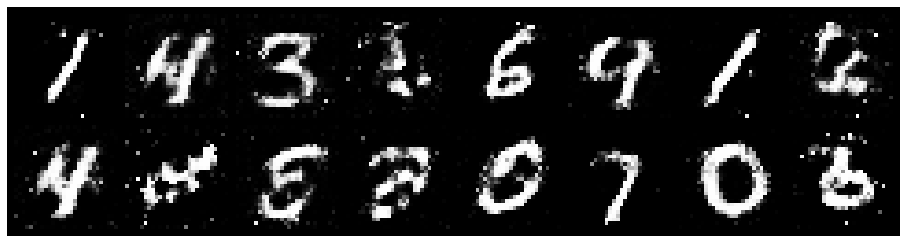

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.2394, Generator Loss: 1.4849
D(x): 0.5553, D(G(z)): 0.3722


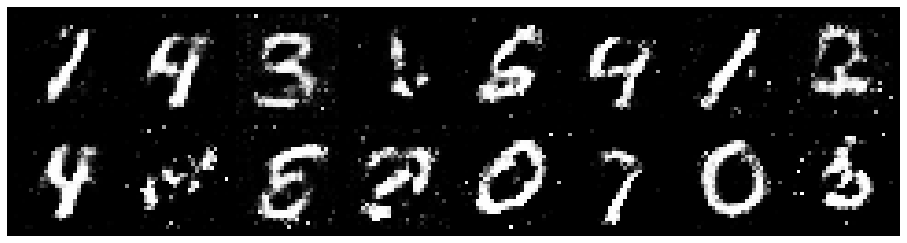

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.2318, Generator Loss: 1.0461
D(x): 0.6598, D(G(z)): 0.4608


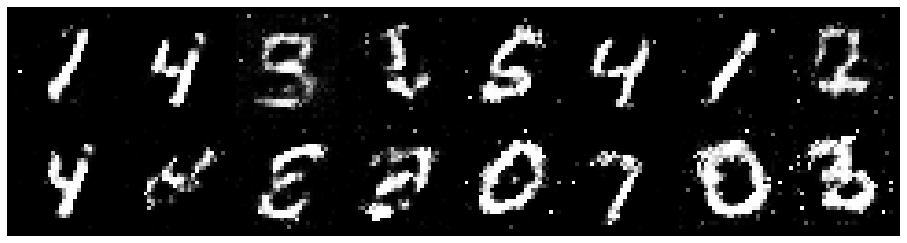

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0324, Generator Loss: 1.1822
D(x): 0.6189, D(G(z)): 0.3480


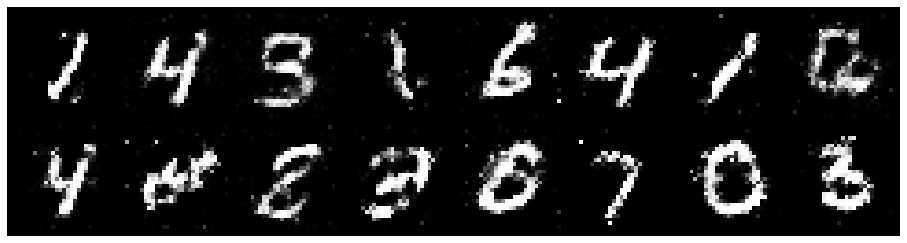

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.1695, Generator Loss: 1.0897
D(x): 0.6002, D(G(z)): 0.4129


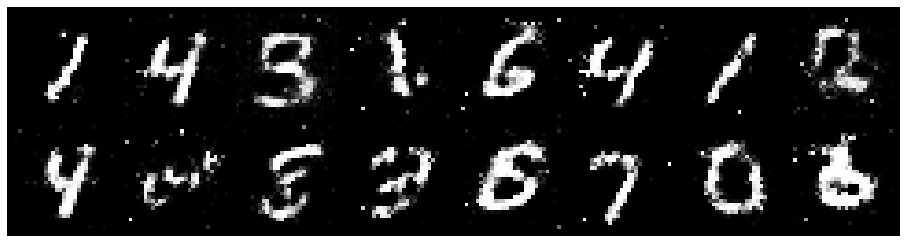

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.0558, Generator Loss: 1.4059
D(x): 0.7335, D(G(z)): 0.3970


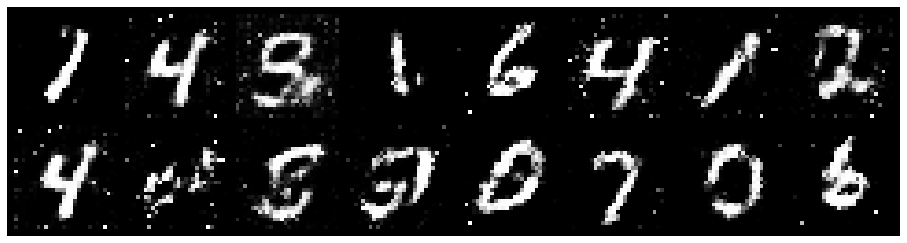

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.0592, Generator Loss: 1.5390
D(x): 0.6445, D(G(z)): 0.3549


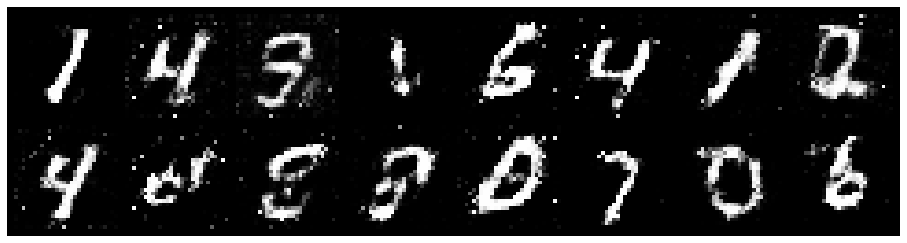

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.1247, Generator Loss: 0.9341
D(x): 0.6555, D(G(z)): 0.4180


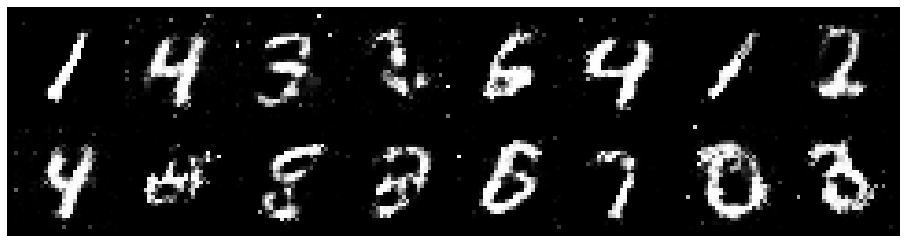

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0209, Generator Loss: 0.9487
D(x): 0.6438, D(G(z)): 0.3765


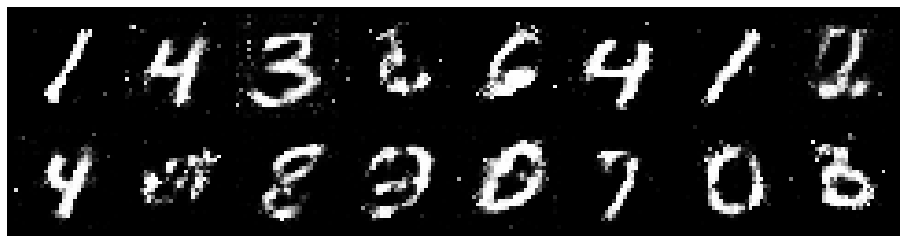

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0858, Generator Loss: 1.1540
D(x): 0.5685, D(G(z)): 0.3354


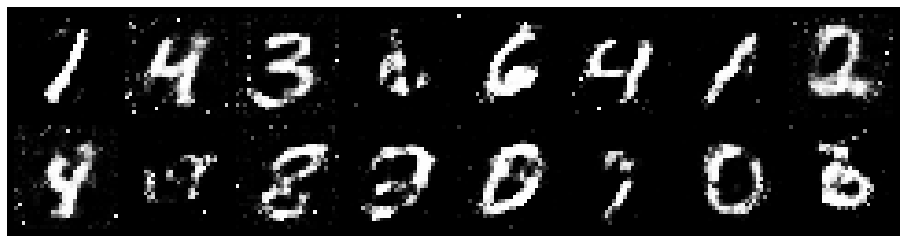

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.0690, Generator Loss: 1.1536
D(x): 0.5582, D(G(z)): 0.3202


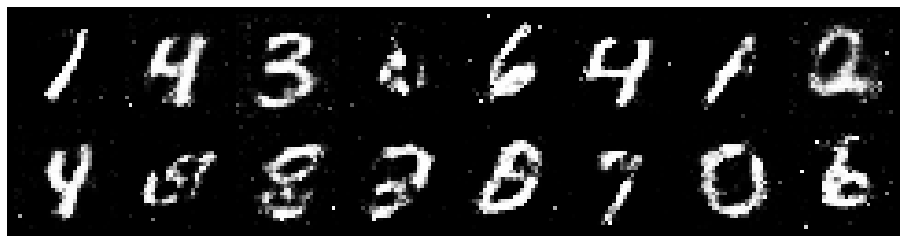

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.0016, Generator Loss: 1.1173
D(x): 0.6628, D(G(z)): 0.3739


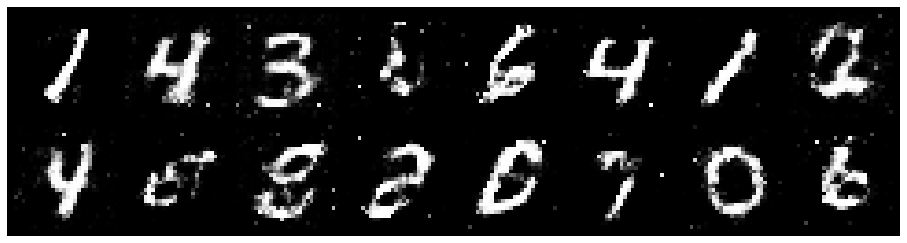

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.1629, Generator Loss: 1.2541
D(x): 0.6438, D(G(z)): 0.4053


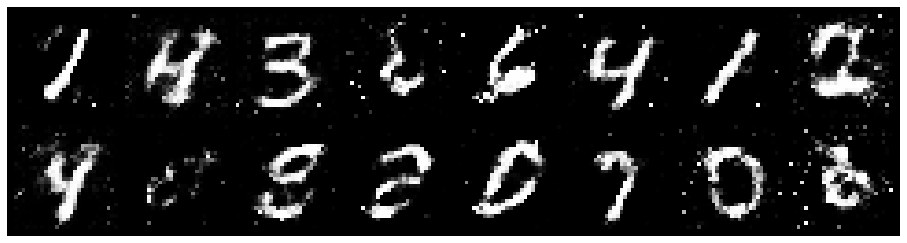

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.0985, Generator Loss: 1.2683
D(x): 0.5806, D(G(z)): 0.3336


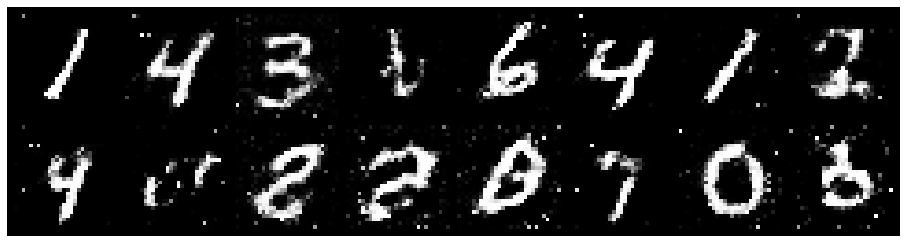

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.0416, Generator Loss: 1.1776
D(x): 0.6388, D(G(z)): 0.3647


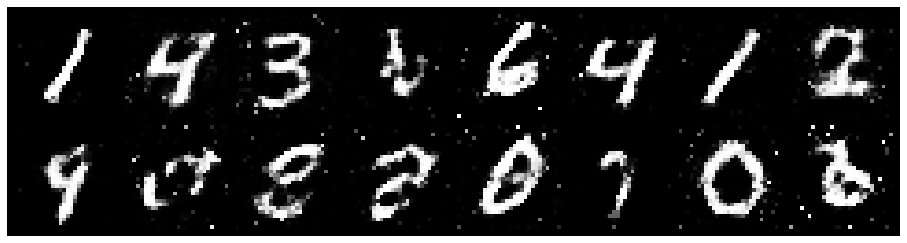

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.0854, Generator Loss: 1.1975
D(x): 0.5684, D(G(z)): 0.3400


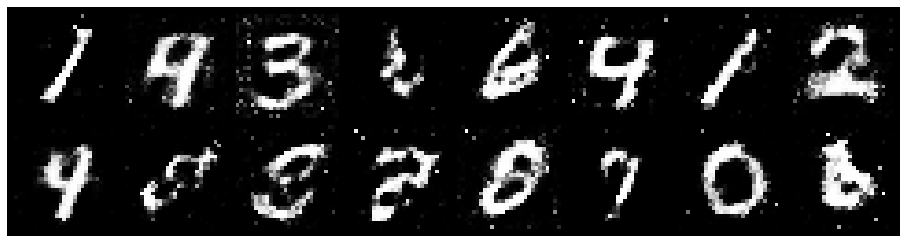

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.3253, Generator Loss: 1.0311
D(x): 0.5815, D(G(z)): 0.4424


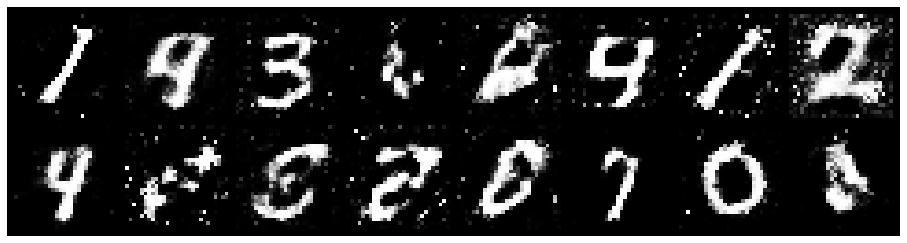

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.1016, Generator Loss: 0.8694
D(x): 0.6522, D(G(z)): 0.4469


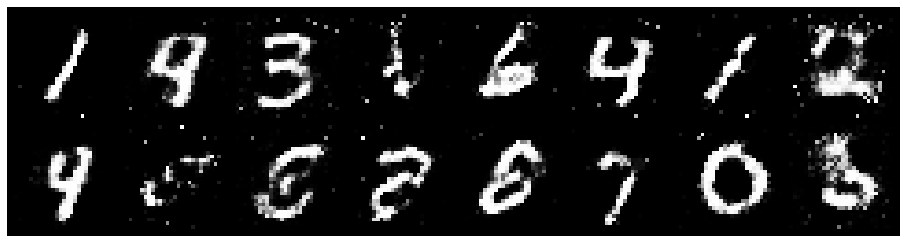

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.2350, Generator Loss: 0.9430
D(x): 0.5998, D(G(z)): 0.4486


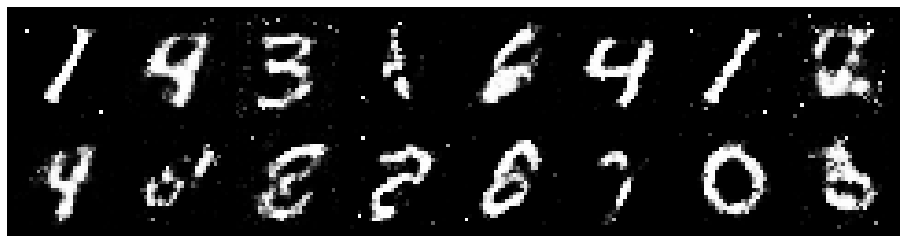

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.1378, Generator Loss: 1.0123
D(x): 0.6222, D(G(z)): 0.4019


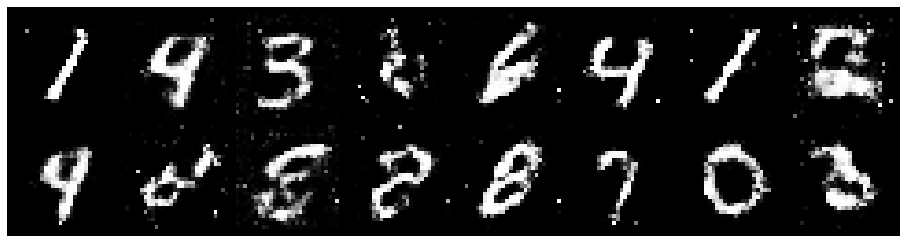

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0481, Generator Loss: 1.4156
D(x): 0.6416, D(G(z)): 0.3623


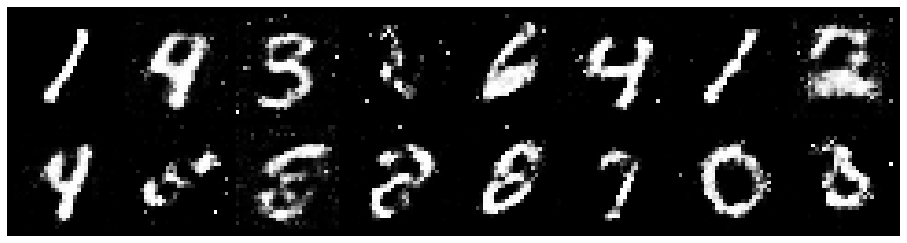

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.0213, Generator Loss: 1.4650
D(x): 0.6700, D(G(z)): 0.3577


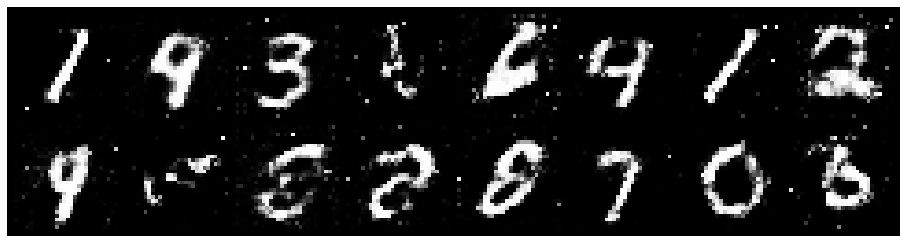

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 0.9885, Generator Loss: 1.5365
D(x): 0.6977, D(G(z)): 0.3278


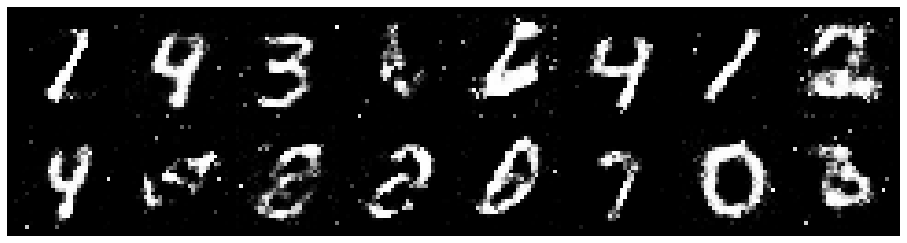

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1722, Generator Loss: 1.1273
D(x): 0.5790, D(G(z)): 0.3983


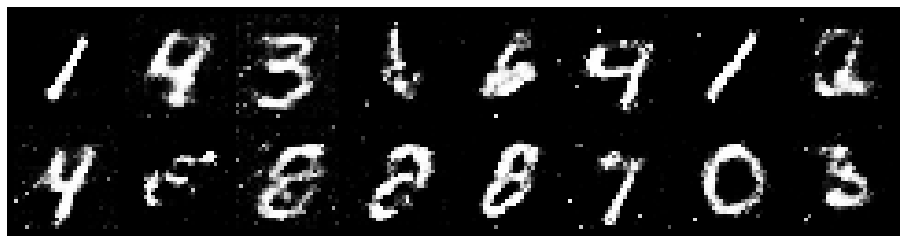

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.0482, Generator Loss: 1.1791
D(x): 0.6205, D(G(z)): 0.3678


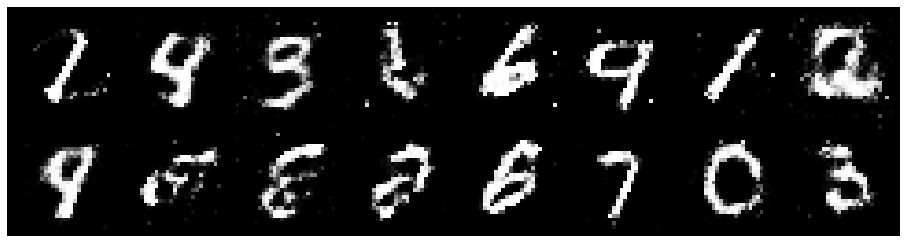

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.1750, Generator Loss: 0.9949
D(x): 0.5835, D(G(z)): 0.4114


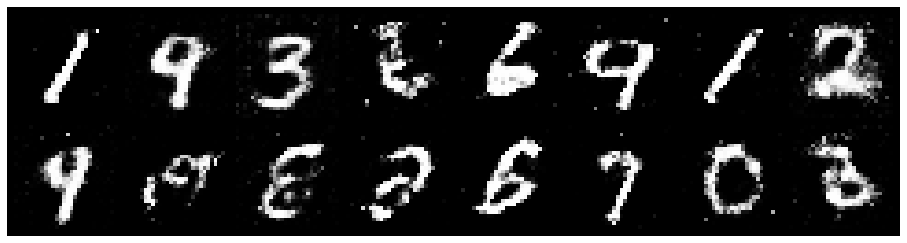

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.1049, Generator Loss: 1.2172
D(x): 0.5695, D(G(z)): 0.3281


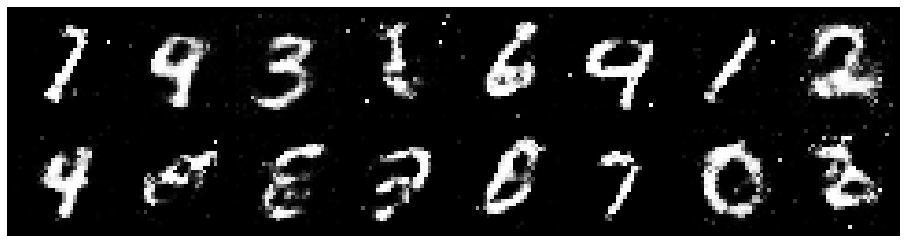

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.0124, Generator Loss: 1.6197
D(x): 0.6599, D(G(z)): 0.3287


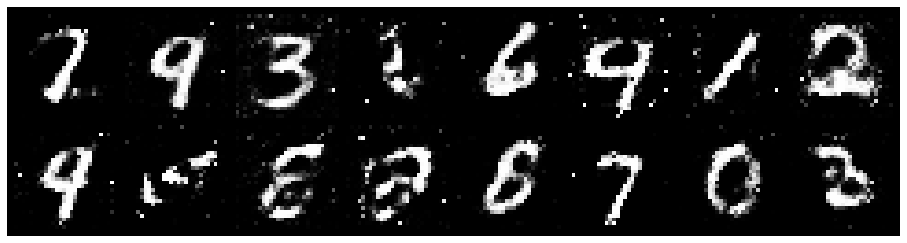

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.0900, Generator Loss: 1.2528
D(x): 0.5775, D(G(z)): 0.3434


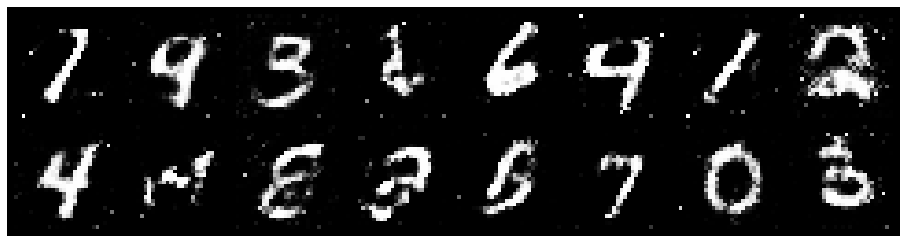

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 0.9968, Generator Loss: 1.4111
D(x): 0.6706, D(G(z)): 0.3550


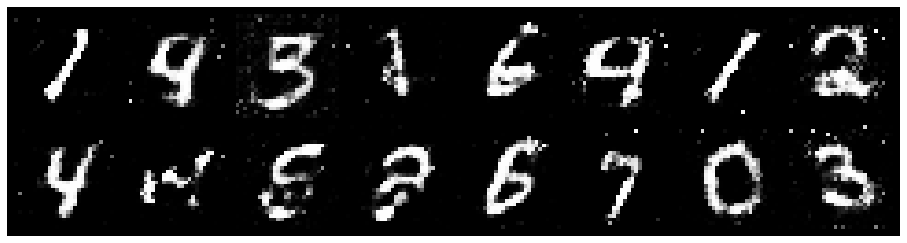

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.2912, Generator Loss: 0.9489
D(x): 0.6872, D(G(z)): 0.4795


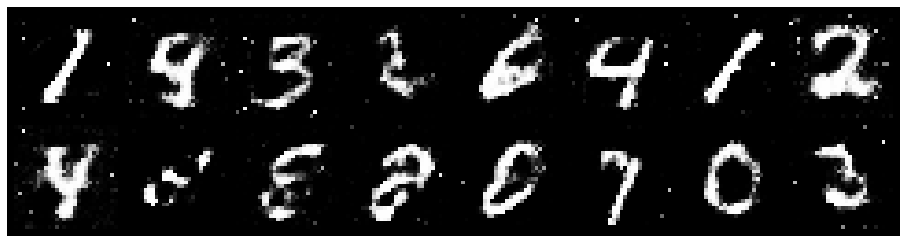

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.2960, Generator Loss: 1.1245
D(x): 0.6179, D(G(z)): 0.4526


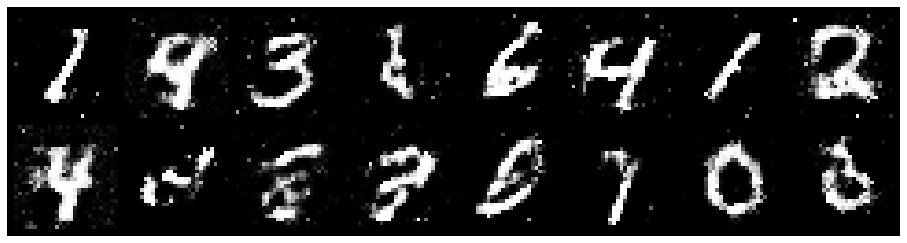

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.3415, Generator Loss: 0.9379
D(x): 0.6328, D(G(z)): 0.4914


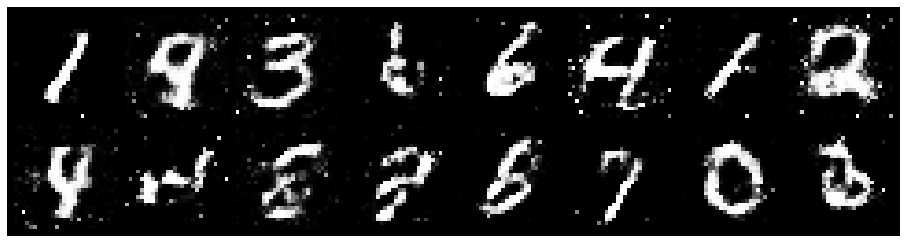

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1410, Generator Loss: 1.2596
D(x): 0.6352, D(G(z)): 0.3827


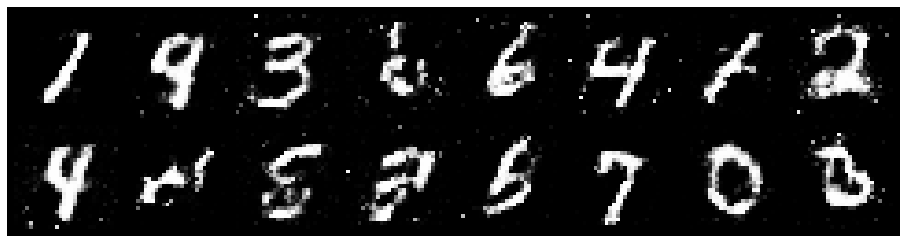

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.0569, Generator Loss: 1.0703
D(x): 0.6247, D(G(z)): 0.3419


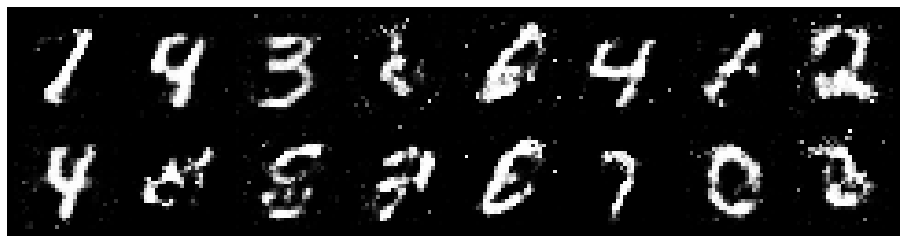

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2663, Generator Loss: 0.9052
D(x): 0.6651, D(G(z)): 0.4909


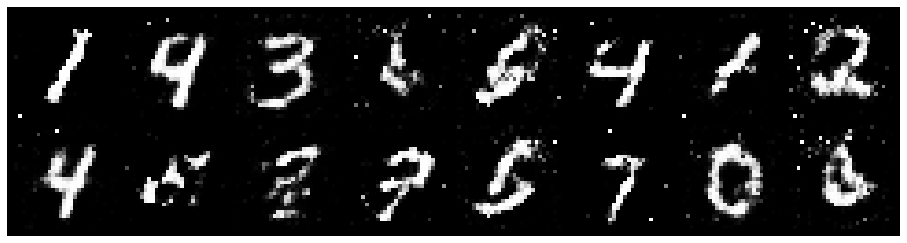

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 0.9151, Generator Loss: 1.5374
D(x): 0.6135, D(G(z)): 0.2700


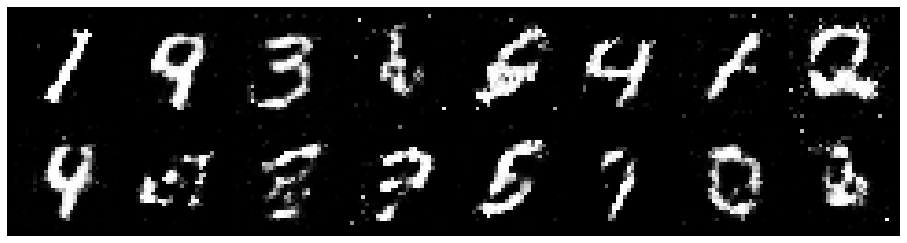

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.1178, Generator Loss: 1.3368
D(x): 0.6503, D(G(z)): 0.3984


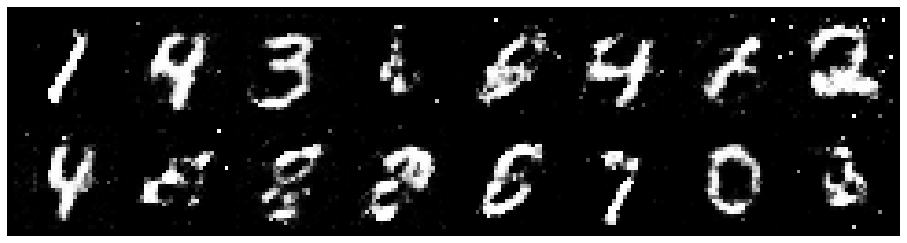

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 0.9539, Generator Loss: 1.4182
D(x): 0.6946, D(G(z)): 0.3564


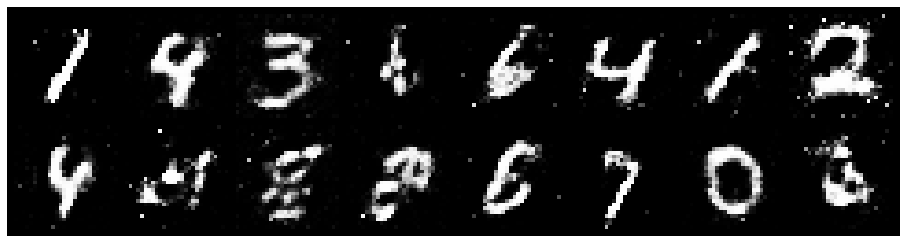

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.0630, Generator Loss: 1.2682
D(x): 0.6489, D(G(z)): 0.3746


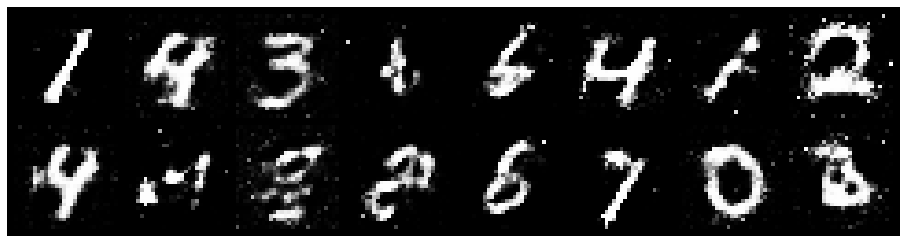

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.3144, Generator Loss: 1.2818
D(x): 0.5995, D(G(z)): 0.4320


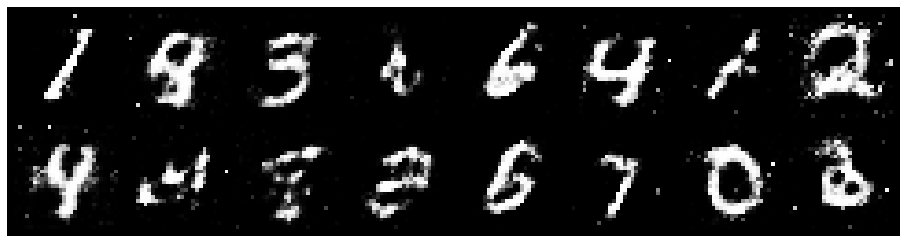

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.1694, Generator Loss: 1.0798
D(x): 0.6503, D(G(z)): 0.4306


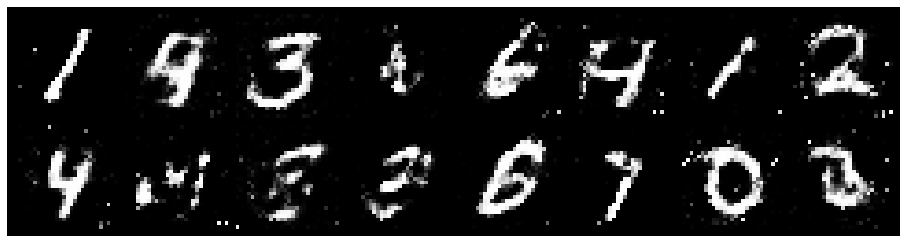

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.1448, Generator Loss: 1.0028
D(x): 0.5803, D(G(z)): 0.3886


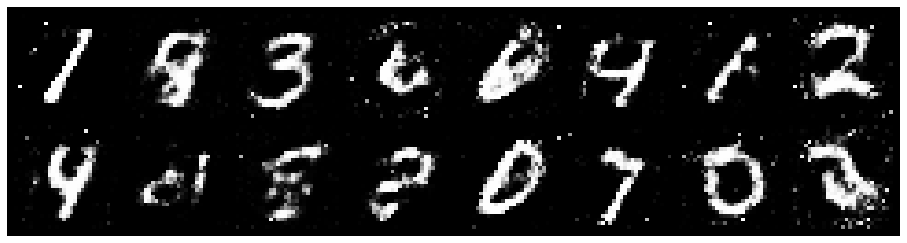

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.2625, Generator Loss: 0.9278
D(x): 0.5747, D(G(z)): 0.4350


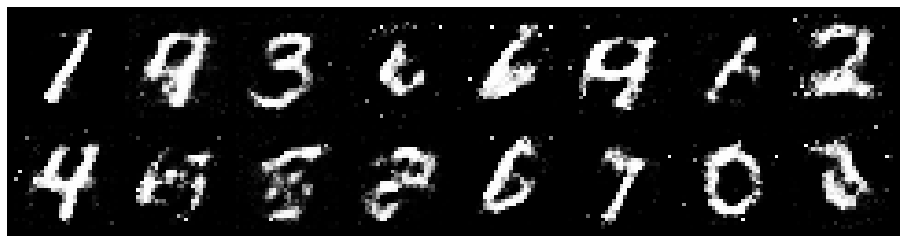

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.1862, Generator Loss: 0.9841
D(x): 0.5804, D(G(z)): 0.4078


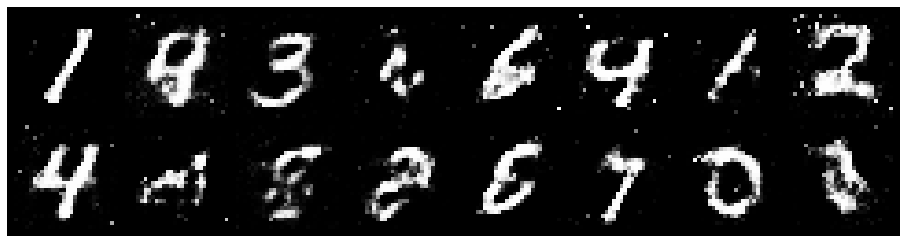

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1544, Generator Loss: 1.1434
D(x): 0.5966, D(G(z)): 0.3848


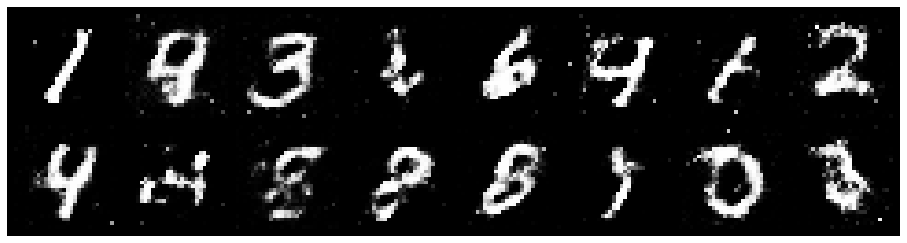

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.0601, Generator Loss: 1.1019
D(x): 0.6705, D(G(z)): 0.4203


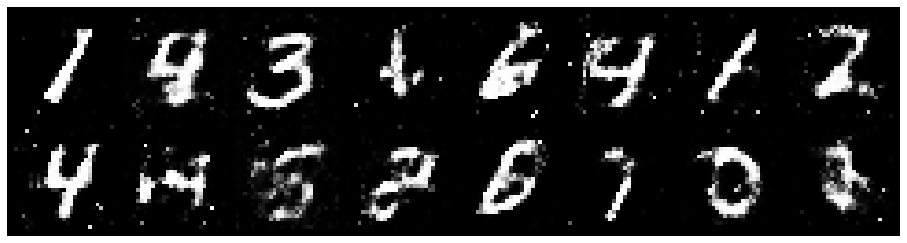

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 0.9057, Generator Loss: 1.3895
D(x): 0.6560, D(G(z)): 0.3082


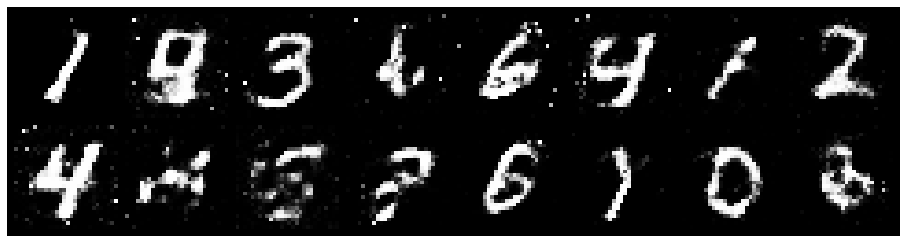

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.0374, Generator Loss: 1.4272
D(x): 0.6254, D(G(z)): 0.3517


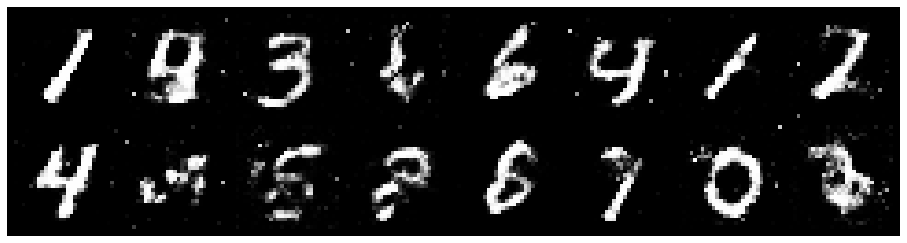

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.1357, Generator Loss: 1.0431
D(x): 0.5871, D(G(z)): 0.3662


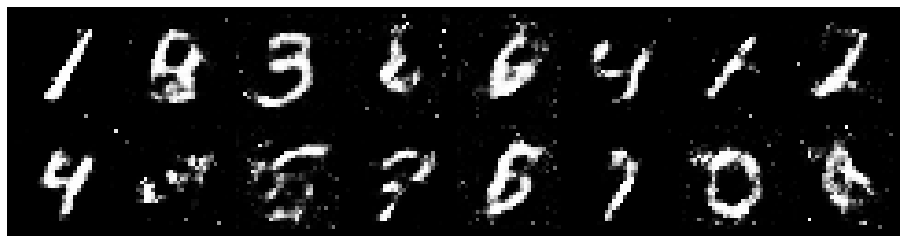

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.1982, Generator Loss: 1.0914
D(x): 0.6177, D(G(z)): 0.4184


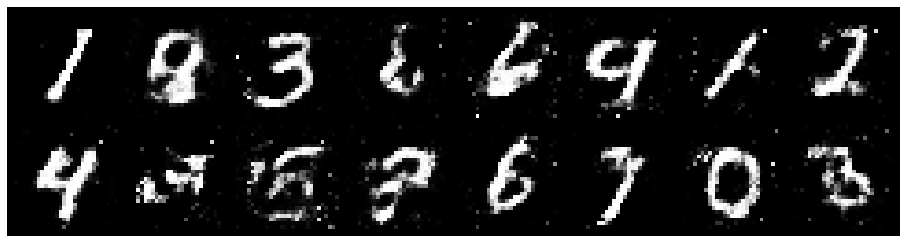

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.0831, Generator Loss: 1.1585
D(x): 0.6019, D(G(z)): 0.3511


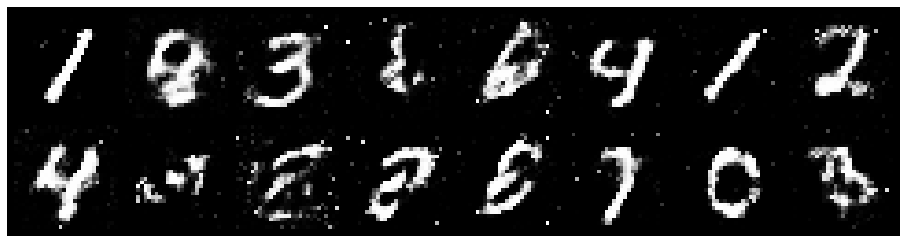

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.2005, Generator Loss: 1.0110
D(x): 0.5712, D(G(z)): 0.3896


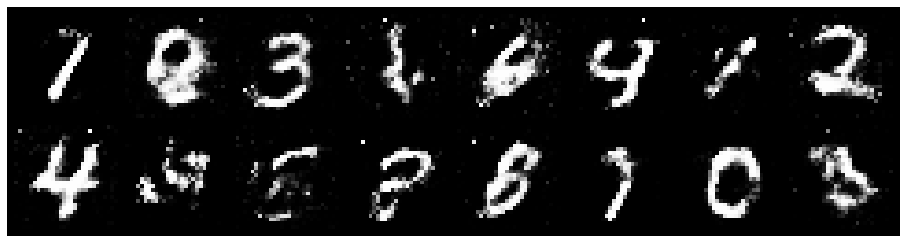

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.1691, Generator Loss: 0.9856
D(x): 0.6033, D(G(z)): 0.4260


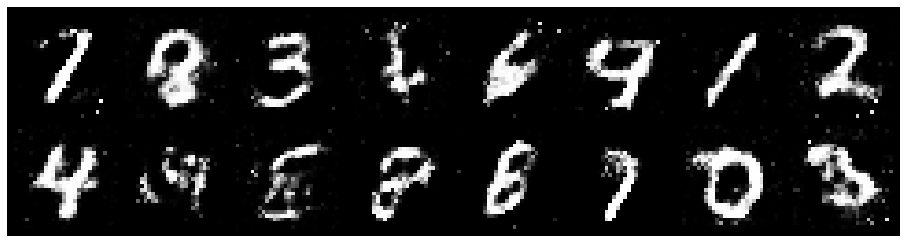

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.2506, Generator Loss: 1.1181
D(x): 0.5970, D(G(z)): 0.4238


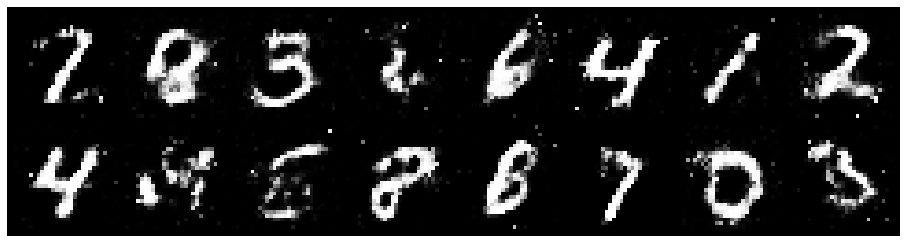

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.1895, Generator Loss: 0.9573
D(x): 0.5684, D(G(z)): 0.3606


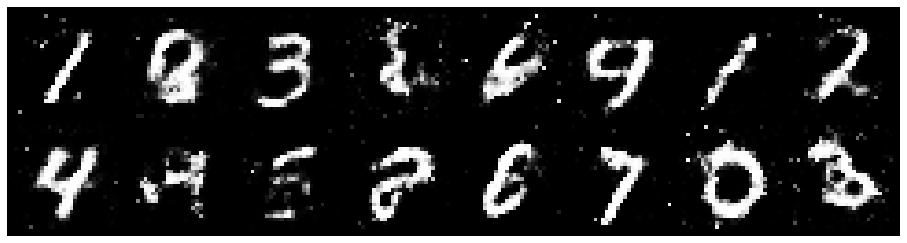

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.2237, Generator Loss: 1.0346
D(x): 0.6632, D(G(z)): 0.4174


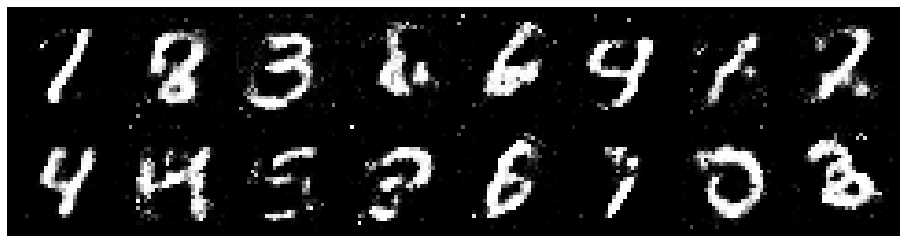

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1740, Generator Loss: 0.9558
D(x): 0.5948, D(G(z)): 0.3860


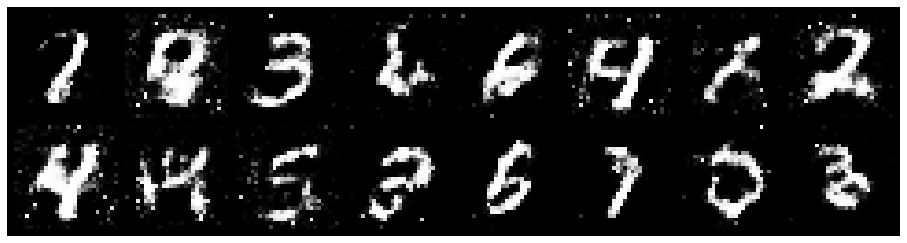

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 0.9694, Generator Loss: 1.1150
D(x): 0.6399, D(G(z)): 0.3547


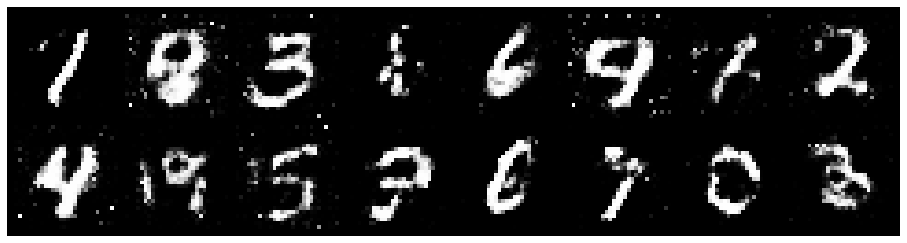

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.0241, Generator Loss: 1.1802
D(x): 0.6252, D(G(z)): 0.3724


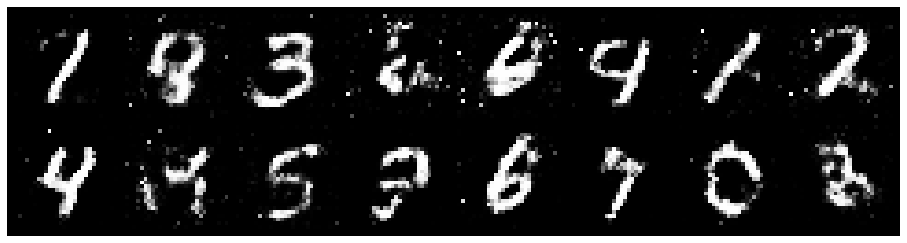

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.0276, Generator Loss: 1.2382
D(x): 0.6125, D(G(z)): 0.3521


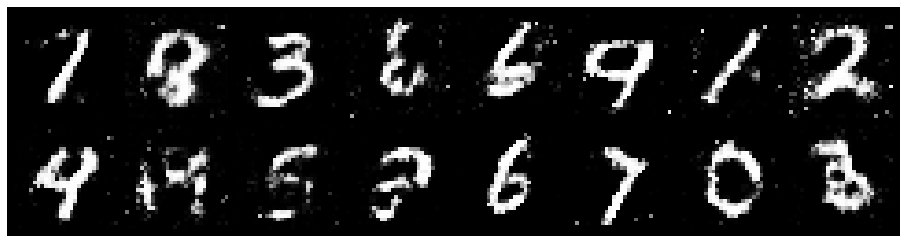

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.0432, Generator Loss: 1.2486
D(x): 0.6087, D(G(z)): 0.3405


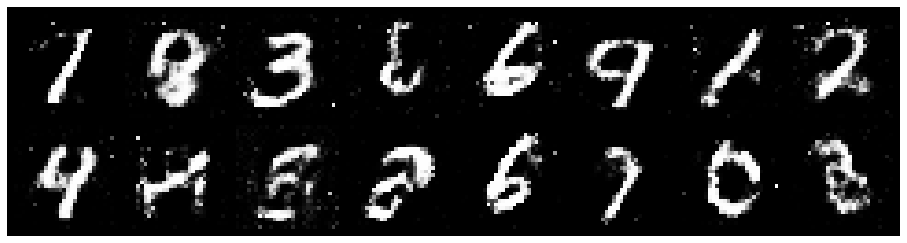

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.1531, Generator Loss: 1.1586
D(x): 0.6486, D(G(z)): 0.3952


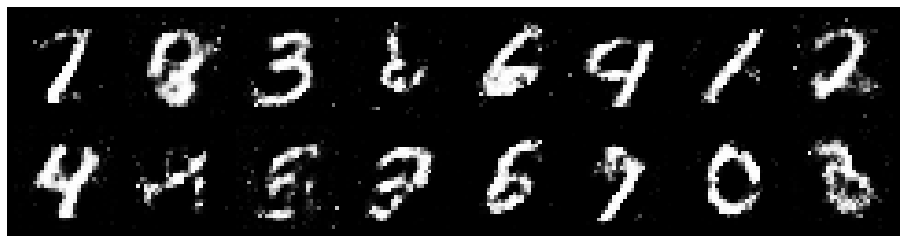

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2495, Generator Loss: 0.8997
D(x): 0.6061, D(G(z)): 0.4642


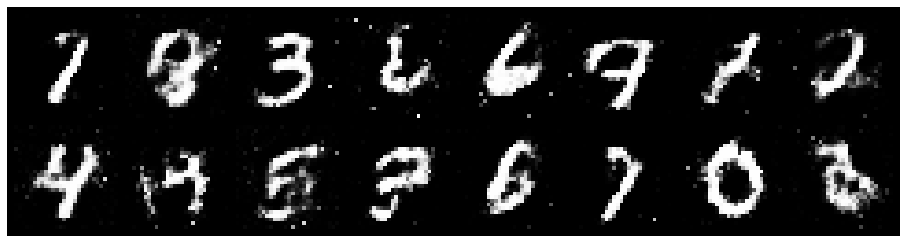

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.2798, Generator Loss: 0.8173
D(x): 0.5368, D(G(z)): 0.4249


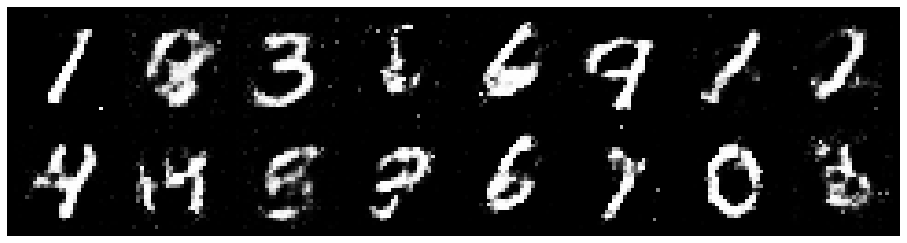

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.2831, Generator Loss: 1.2169
D(x): 0.6180, D(G(z)): 0.4380


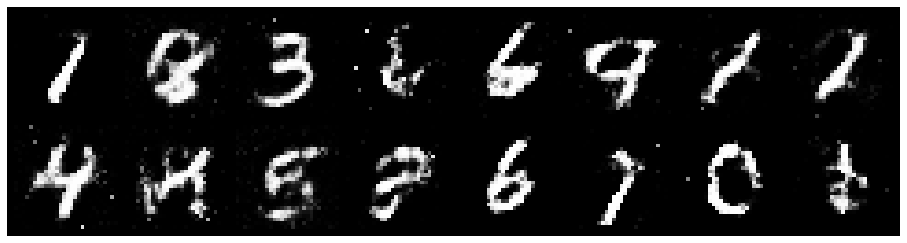

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.2169, Generator Loss: 0.8377
D(x): 0.5901, D(G(z)): 0.4388


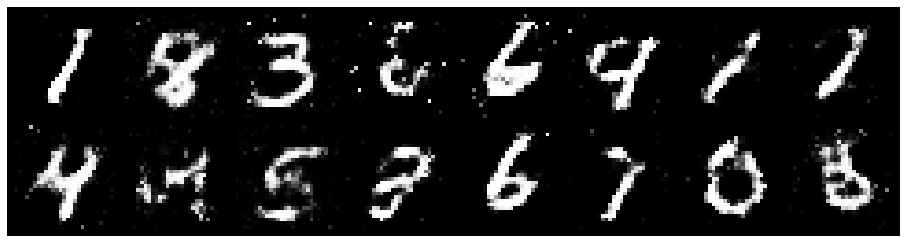

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.1363, Generator Loss: 0.9991
D(x): 0.6072, D(G(z)): 0.4012


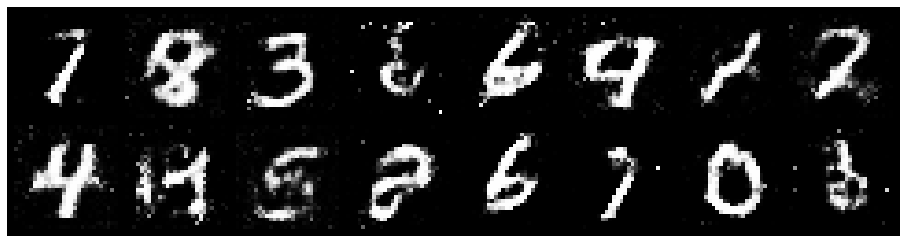

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.2608, Generator Loss: 0.9472
D(x): 0.5914, D(G(z)): 0.4382


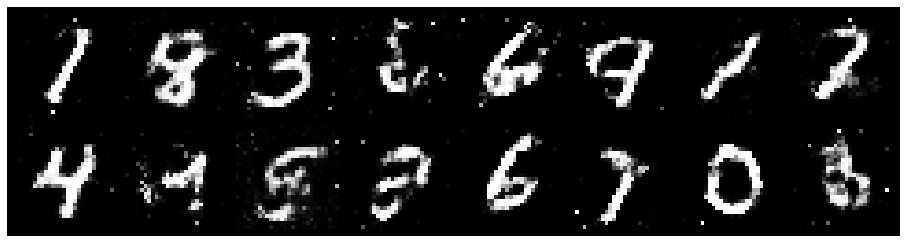

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.1903, Generator Loss: 1.2535
D(x): 0.5517, D(G(z)): 0.3781


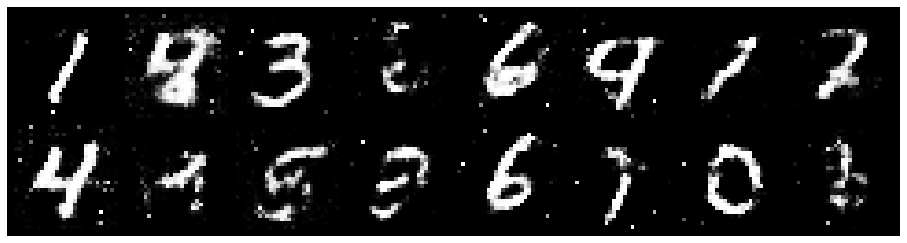

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.2268, Generator Loss: 0.9728
D(x): 0.5765, D(G(z)): 0.4274


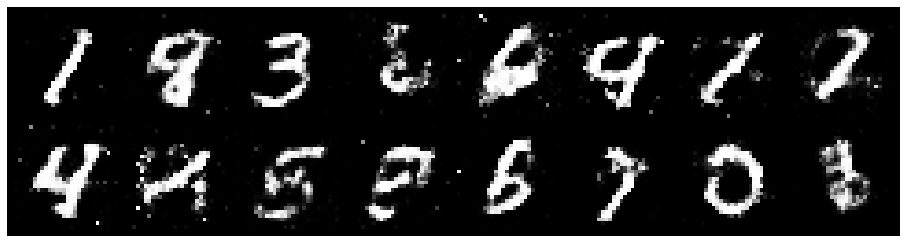

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.1626, Generator Loss: 1.2135
D(x): 0.5988, D(G(z)): 0.3783


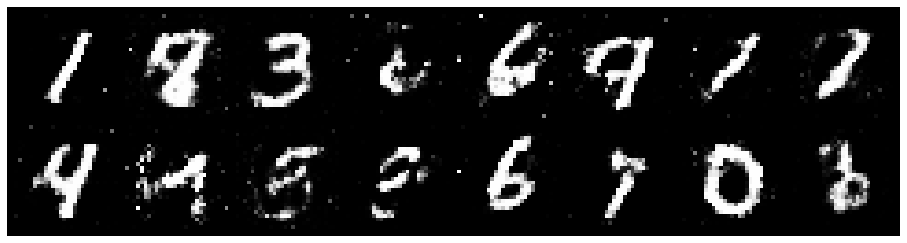

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.1430, Generator Loss: 1.0326
D(x): 0.6385, D(G(z)): 0.4285


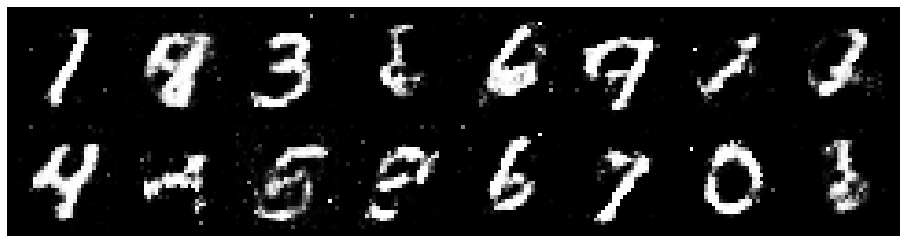

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 0.9921, Generator Loss: 1.1404
D(x): 0.6597, D(G(z)): 0.3659


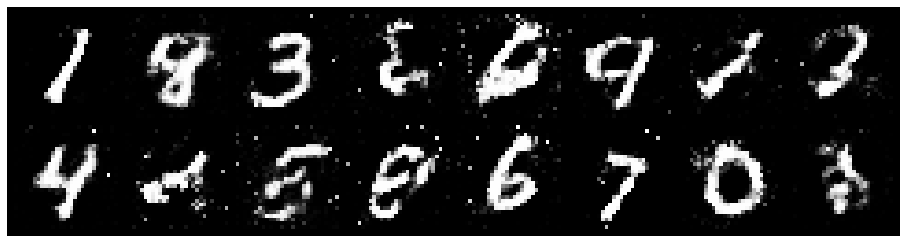

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.0694, Generator Loss: 0.9989
D(x): 0.6121, D(G(z)): 0.3937


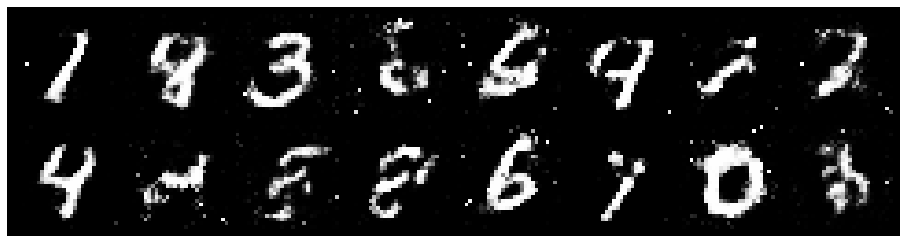

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.1205, Generator Loss: 1.1599
D(x): 0.6042, D(G(z)): 0.3926


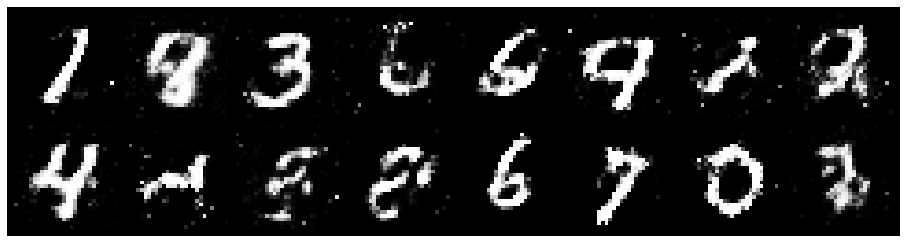

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.2157, Generator Loss: 1.0745
D(x): 0.6768, D(G(z)): 0.4523


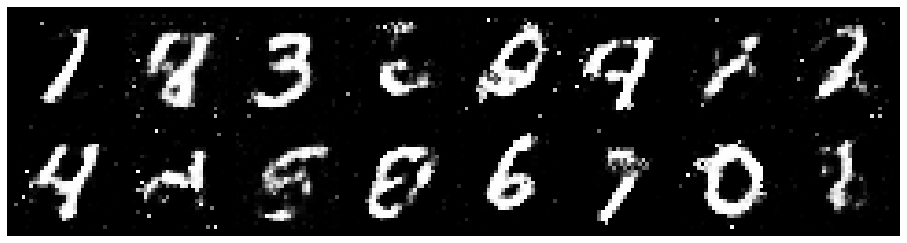

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.1936, Generator Loss: 1.3251
D(x): 0.6815, D(G(z)): 0.4553


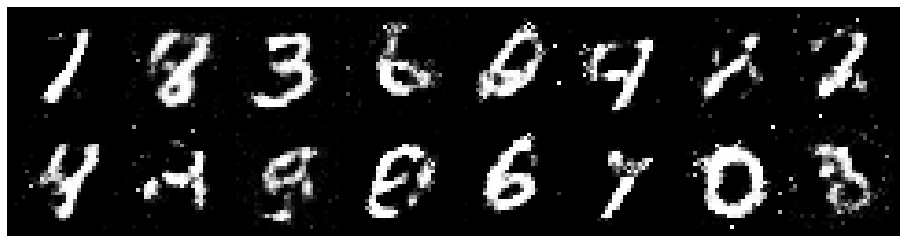

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.2725, Generator Loss: 1.0124
D(x): 0.5845, D(G(z)): 0.4014


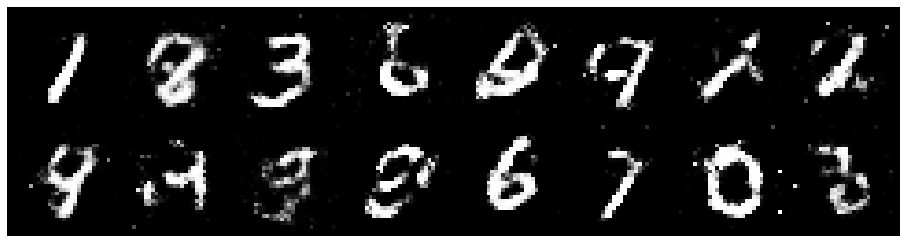

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.1652, Generator Loss: 0.9508
D(x): 0.6225, D(G(z)): 0.4319


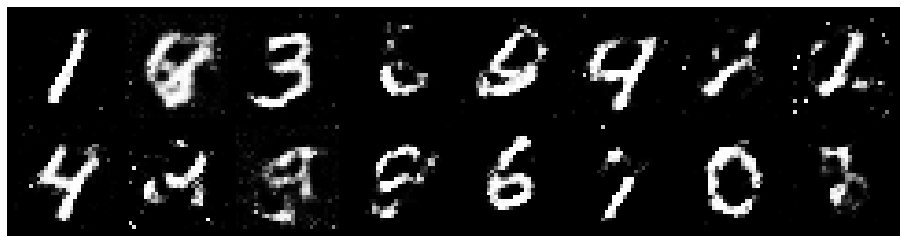

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1316, Generator Loss: 1.2044
D(x): 0.6214, D(G(z)): 0.3867


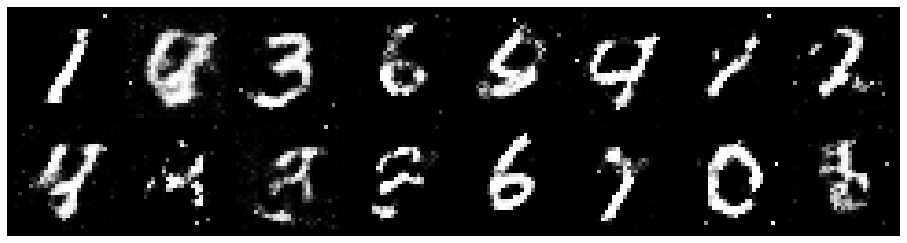

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2673, Generator Loss: 0.9892
D(x): 0.5906, D(G(z)): 0.4337


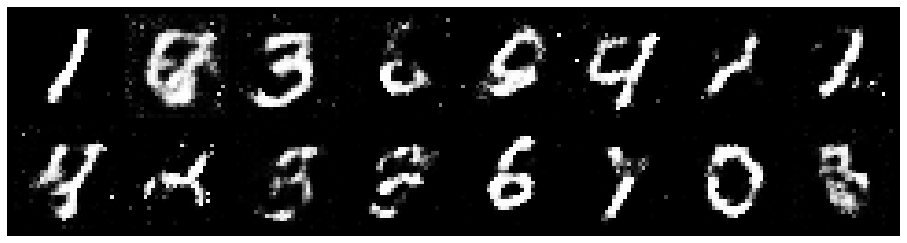

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.0827, Generator Loss: 1.1306
D(x): 0.6415, D(G(z)): 0.3859


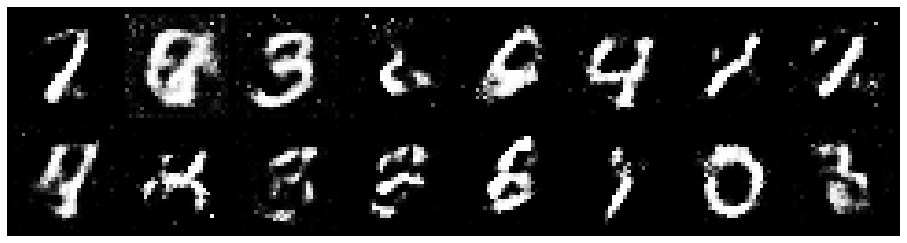

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.2016, Generator Loss: 1.0607
D(x): 0.6083, D(G(z)): 0.3984


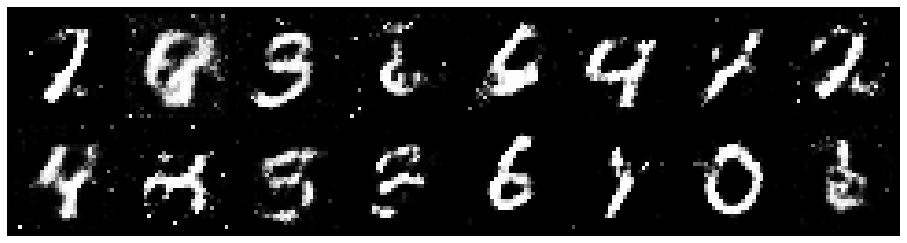

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 0.9512, Generator Loss: 1.5584
D(x): 0.7347, D(G(z)): 0.3600


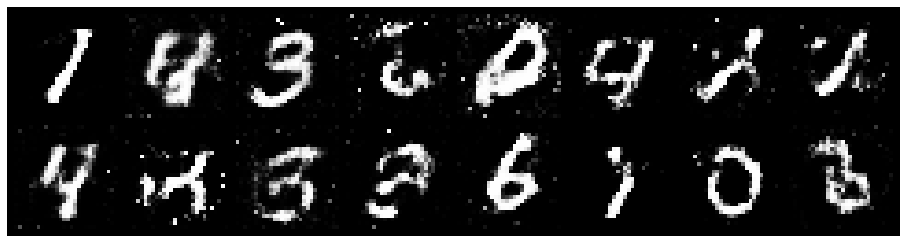

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.0851, Generator Loss: 1.3673
D(x): 0.6171, D(G(z)): 0.3755


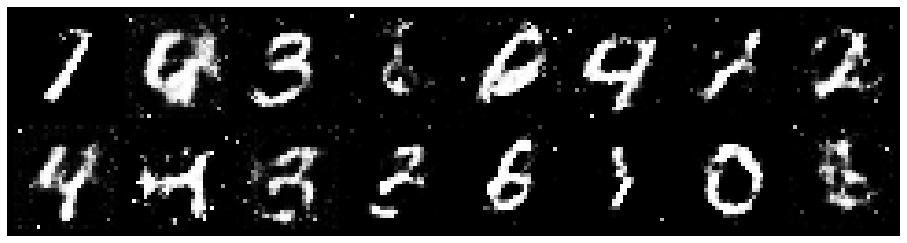

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.0686, Generator Loss: 0.9853
D(x): 0.6101, D(G(z)): 0.3794


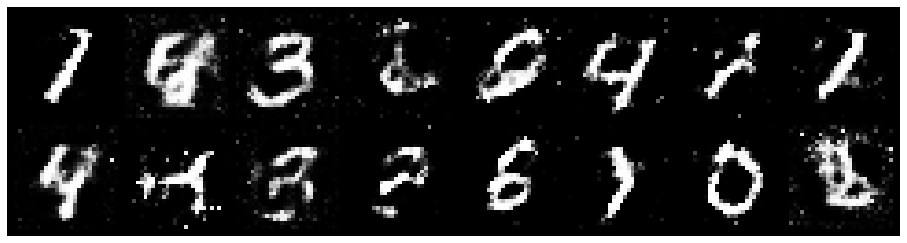

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.2096, Generator Loss: 1.1558
D(x): 0.5024, D(G(z)): 0.3350


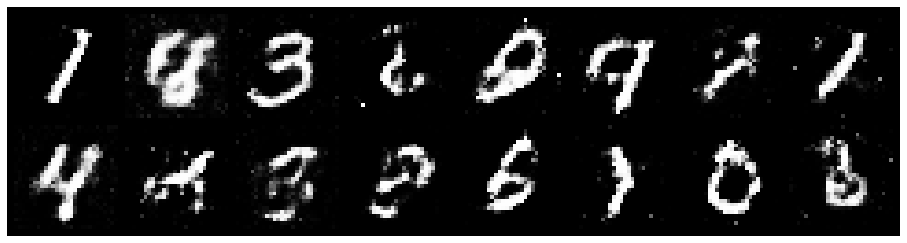

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.0364, Generator Loss: 1.0528
D(x): 0.6507, D(G(z)): 0.3806


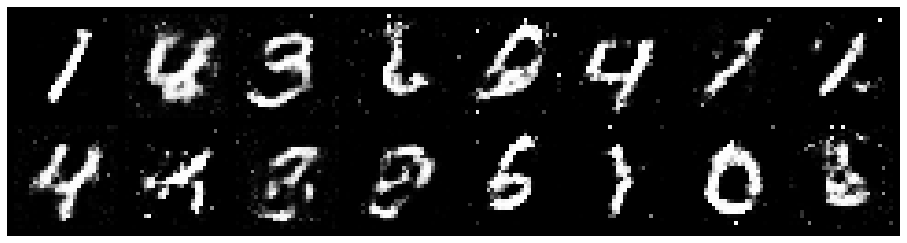

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.2145, Generator Loss: 1.1115
D(x): 0.6095, D(G(z)): 0.4318


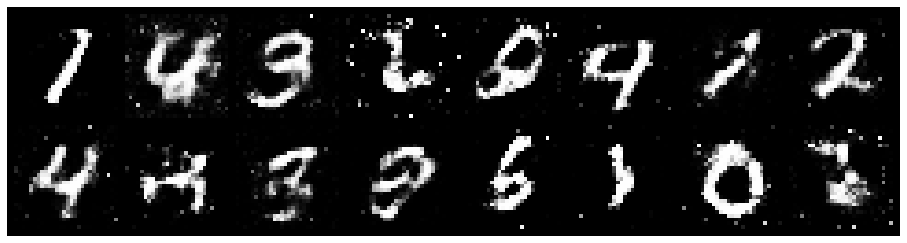

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2826, Generator Loss: 0.9634
D(x): 0.5670, D(G(z)): 0.4487


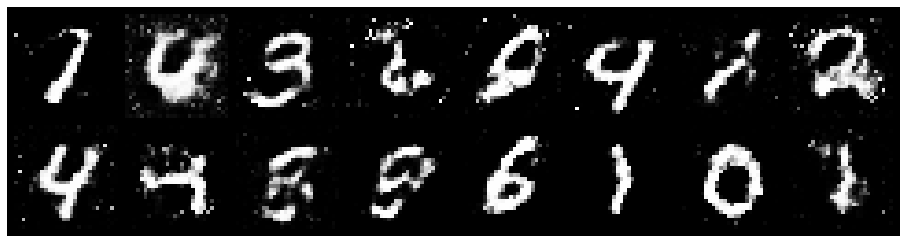

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.2829, Generator Loss: 1.2014
D(x): 0.5834, D(G(z)): 0.4179


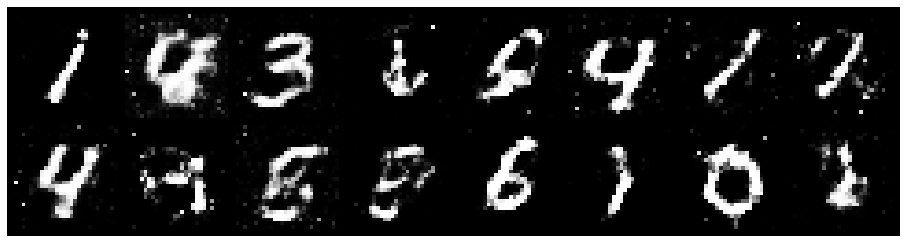

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2742, Generator Loss: 1.0832
D(x): 0.5461, D(G(z)): 0.3861


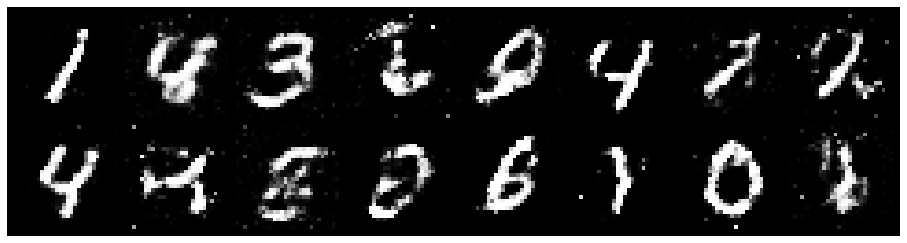

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.1841, Generator Loss: 1.1575
D(x): 0.5611, D(G(z)): 0.3687


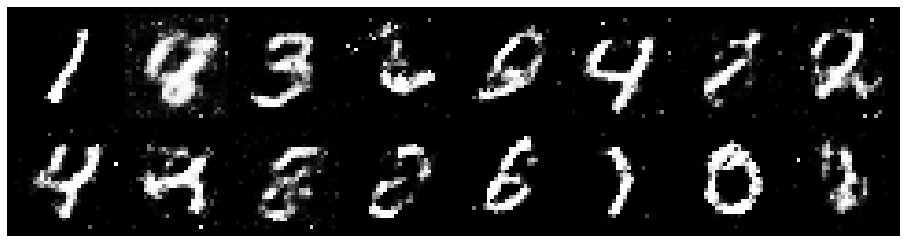

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.2605, Generator Loss: 1.0367
D(x): 0.5852, D(G(z)): 0.4324


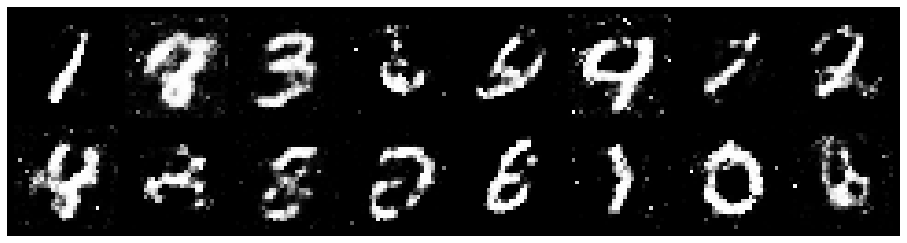

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.1058, Generator Loss: 1.3344
D(x): 0.5891, D(G(z)): 0.3501


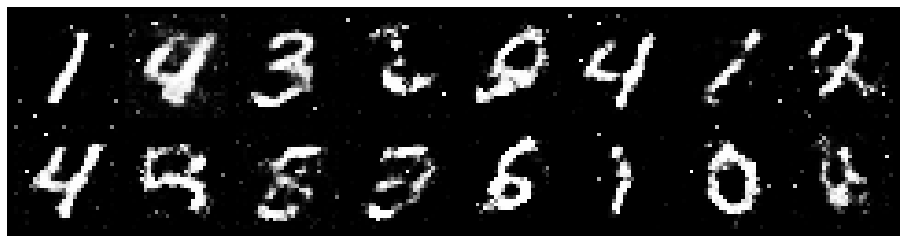

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.2059, Generator Loss: 1.0546
D(x): 0.5784, D(G(z)): 0.4067


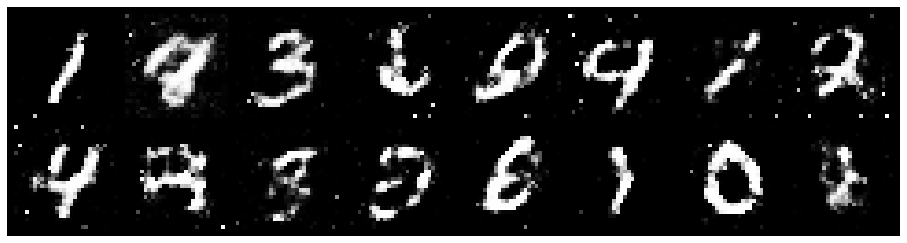

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1499, Generator Loss: 0.9576
D(x): 0.5900, D(G(z)): 0.4029


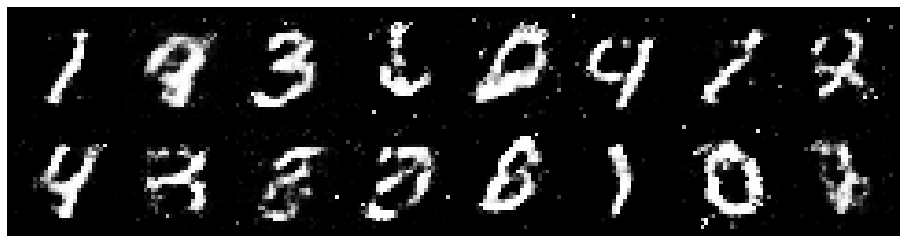

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.1969, Generator Loss: 1.0891
D(x): 0.5803, D(G(z)): 0.4017


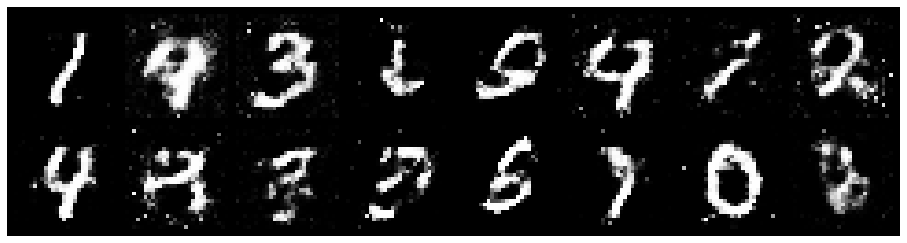

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.2686, Generator Loss: 0.9262
D(x): 0.5666, D(G(z)): 0.4343


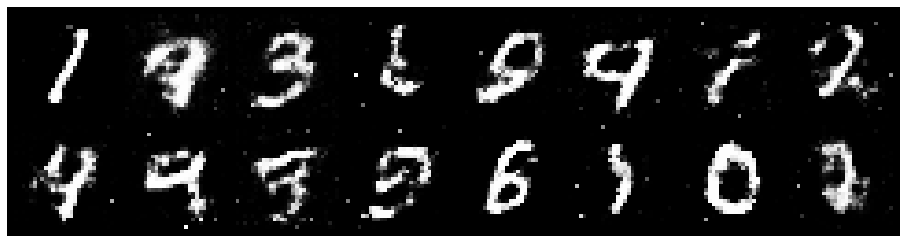

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1684, Generator Loss: 0.8919
D(x): 0.6151, D(G(z)): 0.4510


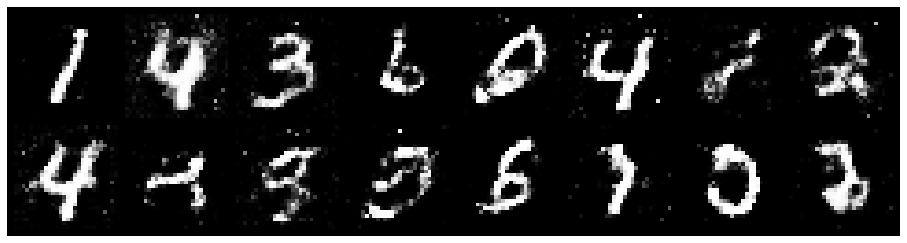

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2198, Generator Loss: 0.8845
D(x): 0.5832, D(G(z)): 0.4447


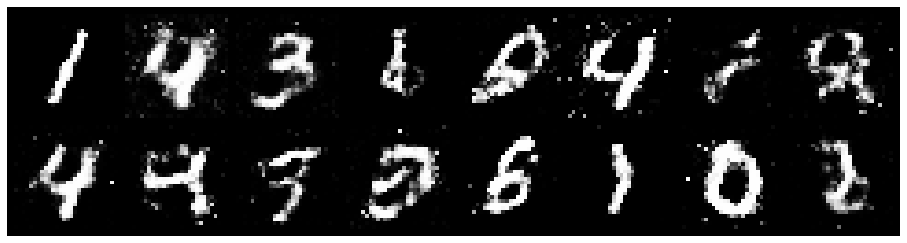

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1153, Generator Loss: 1.1071
D(x): 0.6019, D(G(z)): 0.3707


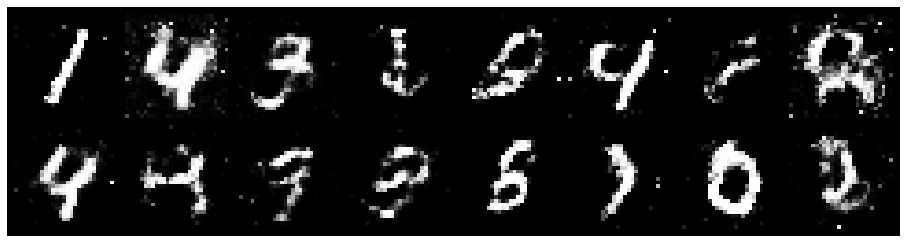

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.2419, Generator Loss: 1.0975
D(x): 0.5628, D(G(z)): 0.4099


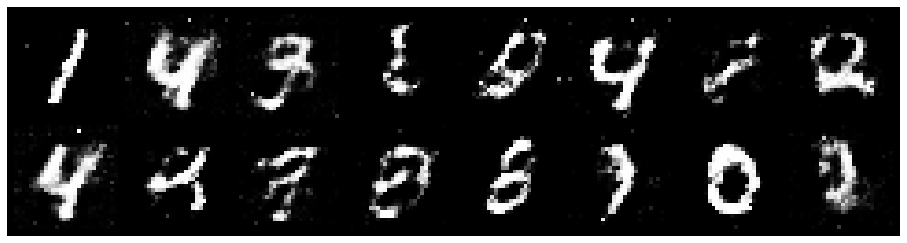

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.2371, Generator Loss: 0.7521
D(x): 0.6014, D(G(z)): 0.4597


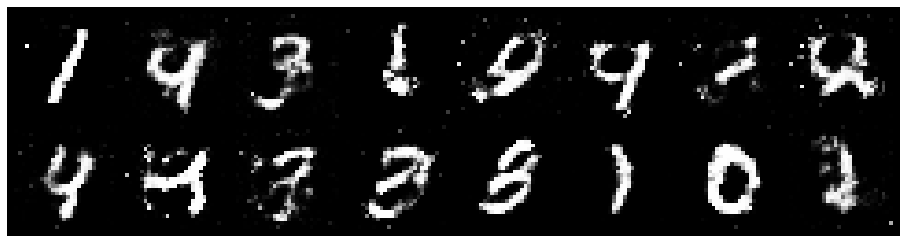

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.2222, Generator Loss: 1.0626
D(x): 0.6162, D(G(z)): 0.4069


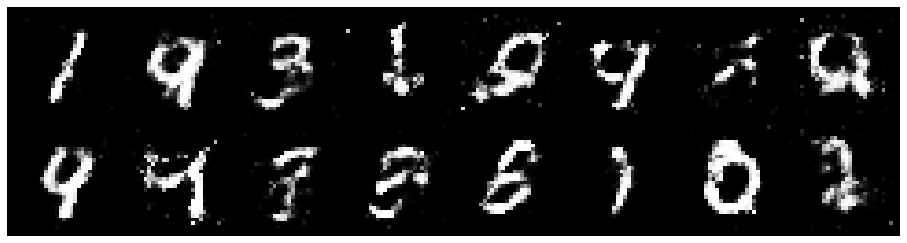

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.3605, Generator Loss: 1.1559
D(x): 0.5964, D(G(z)): 0.4772


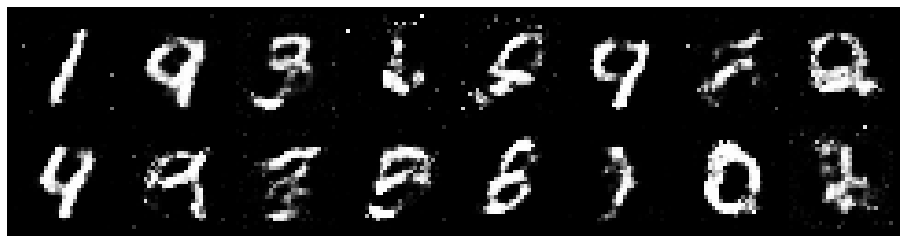

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.3426, Generator Loss: 0.9599
D(x): 0.5802, D(G(z)): 0.4609


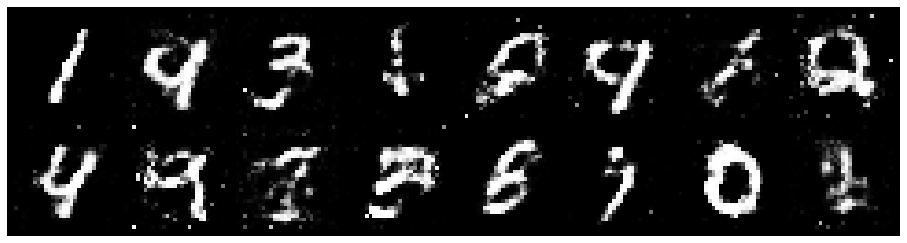

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.1392, Generator Loss: 0.8760
D(x): 0.5749, D(G(z)): 0.3639


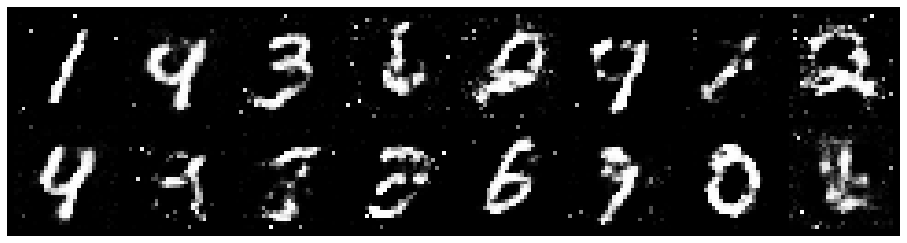

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.2086, Generator Loss: 0.9779
D(x): 0.5388, D(G(z)): 0.3568


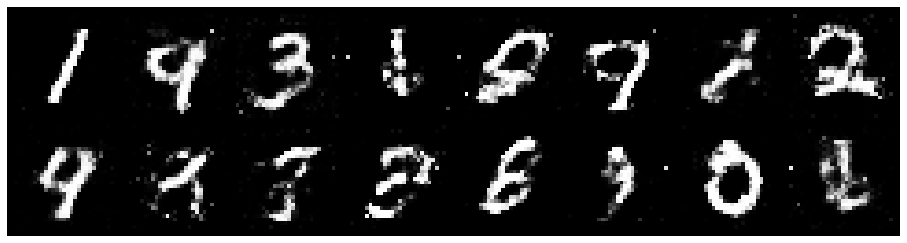

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.2775, Generator Loss: 1.1190
D(x): 0.5201, D(G(z)): 0.3846


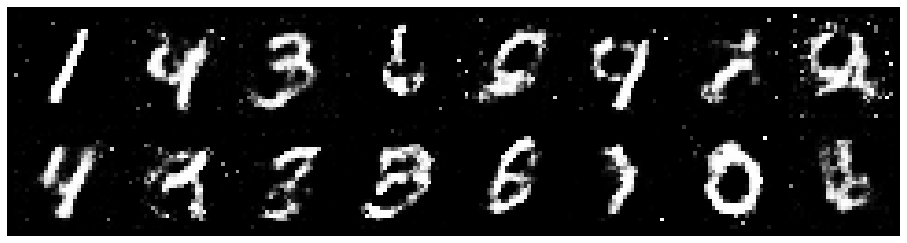

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.2627, Generator Loss: 0.9705
D(x): 0.5803, D(G(z)): 0.4147


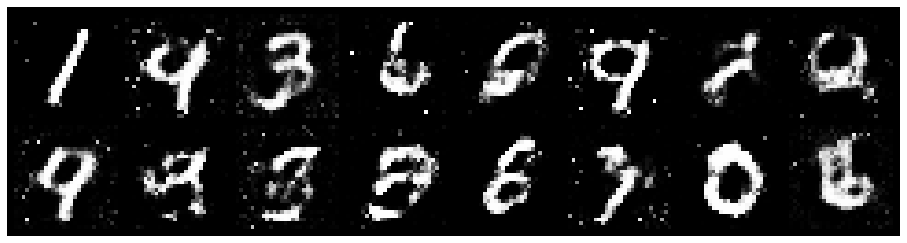

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.1716, Generator Loss: 1.2532
D(x): 0.5761, D(G(z)): 0.3734


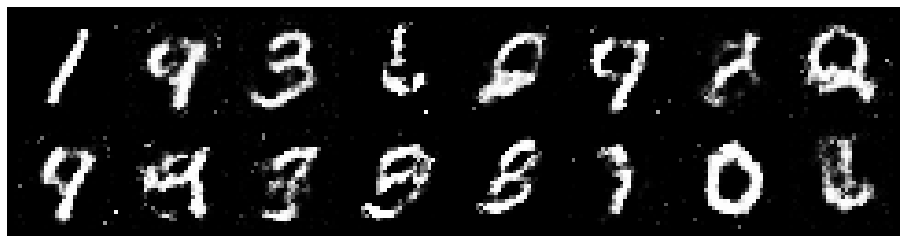

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1909, Generator Loss: 0.9965
D(x): 0.6561, D(G(z)): 0.4492


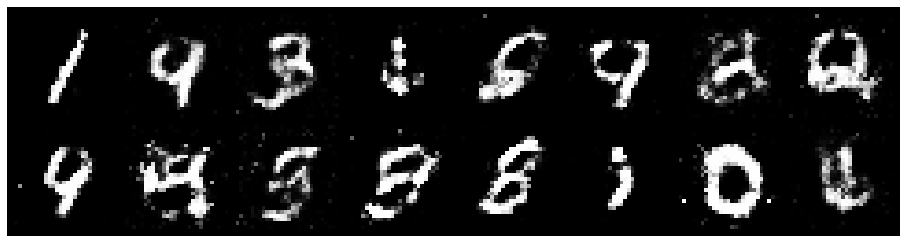

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.0745, Generator Loss: 0.9103
D(x): 0.6428, D(G(z)): 0.4086


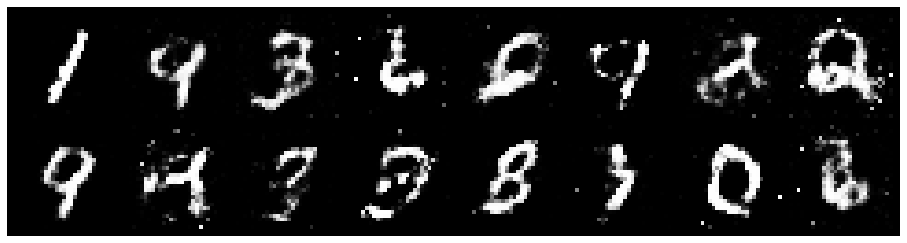

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.1611, Generator Loss: 1.0304
D(x): 0.6087, D(G(z)): 0.4354


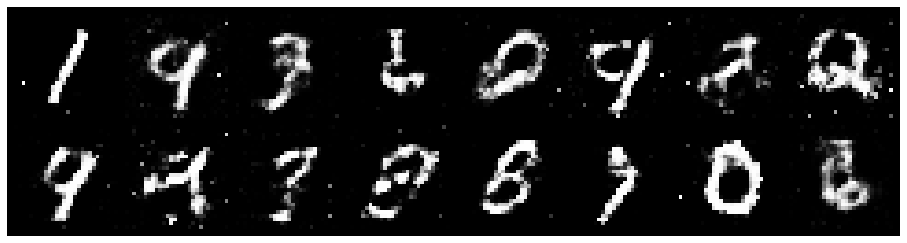

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.1258, Generator Loss: 0.9820
D(x): 0.6048, D(G(z)): 0.4040


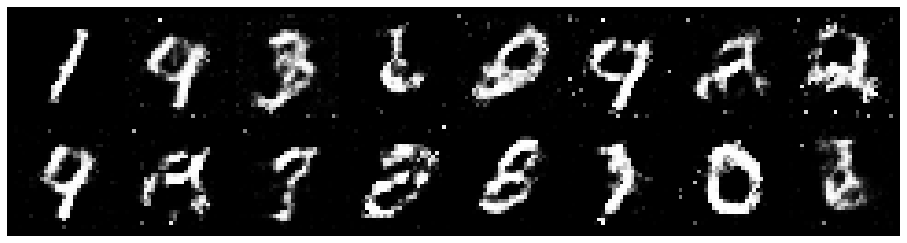

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.2400, Generator Loss: 0.9364
D(x): 0.5692, D(G(z)): 0.4221


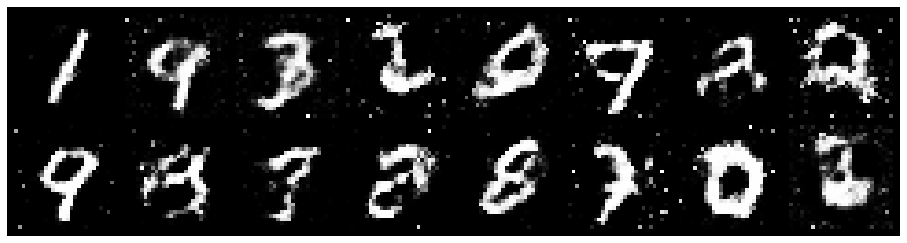

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.2339, Generator Loss: 0.8742
D(x): 0.5795, D(G(z)): 0.4420


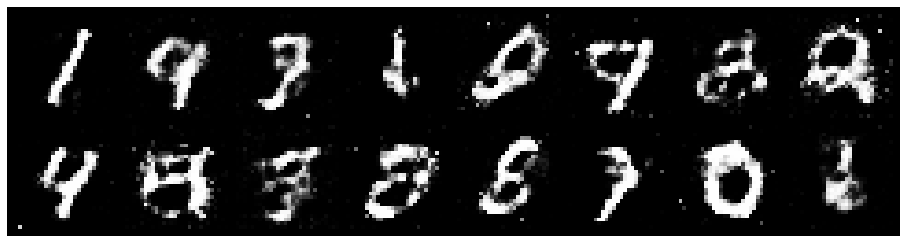

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1126, Generator Loss: 1.1235
D(x): 0.6081, D(G(z)): 0.3642


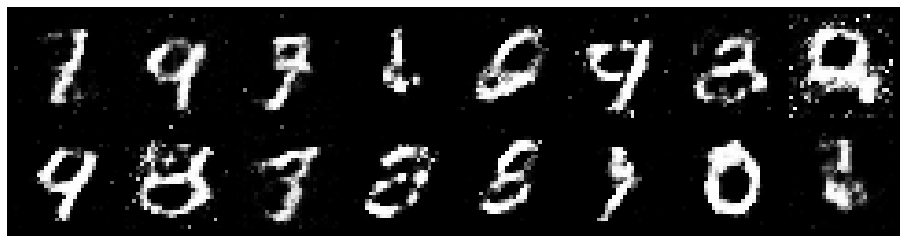

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2521, Generator Loss: 0.8431
D(x): 0.5833, D(G(z)): 0.4660


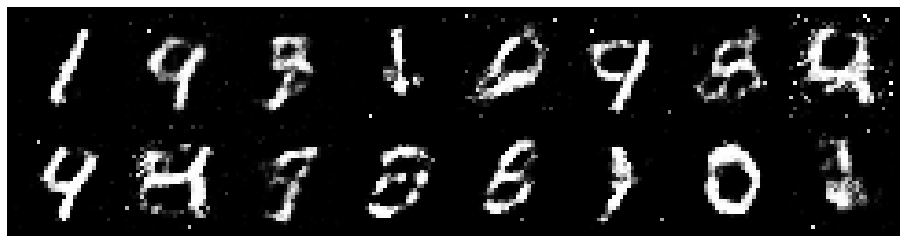

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.2860, Generator Loss: 0.9102
D(x): 0.5430, D(G(z)): 0.4305


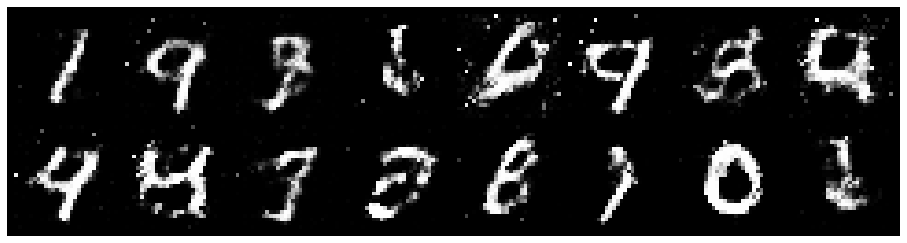

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.2716, Generator Loss: 0.7928
D(x): 0.6303, D(G(z)): 0.4924


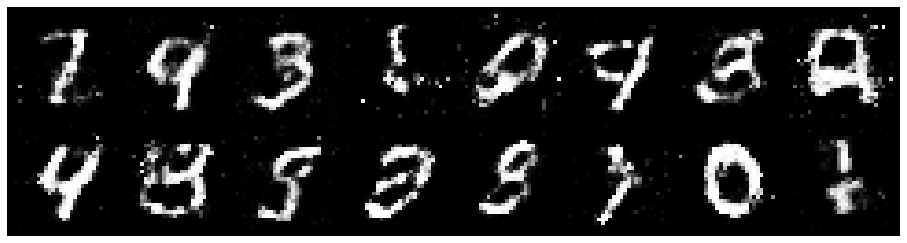

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.2464, Generator Loss: 0.9350
D(x): 0.5634, D(G(z)): 0.4153


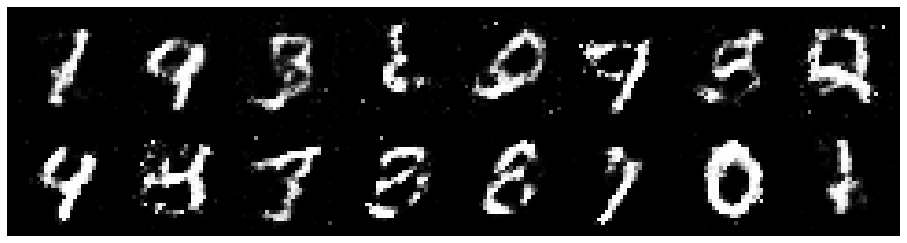

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.1969, Generator Loss: 1.1096
D(x): 0.6209, D(G(z)): 0.4188


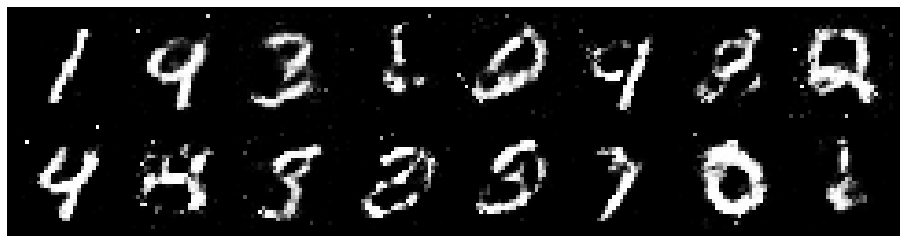

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.1891, Generator Loss: 0.9400
D(x): 0.6383, D(G(z)): 0.4584


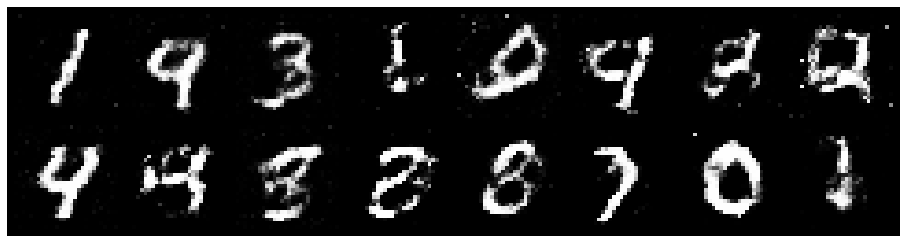

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.1445, Generator Loss: 1.3706
D(x): 0.5695, D(G(z)): 0.3251


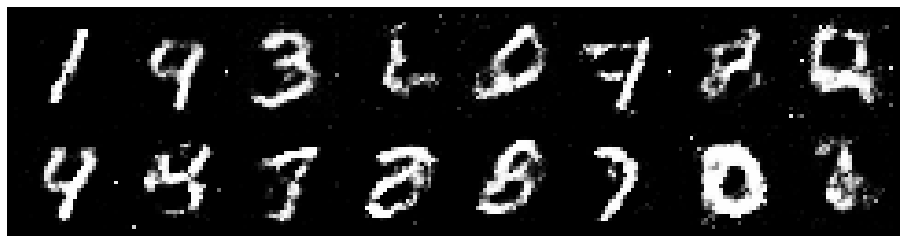

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.1838, Generator Loss: 0.9258
D(x): 0.5894, D(G(z)): 0.4244


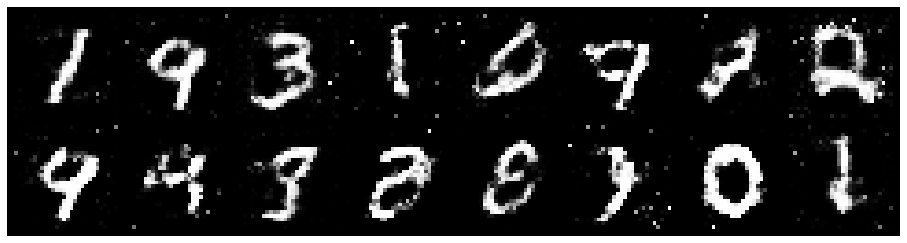

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.0501, Generator Loss: 1.0876
D(x): 0.6310, D(G(z)): 0.3669


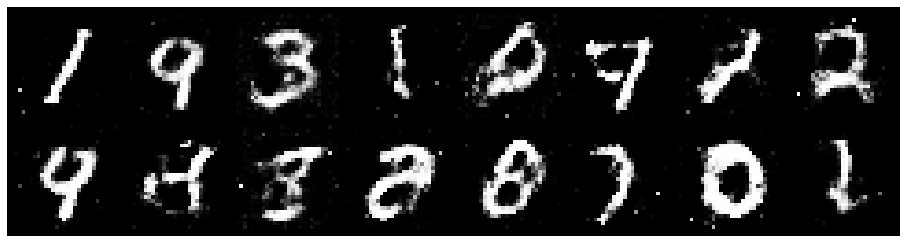

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.1641, Generator Loss: 1.2229
D(x): 0.6159, D(G(z)): 0.4072


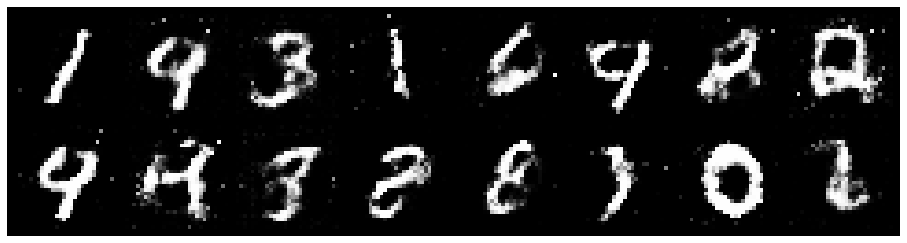

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.1644, Generator Loss: 1.2352
D(x): 0.6144, D(G(z)): 0.3971


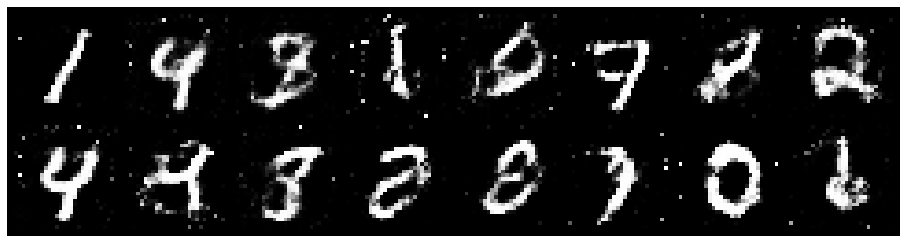

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.1712, Generator Loss: 1.1233
D(x): 0.6326, D(G(z)): 0.4417


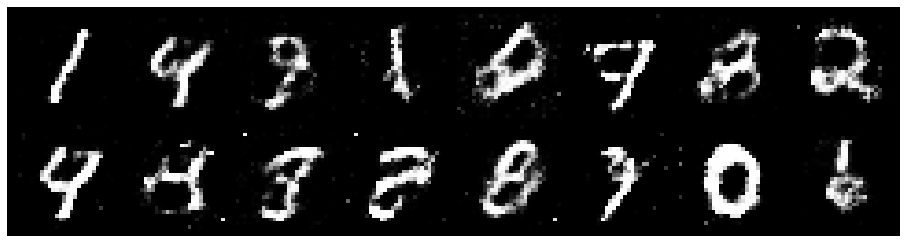

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.1224, Generator Loss: 1.0982
D(x): 0.6408, D(G(z)): 0.4042


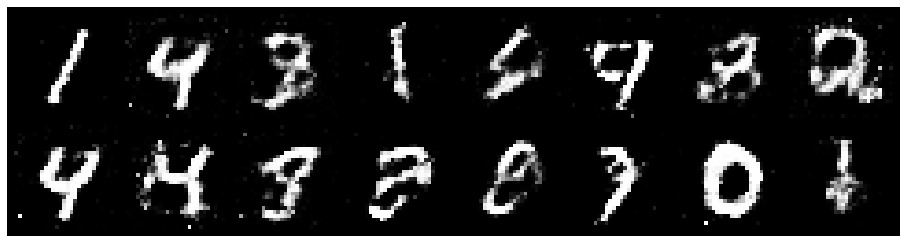

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.1705, Generator Loss: 0.8354
D(x): 0.6213, D(G(z)): 0.4564


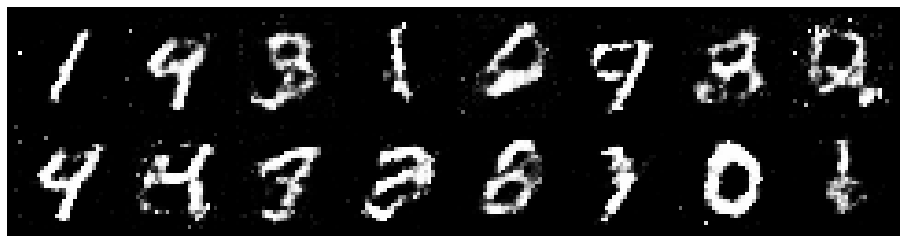

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.1508, Generator Loss: 1.2061
D(x): 0.5835, D(G(z)): 0.3587


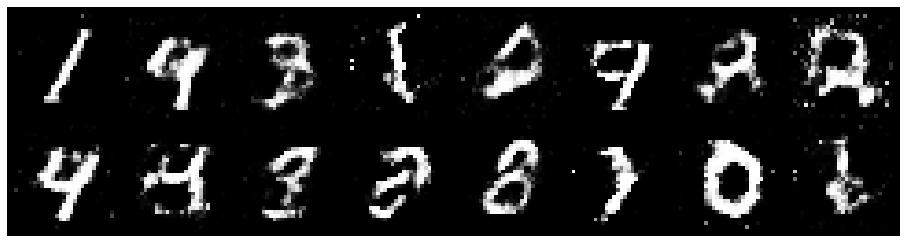

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2253, Generator Loss: 1.0819
D(x): 0.6048, D(G(z)): 0.4164


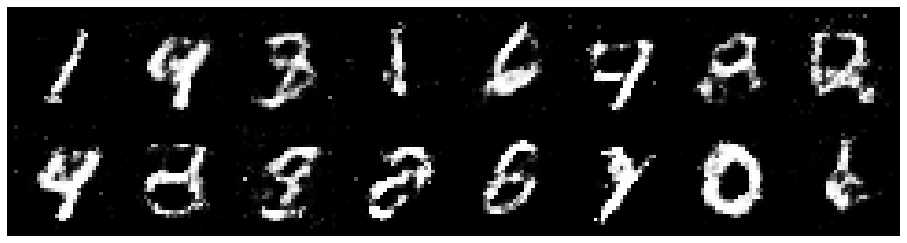

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.2190, Generator Loss: 1.0840
D(x): 0.5888, D(G(z)): 0.4198


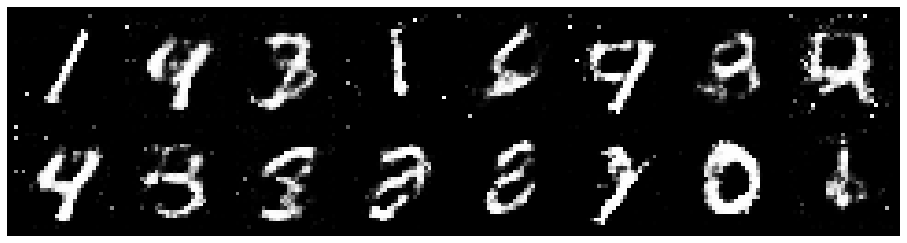

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.0786, Generator Loss: 1.2682
D(x): 0.6047, D(G(z)): 0.3653


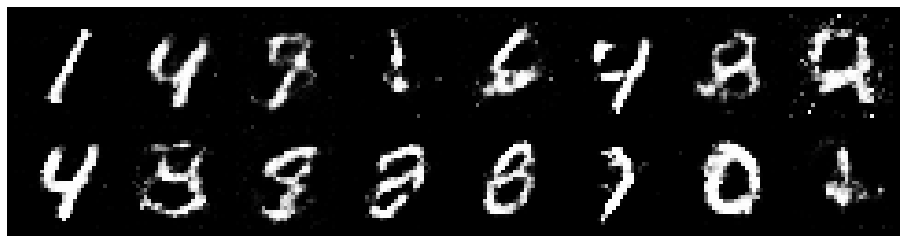

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.3113, Generator Loss: 0.9986
D(x): 0.6214, D(G(z)): 0.5001


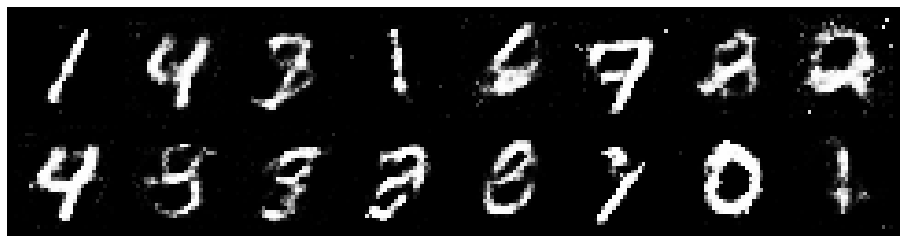

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.1781, Generator Loss: 1.1107
D(x): 0.6273, D(G(z)): 0.4216


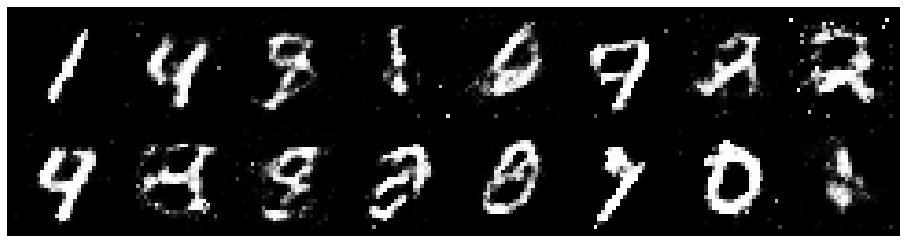

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.2157, Generator Loss: 0.9700
D(x): 0.5655, D(G(z)): 0.3671


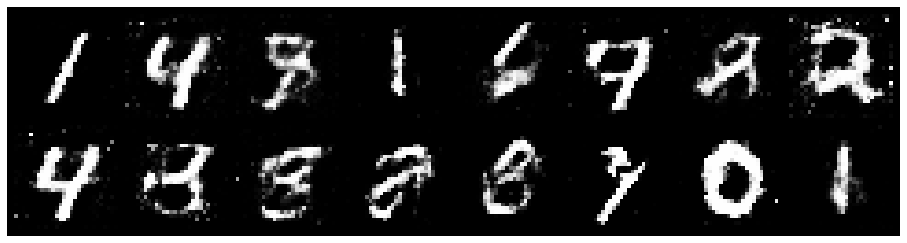

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.1577, Generator Loss: 0.9360
D(x): 0.6681, D(G(z)): 0.4455


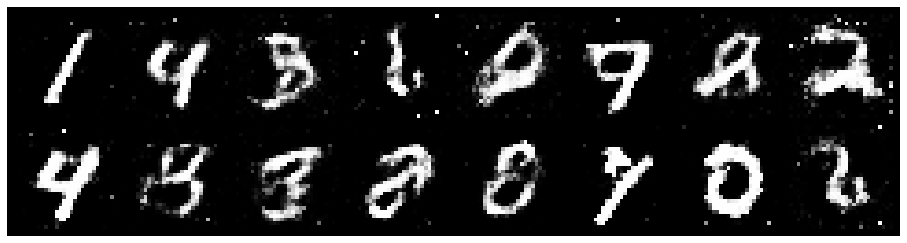

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.1034, Generator Loss: 1.0746
D(x): 0.6191, D(G(z)): 0.3911


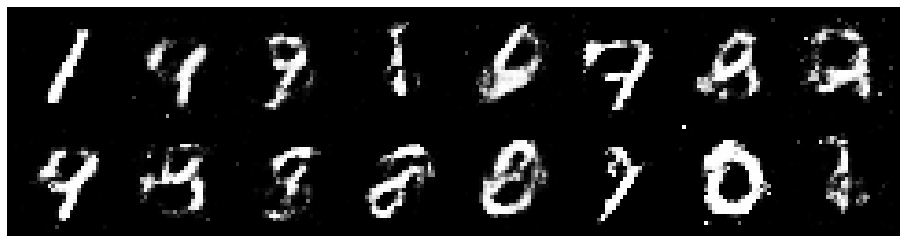

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2622, Generator Loss: 1.1444
D(x): 0.5415, D(G(z)): 0.4048


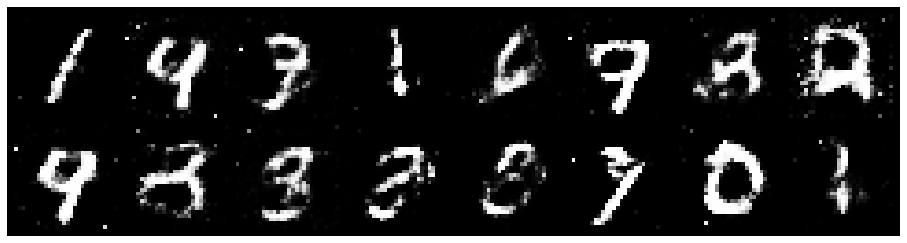

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.2977, Generator Loss: 1.0847
D(x): 0.5446, D(G(z)): 0.4231


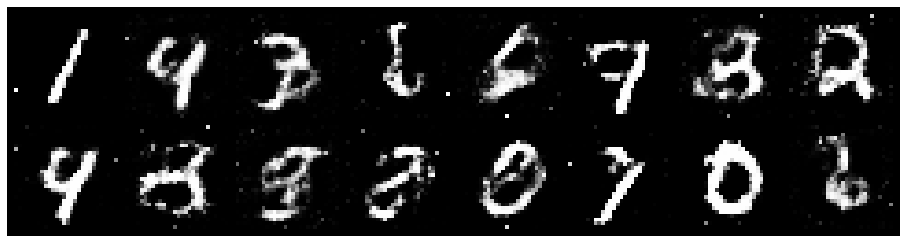

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1944, Generator Loss: 0.9604
D(x): 0.5748, D(G(z)): 0.4040


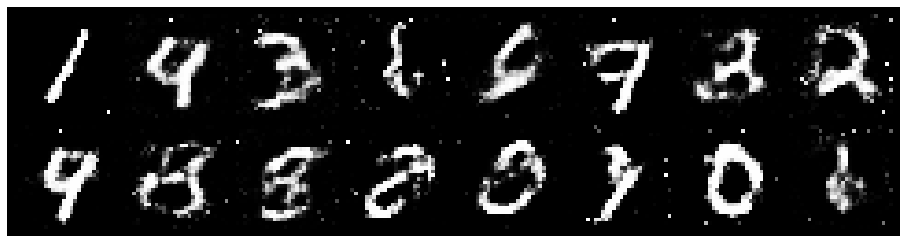

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.2488, Generator Loss: 0.9593
D(x): 0.5389, D(G(z)): 0.3977


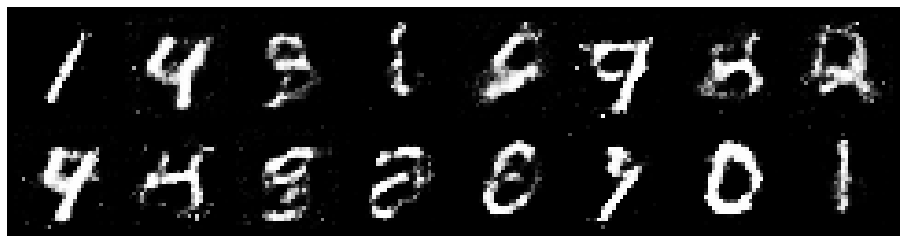

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.1399, Generator Loss: 1.2180
D(x): 0.5666, D(G(z)): 0.3500


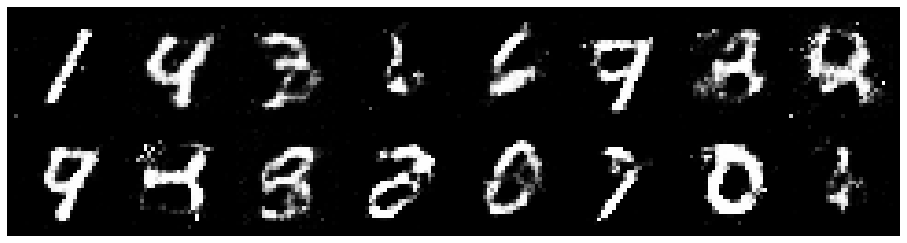

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.1217, Generator Loss: 1.1019
D(x): 0.6396, D(G(z)): 0.4264


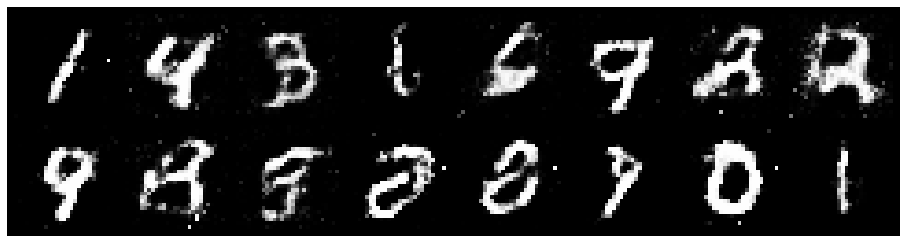

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.2453, Generator Loss: 1.2146
D(x): 0.5014, D(G(z)): 0.3454


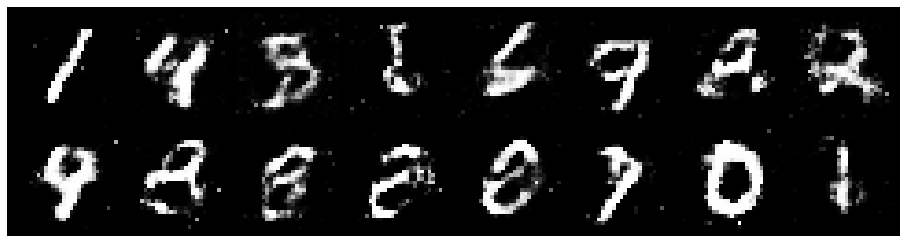

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.1674, Generator Loss: 1.3174
D(x): 0.5753, D(G(z)): 0.3479


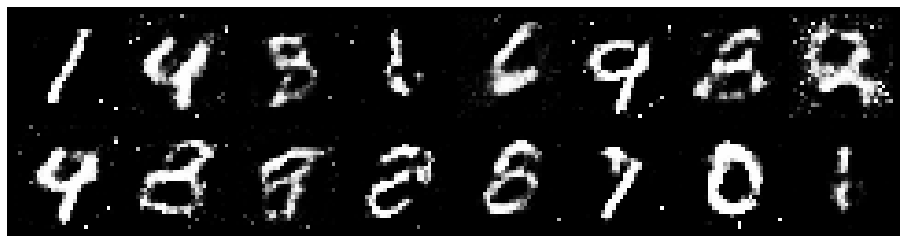

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.1096, Generator Loss: 1.3178
D(x): 0.6154, D(G(z)): 0.3840


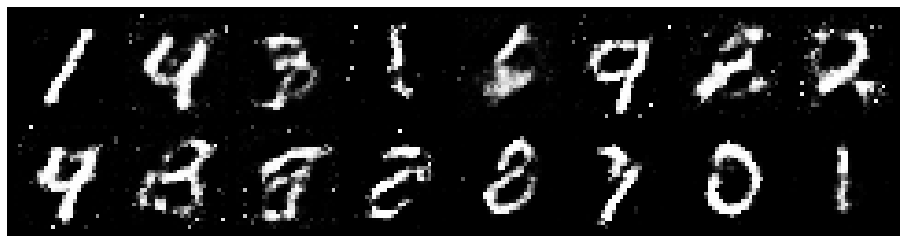

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.2283, Generator Loss: 0.9414
D(x): 0.6150, D(G(z)): 0.4686


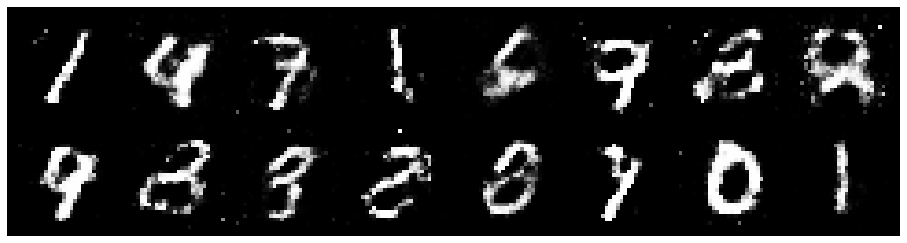

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.1888, Generator Loss: 0.9203
D(x): 0.5665, D(G(z)): 0.4279


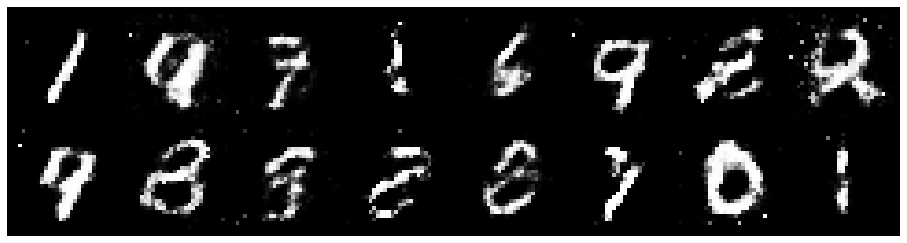

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.1605, Generator Loss: 0.9437
D(x): 0.5643, D(G(z)): 0.3898


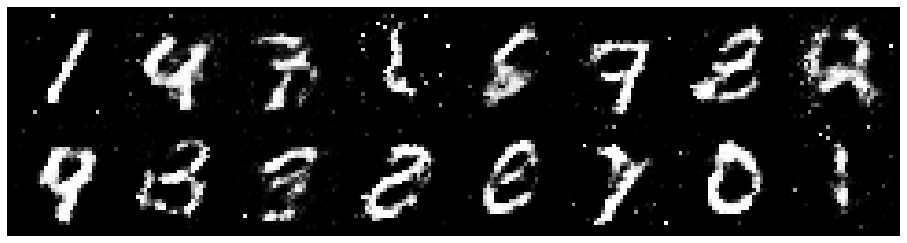

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1701, Generator Loss: 0.9969
D(x): 0.5858, D(G(z)): 0.4223


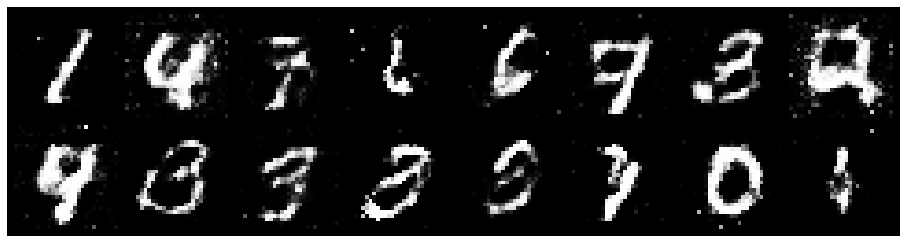

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.2048, Generator Loss: 0.9183
D(x): 0.5730, D(G(z)): 0.4250


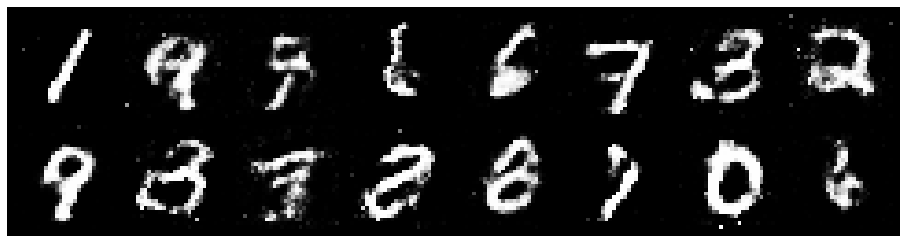

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.2992, Generator Loss: 0.9675
D(x): 0.5739, D(G(z)): 0.4602


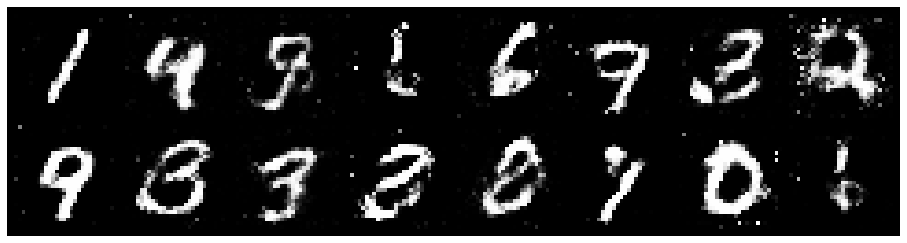

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.1505, Generator Loss: 0.9414
D(x): 0.6045, D(G(z)): 0.4164


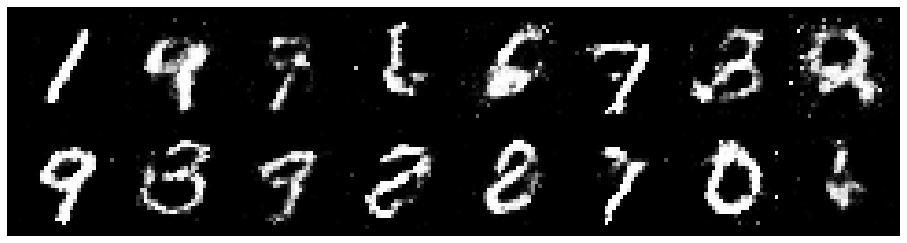

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.1329, Generator Loss: 1.0935
D(x): 0.5947, D(G(z)): 0.3995


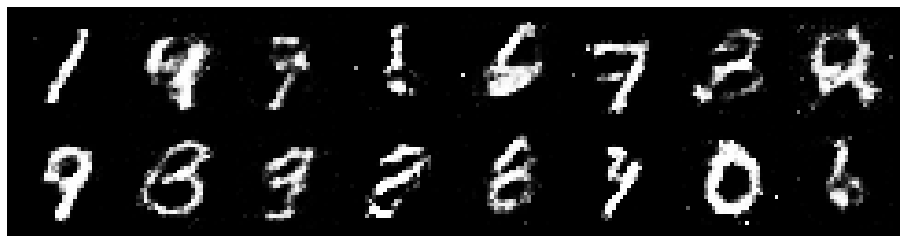

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.1430, Generator Loss: 1.1143
D(x): 0.6108, D(G(z)): 0.4123


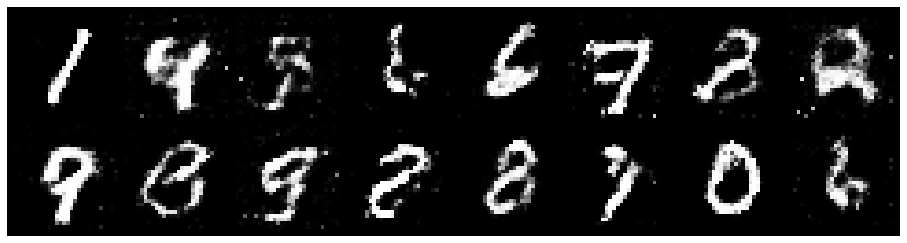

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.2202, Generator Loss: 0.9341
D(x): 0.5559, D(G(z)): 0.4290


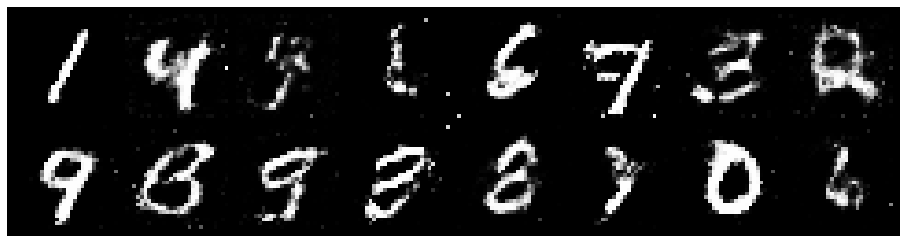

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.2393, Generator Loss: 0.9067
D(x): 0.5605, D(G(z)): 0.4374


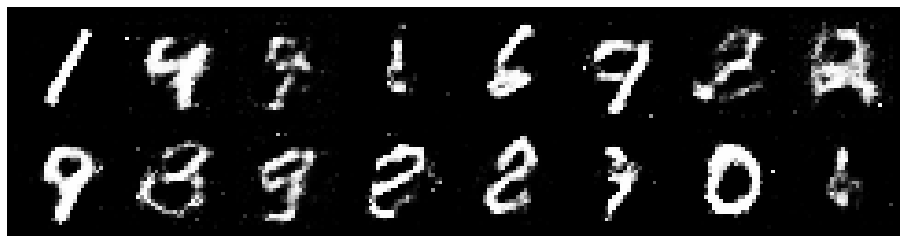

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.2075, Generator Loss: 0.8601
D(x): 0.6010, D(G(z)): 0.4522


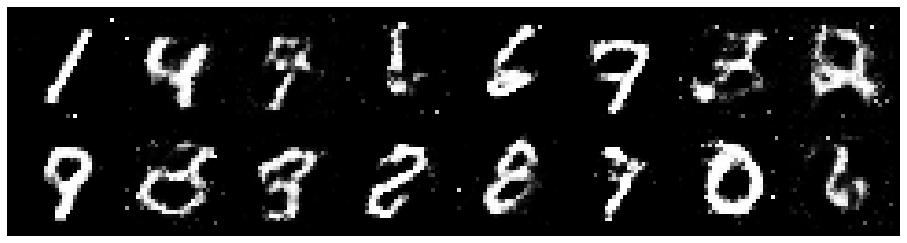

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.1793, Generator Loss: 1.1288
D(x): 0.6040, D(G(z)): 0.4349


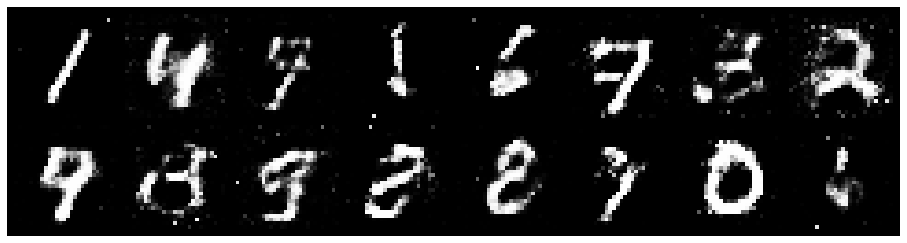

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.1264, Generator Loss: 1.2105
D(x): 0.6375, D(G(z)): 0.4149


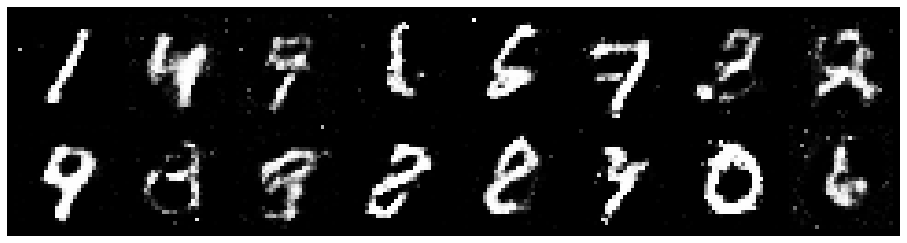

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.3043, Generator Loss: 0.9462
D(x): 0.5518, D(G(z)): 0.4160


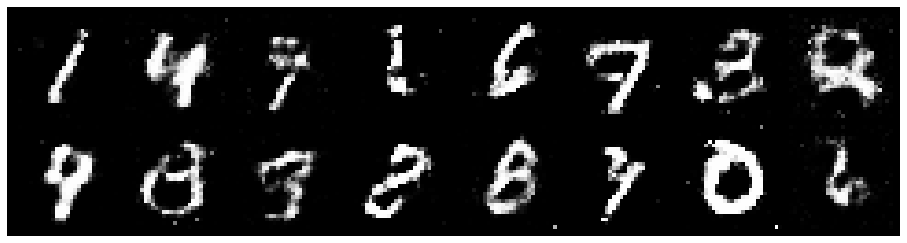

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.2573, Generator Loss: 1.0215
D(x): 0.5806, D(G(z)): 0.4539


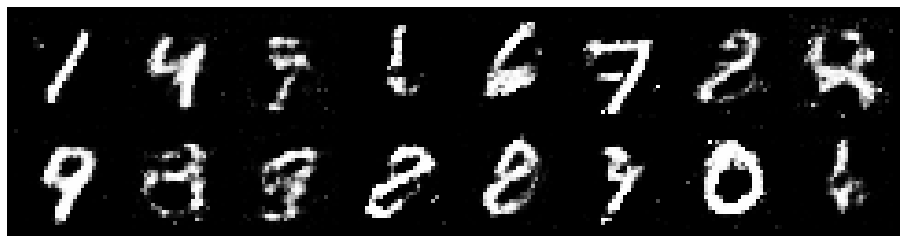

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.1323, Generator Loss: 0.9634
D(x): 0.6083, D(G(z)): 0.4099


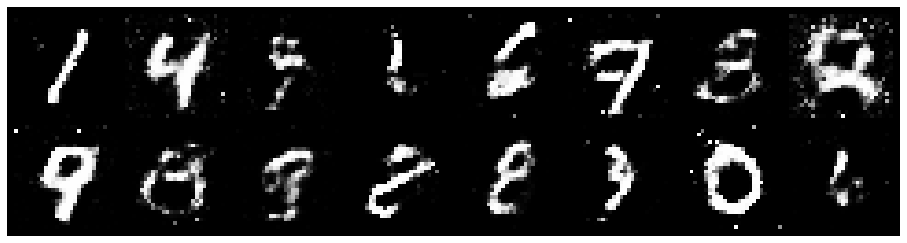

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.1791, Generator Loss: 1.0283
D(x): 0.5628, D(G(z)): 0.4015


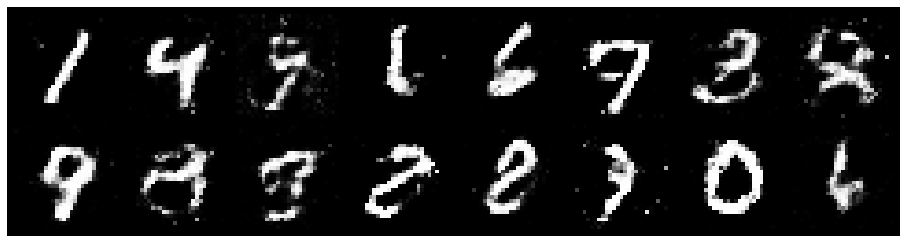

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.2980, Generator Loss: 0.8999
D(x): 0.5924, D(G(z)): 0.4706


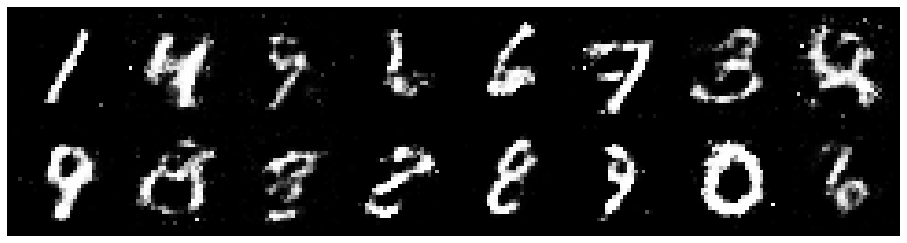

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.2159, Generator Loss: 0.9987
D(x): 0.5613, D(G(z)): 0.3996


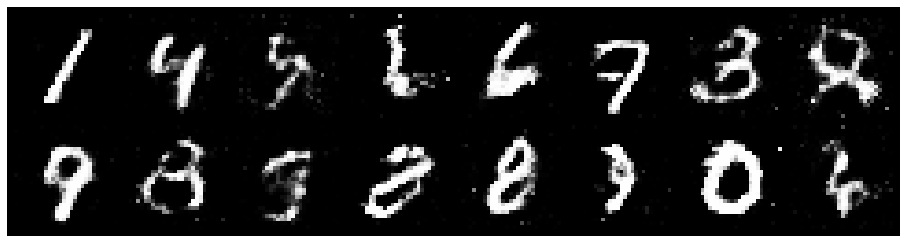

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.1997, Generator Loss: 0.8538
D(x): 0.6086, D(G(z)): 0.4439


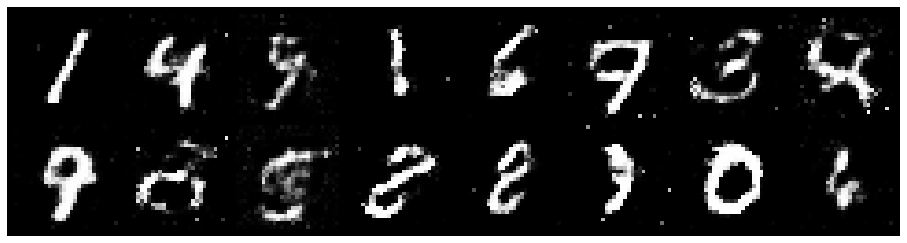

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.3567, Generator Loss: 0.8694
D(x): 0.5297, D(G(z)): 0.4538


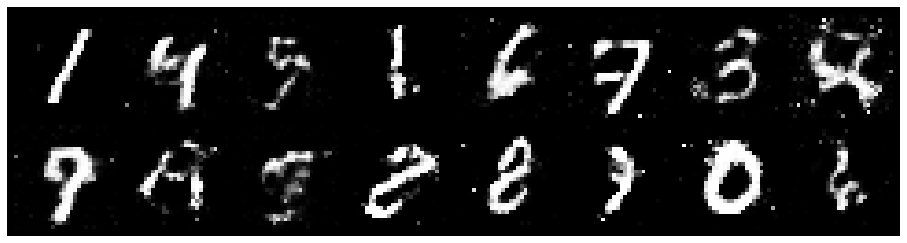

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.2028, Generator Loss: 0.8233
D(x): 0.5928, D(G(z)): 0.4313


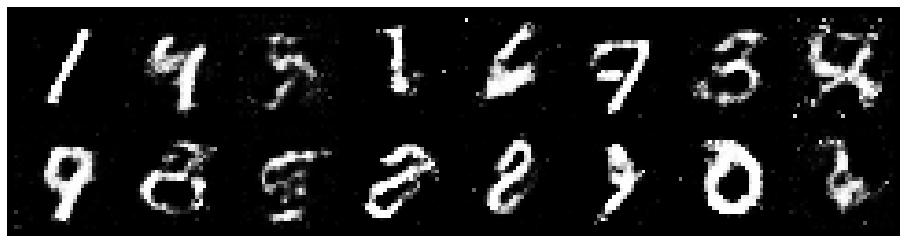

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.3060, Generator Loss: 0.8452
D(x): 0.5603, D(G(z)): 0.4488


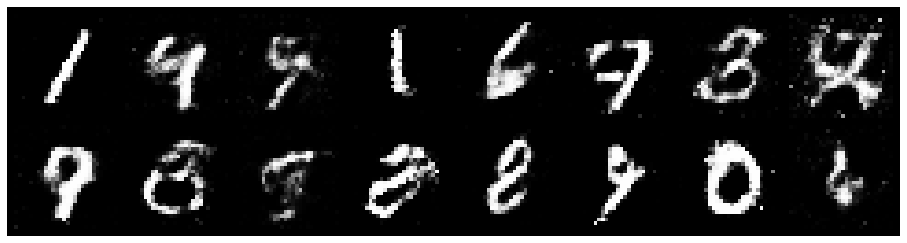

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.2017, Generator Loss: 0.9833
D(x): 0.5874, D(G(z)): 0.4254


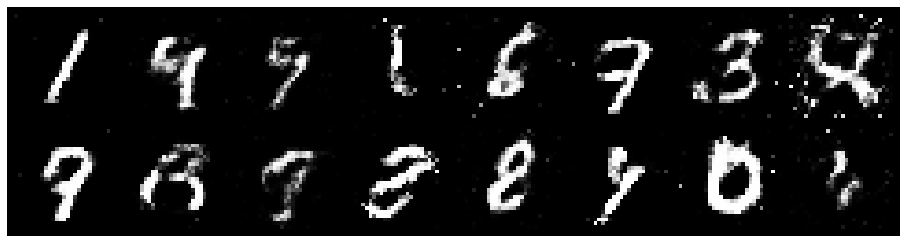

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.3446, Generator Loss: 0.8556
D(x): 0.5306, D(G(z)): 0.4693


In [ ]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')# Total number of epochs to train
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator        # Generate fake data
        fake_data = generator(noise(N))        # Train G
        g_error = train_generator(g_optimizer, fake_data)        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data            
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )